In [3]:
#install missing libraries after update
!pip install boto3
!pip install delorean
!pip install bs4
!pip install zenpy
!pip install stripe
!pip install slack
!pip install slacker
!pip install fastparquet
!pip install plotly
!pip install jupyterthemes
!pip install pandasql
!pip install gspread
!pip install gspread_dataframe
!pip install spam_lists
!pip install nltk
!pip install shap

from my_set_up import *
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import time
import pandas as pd
import itertools
import spam_lists
pd.set_option('display.float_format', '{:.2f}'.format)
# pd.options.display.precision = 2
# pd.options.display.max_rows = 10

# Query/Data

### High Risk Registration Model (Static scores; must adjust manually)

In [14]:
# Gibberish Detecting Functions
"""
Gibberish Classifier
Author: ProgramFOX
Licensed under CPOL v1.02: http://www.codeproject.com/info/cpol10.aspx
"""

# from __future__ import division
import re
import math

def split_in_chunks(text, chunk_size):
    chunks = []
    for i in range(0, len(text), chunk_size):
        chunks.append(text[i:i + chunk_size])
    if len(chunks) > 1 and len(chunks[-1]) < 10:
        chunks[-2] += chunks[-1]
        chunks.pop(-1)
    return chunks


def unique_chars_per_chunk_percentage(text, chunk_size):
    chunks = split_in_chunks(text, chunk_size)
    unique_chars_percentages = []
    for chunk in chunks:
        total = len(chunk)
        unique = len(set(chunk))
        unique_chars_percentages.append(unique / total)
    return sum(unique_chars_percentages) / len(unique_chars_percentages) * 100


def vowels_percentage(text):
    vowels = 0
    total = 0
    for c in text:
        if not c.isalpha():
            continue
        total += 1
        if c in "aeiouAEIOU":
            vowels += 1
    if total != 0:
        return vowels / total * 100
    else:
        return 0


def word_to_char_ratio(text):
    chars = len(text)
    words = len([x for x in re.split(r"[\W_]", text) if x.strip() != ""])
    return words / chars * 100


def deviation_score(percentage, lower_bound, upper_bound):
    if percentage < lower_bound:
        return math.log(lower_bound - percentage, lower_bound) * 100
    elif percentage > upper_bound:
        return math.log(percentage - upper_bound, 100 - upper_bound) * 100
    else:
        return 0


def classify(text):
    if text is None or len(text) == 0:
        return 0.0
    ucpcp = unique_chars_per_chunk_percentage(text, 35)
    vp = vowels_percentage(text)
    wtcr = word_to_char_ratio(text)

    ucpcp_dev = max(deviation_score(ucpcp, 45, 50), 1)
    vp_dev = max(deviation_score(vp, 35, 45), 1)
    wtcr_dev = max(deviation_score(wtcr, 15, 20), 1)

    return max((math.log10(ucpcp_dev) + math.log10(vp_dev) +
                math.log10(wtcr_dev)) / 6 * 100, 1)


# Strangeness text function
# import nltk
# # nltk.download('brown')

# from nltk.corpus import brown
# from collections import Counter
# import numpy as np

# text = '\n  '.join([' '.join([w for w in s]) for s in brown.sents()])

# unigrams = Counter(text)
# bigrams = Counter(text[i:(i+2)] for i in range(len(text)-2))
# trigrams = Counter(text[i:(i+3)] for i in range(len(text)-3))

# weights = [0.001, 0.01, 0.989]

# def strangeness(text):
#     r = 0
#     text = '  ' + text + '\n'
#     for i in range(2, len(text)):
#         char = text[i]
#         context1 = text[(i-1):i]
#         context2 = text[(i-2):i]
#         num = unigrams[char] * weights[0] + bigrams[context1+char] * weights[1] + trigrams[context2+char] * weights[2] 
#         den = sum(unigrams.values()) * weights[0] + unigrams[context1] * weights[1] + bigrams[context2] * weights[2]
#         r -= np.log(num / den)
#     return r / (len(text) - 2)


#fraud model
start_time = datetime.now()
print('Start Time: ', start_time)

query = """
DECLARE numdays INT64 DEFAULT 90;
DECLARE numhours INT64 DEFAULT 1;

with data as (
    select
        case when d.risk_scores < -50 then -50
            when d.risk_scores between -26 and -50 then -25
            when d.risk_scores between -25 and 0 then 0
            when d.risk_scores between 0 and 25 then 25
            when d.risk_scores between 26 and 50 then 50
            when d.risk_scores between 51 and 75 then 75
            when d.risk_scores between 76 and 100 then 100
            when d.risk_scores between 101 and 125 then 125
            when d.risk_scores between 126 and 150 then 150
            when d.risk_scores between 151 and 175 then 175
            when d.risk_scores between 176 and 200 then 200
            when d.risk_scores between 201 and 225 then 225
            when d.risk_scores between 226 and 250 then 250
            when d.risk_scores between 251 and 275 then 275
            when d.risk_scores between 276 and 300 then 300
            when d.risk_scores between 301 and 325 then 325
            when d.risk_scores between 326 and 350 then 350
            when d.risk_scores between 351 and 375 then 375
            when d.risk_scores between 376 and 400 then 400
            when d.risk_scores between 401 and 425 then 425
            when d.risk_scores between 426 and 450 then 450
            when d.risk_scores between 451 and 475 then 475
            when d.risk_scores between 476 and 500 then 500
            when d.risk_scores > 500 then 501
        else null end as risk_score --was risk_score_bin
        ,d.*
    from (
        select
            --utilize rule accuracy within the final risk_scores
            case when c.final_score != c.score then c.score - c.final_score else c.score end as risk_scores
            ,(case when c.prev_blocked_email_handle = 1 then 'rule_prev_blocked_email_handle' else '' end||','
                ||case when c.uncommon_domain = 1 then 'rule_uncommon_domain' else '' end||','
                ||case when c.disposable_domain = 1 then 'rule_disposable_domain' else '' end||','
                ||case when c.bot_score_bucket > 90 then 'rule_bot_score_bucket' else '' end||','
                ||case when c.is_emulator = 1 then 'rule_is_emulator' else '' end||','
                ||case when lower(c.origin) like 'web%'
                        or lower(c.origin) = 'ipod'
                        or lower(c.origin) = 'ipad'
                        or lower(c.origin) = 'unknown' 
                    then 'rule_origin' else '' end||','
                ||case when c.likely_invalid_email = 1 then 'rule_likely_invalid_email' else '' end||','
                ||case when c.zip in ('32578','8260','34292','28097','32202','67108','37938','46617'
                                        ,'46601','85034','26181','30303','32327','45458','95119','39203')
                    then 'rule_zip' else '' end||','
                ||case when c.signup_method = 'email' then 'rule_signup_method' else '' end||','
                ||case when c.registration_hour in (0,17,18,19,20,21,22,23) then 'rule_registration_hour' else '' end||','
                ||case when c.email_nums in ('63','82','38','55','43','44','97','56','36','93','85','59','31',
                        '29','99','754','40','21','74','33','60','27','65','45','95','50','79','90','76','78','32',
                        '19','68','87','2','26','42','49','64','456','73','71','732','67','88','61','72','643','89',
                        '76,56','46','15','96','54','34','66','83','48','18','84','35','91','12','69','98','8')
                    then 'rule_email_nums' else '' end||','
                ||case when c.count_email_nums > 5 then 'rule_count_email_nums' else '' end||','
                ||case when c.state_name in ('VA','NJ','OH','ME','NV','WI','IN','MA','WY','SC','DE','UT','CO',
                                                'AR','MO','ND','KY','IA','HI','MD','NH','SD','AL','NE','RI','NM')
                    then 'rule_state_name' else '' end||','
                ||case when c.emails_are_bouncing = 1 then 'rule_emails_are_bouncing' else '' end||','
                ||case when c.is_fraud_device_id = 1 then 'rule_is_fraud_device_id' else '' end||','
                ||case when c.is_fraud_ip_address = 1 then 'rule_is_fraud_ip_address' else '' end||','
                ||case when c.bot_score_bucket > 60 
                            and c.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                    then 'rule_fraud_ip_reg_hour' else '' end||','
                ||case when c.state_name in ('MS','NE','IN','SC','AL','MS','DE','OK','AR','MN','NE','NE','NH','AL','NH','KS','AL','MN') 
                            and c.registration_hour in (4,16,10,7,6,14,12,9,5,6,4,23,12,9,13,4,11,10)
                        then 'rule_state_name_reg_hour' else '' end||','
                ||case when lower(c.origin) = 'iphone' and c.is_fraud_ip_address = 0 then 'rule_origin_fraud_ip' else '' end||','
                ||case when c.rules_triggered in (
                        ',,,,,origin,,,,,,,,,,is_fraud_ip_address,',',,,,,origin,,,,,email_nums,,,,,,',',,,bot_score_bucket,,origin,,,,,email_nums,,,,,is_fraud_ip_address,'
                        ,',,,,,origin,,,,registration_hour,,,,,,is_fraud_ip_address,',',,,,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                        ,',,,,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,',',,,bot_score_bucket,,,,zip,,,,,state_name,,,,'
                        ,',,,bot_score_bucket,,origin,,,,,,,,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,,,,,,state_name,,,is_fraud_ip_address,'
                        ,',,,bot_score_bucket,,origin,,,,,,count_email_nums,,,,,',',,,bot_score_bucket,,origin,,,,,email_nums,,,,,,'
                        ,',,,bot_score_bucket,,origin,,,,,email_nums,,state_name,,,,',',,,bot_score_bucket,,origin,,,,registration_hour,,,,,,is_fraud_ip_address,'
                        ,',,,bot_score_bucket,,origin,,,,registration_hour,,,state_name,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,,,registration_hour,,count_email_nums,,,,,'
                        ,',,,bot_score_bucket,,origin,,,,registration_hour,,count_email_nums,,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,,,,,'
                        ,',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,,,,is_fraud_ip_address,',',uncommon_domain,,,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,'
                        ,',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,state_name,,,,',',,,bot_score_bucket,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                        ,',,,bot_score_bucket,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,,'
                        ,',,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,,signup_method,registration_hour,email_nums,,,,,,'
                        ,',,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,',',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,,'
                        ,',,,bot_score_bucket,,origin,,,signup_method,registration_hour,email_nums,,,,,is_fraud_ip_address,',',,,bot_score_bucket,,origin,,zip,,,,,,,,is_fraud_ip_address,'
                        ,',,,bot_score_bucket,,origin,,zip,,registration_hour,,,,,,is_fraud_ip_address,',',uncommon_domain,,,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,,,origin,,,signup_method,,,,,,is_fraud_device_id,is_fraud_ip_address,',',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,,,origin,,,signup_method,,,,state_name,,is_fraud_device_id,is_fraud_ip_address,'
                        ,',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,,,is_fraud_device_id,is_fraud_ip_address,'
                        ,',uncommon_domain,,,,origin,,zip,signup_method,,,,,,,is_fraud_ip_address,',',uncommon_domain,,,,origin,,zip,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,,,,,,,,,',',uncommon_domain,,bot_score_bucket,,origin,,,,,,,state_name,,,,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,,registration_hour,,,,,,,',',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,,,,,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,,,,is_fraud_ip_address,',',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,count_email_nums,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,count_email_nums,state_name,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,is_fraud_ip_address,',',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,state_name,,,is_f'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,state_name,,is_fr_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,count_email_nums,,dress,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,count_email_nums,sraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,,,,,,,is_fraud_ip_address,',',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,state_name,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,,email_nums,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                        ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,registration_hour,,count_email_num_address,'
                        )
                    then 'rule_low_risk_rules_triggered' else '' end||','
                ||case when c.first_name in ('Author Pinor','Lucas Betty','Diane','Williams Sandy','Clinton','Williams'
                                            ,'Clinton Dean','Author','Woolley','Josephine','Marisa','Paula Ross','debbie')
                    then 'rule_risky_first_name' else '' end||','
                ||case when c.is_fraud_device_id = 1 
                        and c.bot_score_bucket > 60
                        and c.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                    then 'fraud_dev_bot_reg_hr' else '' end||','
                ||case when c.count_accounts >= 15 then 'device_linked_ge_15_accts' else '' end||','
            ) as risk_rules_triggered
            ,c.*
        from (
            select
                b.*

                --low risk rule combos
                ,case when b.rules_triggered in 
                        (
                            ',,,,,origin,,,,,,,,,,is_fraud_ip_address,'
                            ,',,,,,origin,,,,,email_nums,,,,,,'
                            ,',,,,,origin,,,,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',,,,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',,,,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,,,zip,,,,,state_name,,,,'
                            ,',,,bot_score_bucket,,origin,,,,,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,,,,state_name,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,,,count_email_nums,,,,,'
                            ,',,,bot_score_bucket,,origin,,,,,email_nums,,,,,,'
                            ,',,,bot_score_bucket,,origin,,,,,email_nums,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,,email_nums,,state_name,,,,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,,,state_name,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,,count_email_nums,,,,,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,,count_email_nums,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,,,,,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,,registration_hour,email_nums,,state_name,,,,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,registration_hour,email_nums,,,,,,'
                            ,',,,bot_score_bucket,,origin,,,signup_method,registration_hour,email_nums,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,zip,,,,,,,,is_fraud_ip_address,'
                            ,',,,bot_score_bucket,,origin,,zip,,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,,,,,,is_fraud_device_id,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,,,,state_name,,is_fraud_device_id,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,,,is_fraud_device_id,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,,signup_method,registration_hour,,,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,zip,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,,,origin,,zip,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,,,,,,,,,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,,,,,state_name,,,,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,,registration_hour,,,,,,,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,,,,,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,count_email_nums,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,,count_email_nums,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,,email_nums,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,,state_name,,is_fraud_device_id,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,count_email_nums,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,,signup_method,registration_hour,,count_email_nums,state_name,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,,email_nums,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,registration_hour,,,,,,is_fraud_ip_address,'
                            ,',uncommon_domain,,bot_score_bucket,,origin,,zip,signup_method,registration_hour,,count_email_nums,,,,is_fraud_ip_address,'
                        )
                    then b.score -200 else 0 end as final_score
                from (
                select
                    case when a.score < -50 then 'lt-50'
                        when a.score between -26 and -50 then 'n25-n50'
                        when a.score between -25 and 0 then '0-n25'
                        when a.score between 0 and 25 then '0-25'
                        when a.score between 26 and 50 then '26-50'
                        when a.score between 51 and 75 then '51-75'
                        when a.score between 76 and 100 then '76-100'
                        when a.score between 101 and 125 then '101-125'
                        when a.score between 126 and 150 then '126-150'
                        when a.score between 151 and 175 then '151-175'
                        when a.score between 176 and 200 then '176-200'
                        when a.score between 201 and 225 then '201-225'
                        when a.score between 226 and 250 then '226-250'
                        when a.score between 251 and 275 then '251-275'
                        when a.score between 276 and 300 then '276-300'
                        when a.score between 301 and 325 then '301-325'
                        when a.score between 326 and 350 then '326-350'
                        when a.score between 351 and 375 then '351-375'
                        when a.score between 376 and 400 then '376-400'
                        when a.score between 401 and 425 then '401-425'
                        when a.score between 426 and 450 then '426-450'
                        when a.score between 451 and 475 then '451-475'
                        when a.score between 476 and 500 then '476-500'
                        when a.score > 501 then 'gt501'
                    else null end as score_bin 
                    --score rule names
                    ,(case when a.prev_blocked_email_handle = 1 then 'prev_blocked_email_handle' else '' end||','
                        ||case when a.uncommon_domain = 1 then 'uncommon_domain' else '' end||','
                        ||case when a.disposable_domain = 1 then 'disposable_domain' else '' end||','
                        ||case when a.bot_score_bucket > 90 then 'bot_score_bucket' else '' end||','
                        ||case when a.is_emulator = 1 then 'is_emulator' else '' end||','
                        ||case when lower(a.origin) like 'web%'
                                or lower(a.origin) = 'ipod'
                                or lower(a.origin) = 'ipad'
                                or lower(a.origin) = 'unknown' 
                            then 'origin' else '' end||','
                        ||case when a.likely_invalid_email = 1 then 'likely_invalid_email' else '' end||','
                        ||case when a.zip in ('32578','8260','34292','28097','32202','67108','37938','46617'
                                                ,'46601','85034','26181','30303','32327','45458','95119','39203')
                            then 'zip' else '' end||','
                        ||case when a.signup_method = 'email' then 'signup_method' else '' end||','
                        ||case when a.registration_hour in (0,17,18,19,20,21,22,23) then 'registration_hour' else '' end||','
                        ||case when a.email_nums in ('63','82','38','55','43','44','97','56','36','93','85','59','31',
                                '29','99','754','40','21','74','33','60','27','65','45','95','50','79','90','76','78','32',
                                '19','68','87','2','26','42','49','64','456','73','71','732','67','88','61','72','643','89',
                                '76,56','46','15','96','54','34','66','83','48','18','84','35','91','12','69','98','8')
                            then 'email_nums' else '' end||','
                        ||case when a.count_email_nums > 5 then 'count_email_nums' else '' end||','
                        ||case when a.state_name in ('VA','NJ','OH','ME','NV','WI','IN','MA','WY','SC','DE','UT','CO',
                                                        'AR','MO','ND','KY','IA','HI','MD','NH','SD','AL','NE','RI','NM')
                            then 'state_name' else '' end||','
                        ||case when a.emails_are_bouncing = 1 then 'emails_are_bouncing' else '' end||','
                        ||case when a.is_fraud_device_id = 1 then 'is_fraud_device_id' else '' end||','
                        ||case when a.is_fraud_ip_address = 1 then 'is_fraud_ip_address' else '' end||','
                        ||case when a.bot_score_bucket > 60 
                                    and a.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                            then 'fraud_ip_reg_hour' else '' end||','
                        ||case when a.state_name in ('MS','NE','IN','SC','AL','MS','DE','OK','AR','MN','NE','NE','NH','AL','NH','KS','AL','MN') 
                                    and a.registration_hour in (4,16,10,7,6,14,12,9,5,6,4,23,12,9,13,4,11,10)
                            then 'state_name_reg_hour' else '' end||','
                        ||case when lower(a.origin) = 'iphone' and a.is_fraud_ip_address = 0 then 'origin_fraud_ip' else '' end||','
                        ||case when a.first_name in ('Author Pinor','Lucas Betty','Diane','Williams Sandy','Clinton','Williams'
                                                        ,'Clinton Dean','Author','Woolley','Josephine','Marisa','Paula Ross','debbie')
                            then 'risky_first_name' else '' end||','
                        ||case when a.is_fraud_device_id = 1 
                                and a.bot_score_bucket > 60
                                and a.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                            then 'fraud_dev_bot_reg_hr' else '' end||','
                        ||case when a.count_accounts >= 15 then 'device_linked_ge_15_accts' else '' end||','
                    ) as rules_triggered
                    ,a.*
                from (
                    select
                        --layer 0 risk rule scores based on sql
                        --high risk rules
                        case when m.prev_blocked_email_handle = 1 then 200 else 0 end
                            + case when m.uncommon_domain = 1 then 10 else 0 end
                            + case when m.disposable_domain = 1 then 100 else 0 end
                            + case when m.bot_score_bucket > 90 then -25 else 0 end
                            + case when m.is_emulator = 1 then 25 else 0 end
                            + case when lower(m.origin) like 'web%'
                                or lower(m.origin) = 'ipod'
                                or lower(m.origin) = 'ipad'
                                or lower(m.origin) = 'unknown' 
                                    then 50 else 0 end
                            + case when m.likely_invalid_email = 1 then 100 else 0 end
                            + case when m.zip in ('32578','8260','34292','28097','32202','67108','37938','46617'
                                                ,'46601','85034','26181','30303','32327','45458','95119','39203')
                                then 100 else 0 end
                            + case when m.signup_method = 'email' then 10 else 0 end
                            + case when m.registration_hour in (0,17,18,19,20,21,22,23) then 10 else 0 end
                            + case when m.email_nums in ('63','82','38','55','43','44','97','56','36','93','85','59','31',
                                '29','99','754','40','21','74','33','60','27','65','45','95','50','79','90','76','78','32',
                                '19','68','87','2','26','42','49','64','456','73','71','732','67','88','61','72','643','89',
                                '76,56','46','15','96','54','34','66','83','48','18','84','35','91','12','69','98','8')
                                then 100 else 0 end
                            + case when m.count_email_nums > 5 then 200 else 0 end
                            + case when m.state_name in ('VA','NJ','OH','ME','NV','WI','IN','MA','WY','SC','DE','UT','CO',
                                                        'AR','MO','ND','KY','IA','HI','MD','NH','SD','AL','NE','RI','NM')
                                then -50 else 0 end
                            + case when m.emails_are_bouncing = 1 then 200 else 0 end
                            + case when m.is_fraud_device_id = 1 then 200 else 0 end
                            + case when m.is_fraud_ip_address = 1 then 200 else 0 end
                            + case when m.first_name in ('Author Pinor','Lucas Betty','Diane','Williams Sandy','Clinton','Williams'
                                                        ,'Clinton Dean','Author','Woolley','Josephine','Marisa','Paula Ross','debbie')
                                then 50 else 0 end

                            --rule combos (often rules for good users)
                            + case when m.bot_score_bucket > 60 
                                    and m.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                                then -200 else 0 end
                            + case when m.state_name in ('MS','NE','IN','SC','AL','MS','DE','OK','AR','MN','NE','NE','NH','AL','NH','KS','AL','MN') 
                                    and m.registration_hour in (4,16,10,7,6,14,12,9,5,6,4,23,12,9,13,4,11,10)
                                then -200 else 0 end
                            + case when lower(m.origin) = 'iphone' and m.is_fraud_ip_address = 0 then -50 else 0 end
                            + case when m.is_fraud_device_id = 1 
                                    and m.bot_score_bucket > 60
                                    and m.registration_hour in (0,2,4,5,6,6,8,11,12,14,14,14,15,15,17,19,19,20,21)
                                then 100 else 0 end
                            + case when m.count_accounts >= 12 then 150 else 0 end
                        as score
                        ,m.*
                    from (
                        select
                            SPLIT(z.user_agent, '(')[OFFSET(0)] ua_part1
                            ,case when z.first_name like '% %' then 1 else 0 end as is_two_names
                            ,case when z.sb_email_handle = z.email_handle then 1 else 0 end as prev_blocked_email_handle
                            ,case when z.email_domain not in ('gmail.com','yahoo.com','aol.com','hotmail.com','icloud.com'
                                ,'outlook.com','comcast.net','mail.com','privaterelay.appleid.com'
                                ,'live.com','msn.com','att.net','sbcglobal.net','verizon.net','me.com'
                                ,'ymail.com','mailinator.com','gamil.com','protonmail.com','yandex.com'
                                ,'gmx.com','bellsouth.net')
                                    then 1 else 0 end as uncommon_domain
                            ,case when z.email_handle like '%`%' or z.email_handle like "%'%" or z.email_handle like '%,%' or z.email_handle like '%"%' 
                                    or z.email_handle like '%:%' or z.email_handle like '%;%' or z.email_handle like '%!%' or z.email_handle like '%+%' 
                                    or z.email_handle like '%=%' or z.email_handle like '%/%' or z.email_handle like '%(%' or z.email_handle like '%*%' 
                                    or z.email_handle like '%)%' or z.email_handle like '%<%' or z.email_handle like '%>%' or z.email_handle like '%]%' 
                                    or z.email_handle like '%[%' or z.email_handle like '%}%' or z.email_handle like '%{%' or z.email_handle like '%#%' 
                                    or z.email_handle like '%$%' or z.email_handle like '%^%' or z.email_handle like '%&%' 
                                    or z.email not like '%@%.%' or z.email like '%..%' or z.email like '%@%@%' or z.email like '%.@%' or z.email like '%@.%'
                                    or z.email_domain like '%.cm' or z.email_domain like '%.co' 
                                then 1 else 0 end as likely_invalid_email
                            ,case when z.email_domain in ('0815.ru','0wnd.net','0wnd.org','10minutemail.co.za','10minutemail.com','123-m.com','1fsdfdsfsdf.tk','1pad.de'
                                ,'20minutemail.com','21cn.com','2fdgdfgdfgdf.tk','2prong.com','30minutemail.com','33mail.com','3trtretgfrfe.tk','4gfdsgfdgfd.tk','4warding.com'
                                ,'5ghgfhfghfgh.tk','6hjgjhgkilkj.tk','6paq.com','7tags.com','9ox.net','a-bc.net','agedmail.com','ama-trade.de','amilegit.com','amiri.net'
                                ,'amiriindustries.com','anonmails.de','anonymbox.com','antichef.com','antichef.net','antireg.ru','antispam.de','antispammail.de','armyspy.com'
                                ,'artman-conception.com','azmeil.tk','baxomale.ht.cx','beefmilk.com','bigstring.com','binkmail.com','bio-muesli.net','bobmail.info','bodhi.lawlita.com'
                                ,'bofthew.com','bootybay.de','boun.cr','bouncr.com','breakthru.com','brefmail.com','bsnow.net','bspamfree.org','bugmenot.com','bund.us','burstmail.info'
                                ,'buymoreplays.com','byom.de','c2.hu','card.zp.ua','casualdx.com','cek.pm','centermail.com','centermail.net','chammy.info','childsavetrust.org'
                                ,'chogmail.com','choicemail1.com','clixser.com','cmail.net','cmail.org','coldemail.info','cool.fr.nf','courriel.fr.nf','courrieltemporaire.com'
                                ,'crapmail.org','cust.in','cuvox.de','d3p.dk','dacoolest.com','dandikmail.com','dayrep.com','dcemail.com','deadaddress.com','deadspam.com','delikkt.de'
                                ,'despam.it','despammed.com','devnullmail.com','dfgh.net','digitalsanctuary.com','dingbone.com','disposableaddress.com','disposableemailaddresses.com'
                                ,'disposableinbox.com','dispose.it','dispostable.com','dodgeit.com','dodgit.com','donemail.ru','dontreg.com','dontsendmespam.de','drdrb.net'
                                ,'dump-email.info','dumpandjunk.com','dumpyemail.com','e-mail.com','e-mail.org','e4ward.com','easytrashmail.com','einmalmail.de','einrot.com'
                                ,'eintagsmail.de','emailgo.de','emailias.com','emaillime.com','emailsensei.com','emailtemporanea.com','emailtemporanea.net','emailtemporar.ro'
                                ,'emailtemporario.com.br','emailthe.net','emailtmp.com','emailwarden.com','emailx.at.hm','emailxfer.com','emeil.in','emeil.ir','emz.net','ero-tube.org'
                                ,'evopo.com','explodemail.com','express.net.ua','eyepaste.com','fakeinbox.com','fakeinformation.com','fansworldwide.de','fantasymail.de','zoemail.net'
                                ,'fightallspam.com','filzmail.com','fivemail.de','fleckens.hu','frapmail.com','friendlymail.co.uk','fuckingduh.com','fudgerub.com','fyii.de','zomg.info'
                                ,'garliclife.com','gehensiemirnichtaufdensack.de','get2mail.fr','getairmail.com','getmails.eu','getonemail.com','giantmail.de','girlsundertheinfluence.com'
                                ,'gishpuppy.com','gmial.com','goemailgo.com','gotmail.net','gotmail.org','gotti.otherinbox.com','great-host.in','greensloth.com','grr.la','gsrv.co.uk'
                                ,'guerillamail.biz','guerillamail.com','guerrillamail.biz','guerrillamail.com','guerrillamail.de','guerrillamail.info','guerrillamail.net','guerrillamail.org'
                                ,'guerrillamailblock.com','gustr.com','harakirimail.com','hat-geld.de','hatespam.org','herp.in','hidemail.de','hidzz.com','hmamail.com','hopemail.biz'
                                ,'ieh-mail.de','ikbenspamvrij.nl','imails.info','inbax.tk','inbox.si','inboxalias.com','inboxclean.com','inboxclean.org','infocom.zp.ua','instant-mail.de'
                                ,'ip6.li','irish2me.com','iwi.net','jetable.com','jetable.fr.nf','jetable.net','jetable.org','jnxjn.com','jourrapide.com','jsrsolutions.com','kasmail.com'
                                ,'kaspop.com','killmail.com','killmail.net','klassmaster.com','klzlk.com','koszmail.pl','kurzepost.de','lawlita.com','letthemeatspam.com','lhsdv.com'
                                ,'lifebyfood.com','link2mail.net','litedrop.com','lol.ovpn.to','lolfreak.net','lookugly.com','lortemail.dk','lr78.com','lroid.com','lukop.dk','m21.cc'
                                ,'mail-filter.com','mail-temporaire.fr','mail.by','mail.mezimages.net','mail.zp.ua','mail1a.de','mail21.cc','mail2rss.org','mail333.com','mailbidon.com'
                                ,'mailbiz.biz','mailblocks.com','mailbucket.org','mailcat.biz','mailcatch.com','mailde.de','mailde.info','maildrop.cc','maileimer.de','mailexpire.com'
                                ,'mailfa.tk','mailforspam.com','mailfreeonline.com','mailguard.me','mailin8r.com','mailinater.com','mailinator.com','mailinator.net','mailinator.org'
                                ,'mailinator2.com','mailincubator.com','mailismagic.com','mailme.lv','mailme24.com','mailmetrash.com','mailmoat.com','mailms.com','mailnesia.com'
                                ,'mailnull.com','mailorg.org','mailpick.biz','mailrock.biz','mailscrap.com','mailshell.com','mailsiphon.com','mailtemp.info','mailtome.de','mailtothis.com'
                                ,'mailtrash.net','mailtv.net','mailtv.tv','mailzilla.com','makemetheking.com','manybrain.com','mbx.cc','mega.zik.dj','meinspamschutz.de','meltmail.com'
                                ,'messagebeamer.de','mezimages.net','ministry-of-silly-walks.de','mintemail.com','misterpinball.de','moncourrier.fr.nf','monemail.fr.nf','monmail.fr.nf'
                                ,'monumentmail.com','mt2009.com','mt2014.com','mycard.net.ua','mycleaninbox.net','mymail-in.net','mypacks.net','mypartyclip.de','myphantomemail.com'
                                ,'mysamp.de','mytempemail.com','mytempmail.com','mytrashmail.com','nabuma.com','neomailbox.com','nepwk.com','nervmich.net','nervtmich.net','netmails.com'
                                ,'netmails.net','neverbox.com','nice-4u.com','nincsmail.hu','nnh.com','no-spam.ws','noblepioneer.com','nomail.pw','nomail.xl.cx','nomail2me.com'
                                ,'nomorespamemails.com','nospam.ze.tc','nospam4.us','nospamfor.us','nospammail.net','notmailinator.com','nowhere.org','nowmymail.com','nurfuerspam.de'
                                ,'nus.edu.sg','objectmail.com','obobbo.com','odnorazovoe.ru','oneoffemail.com','onewaymail.com','onlatedotcom.info','online.ms','opayq.com','ordinaryamerican.net'
                                ,'otherinbox.com','ovpn.to','owlpic.com','pancakemail.com','pcusers.otherinbox.com','pjjkp.com','plexolan.de','poczta.onet.pl','politikerclub.de','poofy.org'
                                ,'pookmail.com','privacy.net','privatdemail.net','proxymail.eu','prtnx.com','putthisinyourspamdatabase.com','putthisinyourspamdatabase.com','qq.com'
                                ,'quickinbox.com','rcpt.at','reallymymail.com','realtyalerts.ca','recode.me','recursor.net','reliable-mail.com','rhyta.com','rmqkr.net','royal.net'
                                ,'rtrtr.com','s0ny.net','safe-mail.net','safersignup.de','safetymail.info','safetypost.de','saynotospams.com','schafmail.de','schrott-email.de','secretemail.de'
                                ,'secure-mail.biz','senseless-entertainment.com','services391.com','sharklasers.com','shieldemail.com','shiftmail.com','shitmail.me','shitware.nl','shmeriously.com'
                                ,'shortmail.net','sibmail.com','sinnlos-mail.de','slapsfromlastnight.com','slaskpost.se','smashmail.de','smellfear.com','snakemail.com','sneakemail.com'
                                ,'sneakmail.de','snkmail.com','sofimail.com','solvemail.info','sogetthis.com','soodonims.com','spam4.me','spamail.de','spamarrest.com','spambob.net','spambog.ru'
                                ,'spambox.us','spamcannon.com','spamcannon.net','spamcon.org','spamcorptastic.com','spamcowboy.com','spamcowboy.net','spamcowboy.org','spamday.com','spamex.com'
                                ,'spamfree.eu','spamfree24.com','spamfree24.de','spamfree24.org','spamgoes.in','spamgourmet.com','spamgourmet.net','spamgourmet.org','spamherelots.com'
                                ,'spamherelots.com','spamhereplease.com','spamhereplease.com','spamhole.com','spamify.com','spaml.de','spammotel.com','spamobox.com','spamslicer.com'
                                ,'spamspot.com','spamthis.co.uk','spamtroll.net','speed.1s.fr','spoofmail.de','stuffmail.de','super-auswahl.de','supergreatmail.com','supermailer.jp'
                                ,'superrito.com','superstachel.de','suremail.info','talkinator.com','teewars.org','teleworm.com','teleworm.us','temp-mail.org','temp-mail.ru','tempe-mail.com'
                                ,'tempemail.co.za','tempemail.com','tempemail.net','tempemail.net','tempinbox.co.uk','tempinbox.com','tempmail.eu','tempmaildemo.com','tempmailer.com'
                                ,'tempmailer.de','tempomail.fr','temporaryemail.net','temporaryforwarding.com','temporaryinbox.com','temporarymailaddress.com','tempthe.net','thankyou2010.com'
                                ,'thc.st','thelimestones.com','thisisnotmyrealemail.com','thismail.net','throwawayemailaddress.com','tilien.com','tittbit.in','tizi.com','tmailinator.com'
                                ,'toomail.biz','topranklist.de','tradermail.info','trash-mail.at','trash-mail.com','trash-mail.de','trash2009.com','trashdevil.com','trashemail.de'
                                ,'trashmail.at','trashmail.com','trashmail.de','trashmail.me','trashmail.net','trashmail.org','trashymail.com','trialmail.de','trillianpro.com','twinmail.de'
                                ,'tyldd.com','uggsrock.com','umail.net','uroid.com','us.af','venompen.com','veryrealemail.com','viditag.com','viralplays.com','vpn.st','vsimcard.com'
                                ,'vubby.com','wasteland.rfc822.org','webemail.me','weg-werf-email.de','wegwerf-emails.de','wegwerfadresse.de','wegwerfemail.com','wegwerfemail.de'
                                ,'wegwerfmail.de','wegwerfmail.info','wegwerfmail.net','wegwerfmail.org','wh4f.org','whyspam.me','willhackforfood.biz','willselfdestruct.com','winemaven.info'
                                ,'wronghead.com','www.e4ward.com','www.mailinator.com','wwwnew.eu','x.ip6.li','xagloo.com','xemaps.com','xents.com','xmaily.com','xoxy.net','yep.it'
                                ,'yogamaven.com','yopmail.com','yopmail.fr','yopmail.net','yourdomain.com','yuurok.com','z1p.biz','za.com','zehnminuten.de','zehnminutenmail.de','zippymail.info')
                                    then 1 else 0 end as disposable_domain
                            ,case when z.firewall_bot_score between 0 and 5 then 5
                                when z.firewall_bot_score between 6 and 10 then 10
                                when z.firewall_bot_score between 11 and 15 then 15
                                when z.firewall_bot_score between 16 and 20 then 20
                                when z.firewall_bot_score between 21 and 25 then 25
                                when z.firewall_bot_score between 26 and 30 then 30
                                when z.firewall_bot_score between 31 and 35 then 35
                                when z.firewall_bot_score between 36 and 40 then 40
                                when z.firewall_bot_score between 41 and 45 then 45
                                when z.firewall_bot_score between 46 and 50 then 50
                                when z.firewall_bot_score between 51 and 55 then 55
                                when z.firewall_bot_score between 56 and 60 then 60
                                when z.firewall_bot_score between 61 and 65 then 65
                                when z.firewall_bot_score between 66 and 70 then 70
                                when z.firewall_bot_score between 71 and 75 then 75
                                when z.firewall_bot_score between 76 and 80 then 80
                                when z.firewall_bot_score between 81 and 85 then 85
                                when z.firewall_bot_score between 86 and 90 then 90
                                when z.firewall_bot_score between 91 and 95 then 95
                                    else 100 end as bot_score_bucket
                            ,case when lower(z.user_agent) like '%bluestack%'
                                or lower(z.user_agent) like '%blue_stack%'
                                or lower(z.user_agent) like '%blue-stack%'
                                or lower(z.user_agent) like '%nox%'
                                or lower(z.user_agent) like '%memu%'
                                or lower(z.user_agent) like '%androidstudio%'
                                or lower(z.user_agent) like '%android_studio%'
                                or lower(z.user_agent) like '%android-studio%'
                                    then 1 else 0 end as is_emulator
                            ,case when z.length_email_handle between 0 and 10 then 10
                                when z.length_email_handle between 11 and 15 then 15
                                when z.length_email_handle between 16 and 20 then 20
                                when z.length_email_handle >= 21 then 21
                                    else 0 end as length_email_handle_bin
                            ,case when z.first_name like '%`%'
                                    or z.first_name like '%~%'
                                    or z.first_name like '%!%'
                                    or z.first_name like '%@%'
                                    or z.first_name like '%#%'
                                    or z.first_name like '%$%'
                                    or z.first_name like '%%%'
                                    or z.first_name like '%^%'
                                    or z.first_name like '%&%'
                                    or z.first_name like '%*%'
                                    or z.first_name like '%(%'
                                    or z.first_name like '%)%'
                                    or z.first_name like '%-%'
                                    or z.first_name like '%_%'
                                    or z.first_name like '%;%'
                                    or z.first_name like '%:%'
                                    or z.first_name like '%[%'
                                    or z.first_name like '%]%'
                                    or z.first_name like '%{%'
                                    or z.first_name like '%}%'
                                    or z.first_name like '%|%'
                                    or z.first_name like '%/%'
                                    or z.first_name like '%,%'
                                    or z.first_name like '%.%'
                                    or z.first_name like "%'%"
                                    or z.first_name like '%"%'
                                    or z.first_name like '%<%'
                                    or z.first_name like '%>%'
                                    or z.first_name like '%?%'
                                    or z.first_name like '%=%'
                                    or z.first_name like '%+%'
                                        then 1 else 0 end as first_name_spec_char
                            ,z.*
                        from (
                            select
                                distinct(u.header.user_id) as user_id
                                --,date(timestamp_trunc(l.first_login_date, day)) as first_login_date
                                ,date(timestamp_trunc(u.event_timestamp, day)) as registration_day
                                ,date(timestamp_trunc(u.event_timestamp, week)) as registration_week
                                ,cast(u.header.user_agent as string) as user_agent
                                ,zm.state_name
                                ,zm.zip
                                ,u.header.origin
                                ,u.header.ip_address as ip_address
                                ,u.header.firewall_bot_score as firewall_bot_score
                                ,u.header.device_id
                                --,u.header.device_fingerprint
                                ,u.first_name
                                ,u.signup_method
                                --,l.login_source
                                --,l.action
                                ,l.device_is_blacklisted
                                ,u.email_verified
                                ,u.username as email
                                --,u.event_timestamp as registration_time
                                --,l.first_login_date as first_login_time
                                --,date_diff(l.first_login_date, u.event_timestamp, millisecond) as reg_login_diff_ms
                                --,date_diff(l.first_login_date, u.event_timestamp, second) as reg_login_diff_sec
                                --,date_diff(l.first_login_date, u.event_timestamp, minute) as reg_login_diff_min
                                --,date_diff(l.first_login_date, u.event_timestamp, hour) as reg_login_diff_hour
                                --,date_diff(l.first_login_date, u.event_timestamp, day) as reg_login_diff_day
                                
                                --parse user agent colum
                                ,SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],' ')[SAFE_OFFSET(0)] as app_version
                                ,SPLIT(SPLIT(u.header.user_agent, 'build: ')[SAFE_OFFSET(1)],';')[SAFE_OFFSET(0)] as app_build
                                ,SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(1)] as device_type
                                ,REPLACE(SPLIT(SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(1)],'iPhone')[SAFE_OFFSET(1)],',','.') as iphone_type
                                ,SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)] as os
                                ,SPLIT(SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)],' ')[SAFE_OFFSET(0)] as os_type
                                ,SPLIT(SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)],' ')[SAFE_OFFSET(1)] as os_version
                                ,SPLIT(SPLIT(SPLIT(u.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(3)],')')[SAFE_OFFSET(0)] as lang
                                --,case when l.ou_captcha_session_id is null then 0 else 1 end as captcha_exists
                                --,case when ver_email.email_verified_time < l.first_login_date then 1 else 0 end as email_verified
                                --,case when ver_phone.phone_verified_time < l.first_login_date then 1 else 0 end as phone_verified
                                --,case when ver_truyou.truyou_verified_time < l.first_login_date then 1 else 0 end as truyou_verified
    
                                ,cast(u.event_timestamp as date) as registration_date
                                ,EXTRACT(HOUR FROM TIMESTAMP(u.event_timestamp)) as registration_hour
                                ,length(REGEXP_EXTRACT(u.username, r"^[a-zA-Z0-9_.+-]+")) as length_email_handle
                                ,REGEXP_EXTRACT(u.username, r"^[a-zA-Z0-9_.+-]+") as email_handle
                                --,REGEXP_EXTRACT(u.username, r"@(.+)") as email_domain
                                ,d.email_domain
                                ,REGEXP_EXTRACT(u.username, r"(\.[^.]*)$") as top_level_domain
                                ,TRIM(REGEXP_REPLACE(u.email, r'[^\d]+', ','),",") as email_nums
                                ,case when cast(ROUND(CHAR_LENGTH(TRIM(REGEXP_REPLACE(u.email, r'[^\d]+', ','),",")),0) as int) >= 0
                                    then cast(ROUND(CHAR_LENGTH(TRIM(REGEXP_REPLACE(u.email, r'[^\d]+', ','),",")),0) as int) else 0 end as count_email_nums
                                ,case when lower(u.header.origin) in ('ipod','ipad','web_desktop') then 1 else 0 end as risky_origin
                                ,s.sb_email_handle
                                ,case when pp.picture_user_id is not null then 1 else 0 end as added_profile_pic
                                
                                --acct user services cols
                                --,au.pin_unauth
                                --,au.G_ENABLED_IDPS
                                --,au.DX
                                --,au.csrf
                                --,au.cf_bm
                                --,au.sim_uuid
                                --,au.sim_si
                                --,au.uetvid
                                --,au.ga
                                --,au.op_context
                                --,au.uetsid
                                --,au.ou_ads_id
                                --,au.viewport
                                --,au.ga_QP0R22E78S
                                --,au.X_OU_F_TOKEN
                                --,au.gid
                                --,au.gat_gtag_UA_16437919_15
                                --,au.sim_cr
                                --,au.afUserId
                                --,au.cfduid
                                --,au.facebook
                                --,au.ip_address
                                --,au.isp_name
                                --,au.location_name
                                --,au.long_lat
                                --,au.mobile
                                --,au.new_visitor
                                
                                --case statements and lookups
                                ,du.count_accounts
                                ,case when d.domain_user_id is not null then 1 else 0 end as disposable_domain_test
                                ,case when ip.fraud_ip_address is not null then 1 else 0 end as is_fraud_ip_address
                                ,case when did.fraud_device_id is not null then 1 else 0 end as is_fraud_device_id
                                ,case when f.flagged_user_id is not null then 1 else 0 end as emails_are_bouncing
                                ,case when s.softblocked_user_id is not null then 'softblocked' else 'not_softblocked' end as is_softblocked
                                ,case when s.softblocked_user_id is not null then 1 else 0 end as is_softblocked_tf
                            from `prod-ods-6a09.streamed_event.user_registered_event` u
                            left join `prod-analytics-1312.oubi.pg_user_zcta` as uzip on u.header.user_id = cast(uzip.user_id as int)
                            left join `prod-analytics-1312.marketing.zipcode_mapping` as zm on zm.zip = uzip.geoid10
                            left join (
                                select
                                    u.header.device_id
                                    ,count(distinct(u.header.user_id)) as count_accounts
                                from `prod-ods-6a09.streamed_event.user_registered_event` u
                                where
                                    u.event_timestamp is not null
                                group by
                                    1
                                ) du on u.header.device_id = du.device_id
                            left join (
                                select
                                    u.header.user_id as domain_user_id
                                    ,REGEXP_EXTRACT(u.username, r"@(.+)") as email_domain
                                from `prod-ods-6a09.streamed_event.user_registered_event` u
                                join `prod-analytics-1312.cx.max_disposable_domains` d on d.domain = REGEXP_EXTRACT(u.username, r"@(.+)")
                                where
                                    u.event_timestamp is not null
                                ) d on u.header.user_id = d.domain_user_id
                            left join (
                                select
                                    pp.header.user_id as picture_user_id
                                    ,pp.event_timestamp
                                from `prod-ods-6a09.streamed_event.user_profile_picture_changed_event` pp
                                where
                                    pp.event_timestamp is not null
                                ) pp on u.header.user_id = pp.picture_user_id
                                    and u.event_timestamp = pp.event_timestamp
                            --left join (
                            --    select
                            --        au.user_id
                            --        ,json_extract_scalar(au.cookies, '$._pin_unauth') AS pin_unauth
                            --        ,json_extract_scalar(au.cookies, '$.G_ENABLED_IDPS') AS G_ENABLED_IDPS
                            --        ,json_extract_scalar(au.cookies, '$.DX') AS DX
                            --        ,json_extract_scalar(au.cookies, '$._csrf') AS csrf
                            --        ,json_extract_scalar(au.cookies, '$.__cf_bm') AS cf_bm
                            --        ,json_extract_scalar(au.cookies, '$._sim_uuid') AS sim_uuid
                            --        ,json_extract_scalar(au.cookies, '$._sim_si') AS sim_si
                            --        ,json_extract_scalar(au.cookies, '$._uetvid') AS uetvid
                            --        ,json_extract_scalar(au.cookies, '$._ga') AS ga
                            --        ,json_extract_scalar(au.cookies, '$.op_context') AS op_context
                            --        ,json_extract_scalar(au.cookies, '$._uetsid') AS uetsid
                            --        ,json_extract_scalar(au.cookies, '$.ou-ads-id') AS ou_ads_id
                            --        ,json_extract_scalar(au.cookies, '$.viewport') AS viewport
                            --        ,json_extract_scalar(au.cookies, '$._ga_QP0R22E78S') AS ga_QP0R22E78S
                            --        ,json_extract_scalar(au.cookies, '$.X-OU-F-TOKEN') AS X_OU_F_TOKEN
                            --        ,json_extract_scalar(au.cookies, '$._gid') AS gid
                            --        ,json_extract_scalar(au.cookies, '$._gat_gtag_UA_16437919_15') AS gat_gtag_UA_16437919_15
                            --        ,json_extract_scalar(au.cookies, '$._sim_cr') AS sim_cr
                            --        ,json_extract_scalar(au.cookies, '$.afUserId') AS afUserId
                            --        ,json_extract_scalar(au.cookies, '$.__cfduid') AS cfduid
                            --        ,au.facebook
                            --        ,au.ip_address
                            --        ,au.isp_name
                            --        ,au.location_name
                            --        ,concat(au.location_x,'_',au.location_y) as long_lat
                            --        ,au.mobile
                            --        ,au.new_visitor
                            --    from `prod-ods-6a09.postgres_legacy.account_usersource` au
                            --) au on u.header.user_id = au.user_id
                            left join ( --get login table data
                                select
                                    distinct(z.login_user_id) as login_user_id
                                    ,z.login_source
                                    ,z.action
                                    ,z.device_is_blacklisted
                                    ,z.ou_captcha_session_id
                                    ,z.first_login_date
                                    ,z.ip_address
                                    ,z.event_rank
                                from (
                                    select
                                        l.header.user_id as login_user_id
                                        ,l.login_source
                                        ,l.action
                                        ,l.device_is_blacklisted
                                        ,l.ou_captcha_session_id
                                        ,l.header.ip_address as ip_address
                                        ,row_number() over (partition by l.header.user_id order by l.event_timestamp desc) as event_rank
                                        ,min(l.event_timestamp) as first_login_date
                                    from `prod-ods-6a09.streamed_event.user_logged_in_logged_out_event` l
                                    where
                                        l.event_timestamp is not null
                                        and l.action = 'login'
                                    group by
                                        1,2,3,4,5,6,l.event_timestamp
                                    ) z
                                where
                                    z.event_rank = 1
                                order by
                                    1 desc
                                ) l on u.header.user_id = l.login_user_id
                            --left join ( --get email verified column
                            --    select
                            --        user_id
                            --        ,max(created) as email_verified_time
                            --    from `prod-ods-6a09.postgres_legacy.account_userflag`
                            --    where
                            --        flag_type = 4
                            --        and active = true
                            --    group by
                            --        1
                            --    ) ver_email on u.header.user_id = ver_email.user_id
                            --left join ( --get phone verified column
                            --    select
                            --        user_id
                            --        ,max(created) as phone_verified_time
                            --    from `prod-ods-6a09.postgres_legacy.account_userflag`
                            --    where
                            --        flag_type = 10
                            --        and active = true
                            --    group by
                            --        1
                            --    ) ver_phone on u.header.user_id = ver_phone.user_id
                            --left join ( --get truyou column
                            --    select
                            --        user_id
                            --        ,max(created) as truyou_verified_time
                            --    from `prod-ods-6a09.postgres_legacy.account_userflag`
                            --    where
                            --        flag_type = 11
                            --        and active = true
                            --    group by
                            --        1
                            --    ) ver_truyou on u.header.user_id = ver_truyou.user_id
                            left join ( -- fraud ip addresses
                                select
                                    distinct(u.header.ip_address) as fraud_ip_address
                                from `prod-ods-6a09.streamed_event.user_softblocked_unsoftblocked_event` s
                                join `prod-ods-6a09.streamed_event.user_registered_event` u on s.header.user_id = u.header.user_id
                                where
                                    s.event_timestamp is not null
                                    and u.event_timestamp is not null
                                    and s.user_softblock_change_type = 'softblocked'
                                ) ip on u.header.ip_address = ip.fraud_ip_address
                            left join ( -- fraud device ids
                                select
                                    distinct(u.header.device_id) as fraud_device_id
                                from `prod-ods-6a09.streamed_event.user_softblocked_unsoftblocked_event` s
                                join `prod-ods-6a09.streamed_event.user_registered_event` u on s.header.user_id = u.header.user_id
                                where
                                    s.event_timestamp is not null
                                    and u.event_timestamp is not null
                                    and s.user_softblock_change_type = 'softblocked'
                                ) did on u.header.device_id = did.fraud_device_id
                            left join ( --get emails are bouncing column
                                select
                                    f.header.user_id as flagged_user_id
                                    ,max(f.flag_type) as flag_type
                                from `prod-ods-6a09.streamed_event.user_flagged_unflagged_event` f
                                where
                                    f.event_timestamp is not null
                                    and f.flag_type in ('emails_are_bouncing','bouncing_email')
                                group by
                                    1
                                ) f on u.header.user_id = f.flagged_user_id
                            left join ( --get softblocks; definition: select distinct user_ids who were either softblocked or failed phone verification
                                --join only users who's latest event is softblocked
                                select
                                    distinct(z.softblocked_user_id) as softblocked_user_id
                                    ,z.sb_email_handle
                                    ,z.max_ts
                                from (
                                    select
                                        s.header.user_id as softblocked_user_id
                                        ,REGEXP_EXTRACT(u.email, r"^[a-zA-Z0-9_.+-]+") as sb_email_handle
                                        ,max(s.event_timestamp) as max_ts
                                    from `prod-ods-6a09.streamed_event.user_softblocked_unsoftblocked_event` s
                                    join `prod-ods-6a09.streamed_event.user_registered_event` u on s.header.user_id = u.header.user_id
                                    where
                                        s.event_timestamp is not null
                                        and u.event_timestamp is not null
                                        and s.user_softblock_change_type = 'softblocked'
                                    group by
                                        1,2
                                    ) z

                                union all

                                --join users who did not pass phone verification
                                select
                                    distinct(z.flagged_user_id) as softblocked_user_id
                                    ,z.sb_email_handle
                                    ,z.max_ts
                                from (
                                    select 
                                        f.user_id as flagged_user_id
                                        ,REGEXP_EXTRACT(u.email, r"^[a-zA-Z0-9_.+-]+") as sb_email_handle
                                        ,max(u.event_timestamp) as max_ts
                                    from `prod-ods-6a09.postgres_legacy.account_userflag` f
                                    join `prod-ods-6a09.streamed_event.user_registered_event` u on u.header.user_id = f.user_id
                                    where 
                                        f.created >= timestamp_add(current_timestamp(), interval -365 day)
                                        and flag_type = 10
                                        and f.active = true
                                        and f.created <= timestamp_add(f.created, interval -7 day)
                                        and u.event_timestamp is not null
                                    group by
                                        1,2
                                    ) z
                                ) s on s.softblocked_user_id = u.header.user_id

                                ----old query
                                --select 
                                --    distinct(z.flagged_user_id) as softblocked_user_id
                                --    ,z.sb_email_handle
                                --    ,z.max_ts
                                --from (
                                --    select
                                --        f.header.user_id as flagged_user_id
                                --        ,REGEXP_EXTRACT(u.email, r"^[a-zA-Z0-9_.+-]+") as sb_email_handle
                                --        ,max(f.event_timestamp) as max_ts
                                --    from `prod-ods-6a09.streamed_event.user_flagged_unflagged_event` f
                                --    join `prod-ods-6a09.streamed_event.user_registered_event` u on f.header.user_id = u.header.user_id
                                --    where
                                --        f.event_timestamp is not null
                                --        and u.event_timestamp is not null
                                --        and f.flag_type = 'restrict_all_access_phone_verify'
                                --        and lower(f.change_type) = 'added'
                                --    group by
                                --        1,2
                                --    ) z
                            where
                                u.event_timestamp is not null
                                --and u.event_timestamp between '2021-08-10' and '2021-08-17'
                                and u.event_timestamp >= timestamp_add(CURRENT_TIMESTAMP(), interval -numdays day)
                                --and u.event_timestamp >= timestamp_add(CURRENT_TIMESTAMP(), interval -numhours hour)
                            ) z
                        ) m
                    ) a
                ) b
            ) c
        ) d
)

select
    case when d.risk_rules_triggered like '%rule_prev_blocked_email_handle%' then 1 else 0 end as rule_prev_blocked_email_handle
    ,case when d.risk_rules_triggered like '%rule_uncommon_domain%' then 1 else 0 end as rule_uncommon_domain
    ,case when d.risk_rules_triggered like '%rule_disposable_domain%' then 1 else 0 end as rule_disposable_domain
    ,case when d.risk_rules_triggered like '%rule_bot_score_bucket%' then 1 else 0 end as rule_bot_score_bucket
    ,case when d.risk_rules_triggered like '%rule_is_emulator%' then 1 else 0 end as rule_is_emulator
    ,case when d.risk_rules_triggered like '%rule_origin%' then 1 else 0 end as rule_origin
    ,case when d.risk_rules_triggered like '%rule_likely_invalid_email%' then 1 else 0 end as rule_likely_invalid_email
    ,case when d.risk_rules_triggered like '%rule_zip%' then 1 else 0 end as rule_zip
    ,case when d.risk_rules_triggered like '%rule_signup_method%' then 1 else 0 end as rule_signup_method
    ,case when d.risk_rules_triggered like '%rule_registration_hour%' then 1 else 0 end as rule_registration_hour
    ,case when d.risk_rules_triggered like '%rule_email_nums%' then 1 else 0 end as rule_email_nums
    ,case when d.risk_rules_triggered like '%rule_count_email_nums%' then 1 else 0 end as rule_count_email_nums
    ,case when d.risk_rules_triggered like '%rule_state_name%' then 1 else 0 end as rule_state_name
    ,case when d.risk_rules_triggered like '%rule_vemails_are_bouncing%' then 1 else 0 end as rule_emails_are_bouncing
    ,case when d.risk_rules_triggered like '%rule_is_fraud_device_id%' then 1 else 0 end as rule_is_fraud_device_id
    ,case when d.risk_rules_triggered like '%rule_is_fraud_ip_address%' then 1 else 0 end as rule_is_fraud_ip_address
    ,case when d.risk_rules_triggered like '%rule_fraud_ip_reg_hour%' then 1 else 0 end as rule_fraud_ip_reg_hour
    ,case when d.risk_rules_triggered like '%rule_state_name_reg_hour%' then 1 else 0 end as rule_state_name_reg_hour
    ,case when d.risk_rules_triggered like '%rule_origin_fraud_ip%' then 1 else 0 end as rule_origin_fraud_ip
    ,case when d.risk_rules_triggered like '%rule_low_risk_rules_triggered%' then 1 else 0 end as rule_low_risk_rules_triggered
    ,case when d.risk_rules_triggered like '%rule_risky_first_name%' then 1 else 0 end as rule_risky_first_name
    ,case when d.risk_rules_triggered like '%fraud_dev_bot_reg_hr%' then 1 else 0 end as rule_fraud_dev_bot_reg_hr
    ,case when d.risk_rules_triggered like '%device_linked_ge_15_accts%' then 1 else 0 end as rule_device_linked_ge_15_accts
    ,d.*
from data d
"""

#to dataframe
df = gcp_client.query(query).to_dataframe()

#display original df
# print('Original Sql df:')
# display(df.head(2))


end_time1 = datetime.now()
print('Query completed and inserted into dataframe. ','Duration: {}'.format(end_time1 - start_time))

#try dask
# df = dd(gcp_client.query(query))

#random filters
# df = df.fillna(value=np.nan)
# df = df.fillna('0')
# df['ip_address'] = df['ip_address'].replace('0', '0.0.0.0')
df['ip_address'] = df['ip_address'].replace(' ', '0.0.0.0')
df['ip_address'] = df['ip_address'].replace('nan', '0.0.0.0')
df['ip_address'] = df['ip_address'].replace('NaN', '0.0.0.0')
df['ip_address'] = df['ip_address'].fillna('0.0.0.0')
df['length_email_handle'] = df['length_email_handle'].fillna(0)
# df['top_level_domain'] = df['top_level_domain'].fillna(0)
df['email'] = df['email'].astype('str')
df['risk_scores'] = df['risk_scores'].astype('str')

#apply classify function for gibberish score  
df['classify_email_score'] = round(df.apply(lambda row: classify(row['email']), axis = 1),0)
df['classify_handle_score'] = round(df.apply(lambda row: classify(row['email_handle']), axis = 1),0)
df['classify_domain_score'] = round(df.apply(lambda row: classify(row['email_domain']), axis = 1),0)

#convert cols to strings that need to be
# df['classify_email_score'] = df['classify_email_score'].astype('str')
# df['classify_handle_score'] = df['classify_handle_score'].astype('str')
# df['classify_domain_score'] = df['classify_domain_score'].astype('str')

#apply strangeness function for gibberish score  
# df['strangeness_email_score'] = round(df.apply(lambda row: strangeness(row['email']), axis = 1),1)
# df['strangeness_handle_score'] = round(df.apply(lambda row: strangeness(row['email_handle']), axis = 1),1)
# df['strangeness_domain_score'] = round(df.apply(lambda row: strangeness(row['email_domain']), axis = 1),1)

end_time2 = datetime.now()
print('Gibberish columns created. ','Duration: {}'.format(end_time2 - start_time))


#Add new rules and update score based on rules
#layer 1 risk rule scores with python based rules
#apply score changes based on variables not found in the data (string gibberish for example):
m = df['classify_handle_score'].between(92, 99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 75
m = ((df['rule_signup_method'] == 1)
     & (df['rule_state_name'] == 1)
     & (df['rule_is_fraud_device_id'] == 1)
     & (df['rule_fraud_ip_reg_hour'] == 1))
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 100

#append python based rules to rules triggered column
m = df['classify_handle_score'].between(92, 99)
df.loc[m, 'risk_rules_triggered'] = df.loc[m, 'risk_rules_triggered'] + ', classify_handle_score'
m = ((df['rule_signup_method'] == 1)
     & (df['rule_state_name'] == 1)
     & (df['rule_is_fraud_device_id'] == 1)
     & (df['rule_fraud_ip_reg_hour'] == 1))
df.loc[m, 'risk_rules_triggered'] = df.loc[m, 'risk_rules_triggered'] + ', rule_signup_state_dev_ip_hour'

#create aggregate columns for python based rules
df["classify_handle_score_rule"] = df["risk_rules_triggered"].map(lambda x: 1 if "classify_handle_score" in str(x) else 0)
df["rule_signup_state_dev_ip_hour"] = df["risk_rules_triggered"].map(lambda x: 1 if "rule_signup_state_dev_ip_hour" in str(x) else 0)


end_time3 = datetime.now()
print('New rules created, applied to score and appended to risk rules triggered col. ','Duration: {}'.format(end_time3 - start_time))


#*************Create Agg df here***************

#create agg df for rules metrics per day
agg_df_day = df.groupby('registration_day')[['classify_handle_score_rule','rule_prev_blocked_email_handle'
                                 ,'rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket'
                                 ,'rule_is_emulator','rule_origin','rule_likely_invalid_email','rule_zip'
                                 ,'rule_signup_method','rule_registration_hour','rule_email_nums'
                                 ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing'
                                 ,'rule_is_fraud_device_id','rule_is_fraud_ip_address','rule_fraud_ip_reg_hour'
                                 ,'rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered'
                                 ,'rule_risky_first_name','rule_signup_state_dev_ip_hour','rule_fraud_dev_bot_reg_hr'
                                 ,'rule_device_linked_ge_15_accts']].agg('sum').reset_index()
agg_df_day = pd.melt(agg_df_day
                 ,id_vars =['registration_day']
                 ,value_vars =['classify_handle_score_rule',
                               'rule_prev_blocked_email_handle', 'rule_uncommon_domain', 'rule_disposable_domain',
                               'rule_bot_score_bucket', 'rule_is_emulator', 'rule_origin', 'rule_likely_invalid_email',
                               'rule_zip', 'rule_signup_method', 'rule_registration_hour', 'rule_email_nums',
                               'rule_count_email_nums', 'rule_state_name', 'rule_emails_are_bouncing',
                               'rule_is_fraud_device_id', 'rule_is_fraud_ip_address', 'rule_fraud_ip_reg_hour',
                               'rule_state_name_reg_hour', 'rule_origin_fraud_ip', 'rule_low_risk_rules_triggered',
                               'rule_risky_first_name','rule_signup_state_dev_ip_hour','rule_fraud_dev_bot_reg_hr',
                               'rule_device_linked_ge_15_accts'])
agg_df_day.columns = ['registration_day','rule','metric_value']
agg_df_day['weekly_vol_pct_change'] = agg_df_day['metric_value'].pct_change()
agg_df_day['prev_weekly_vol_pct_change'] = agg_df_day.groupby(['rule'])['weekly_vol_pct_change'].transform('shift')

#create agg df for rules metrics per week
agg_df_week = df.groupby('registration_week')[['classify_handle_score_rule','rule_prev_blocked_email_handle'
                                 ,'rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket'
                                 ,'rule_is_emulator','rule_origin','rule_likely_invalid_email','rule_zip'
                                 ,'rule_signup_method','rule_registration_hour','rule_email_nums'
                                 ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing'
                                 ,'rule_is_fraud_device_id','rule_is_fraud_ip_address','rule_fraud_ip_reg_hour'
                                 ,'rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered'
                                 ,'rule_risky_first_name','rule_signup_state_dev_ip_hour','rule_fraud_dev_bot_reg_hr'
                                 ,'rule_device_linked_ge_15_accts']].agg('sum').reset_index()
agg_df_week = pd.melt(agg_df_week
                 ,id_vars =['registration_week']
                 ,value_vars =['classify_handle_score_rule',
                               'rule_prev_blocked_email_handle', 'rule_uncommon_domain', 'rule_disposable_domain',
                               'rule_bot_score_bucket', 'rule_is_emulator', 'rule_origin', 'rule_likely_invalid_email',
                               'rule_zip', 'rule_signup_method', 'rule_registration_hour', 'rule_email_nums',
                               'rule_count_email_nums', 'rule_state_name', 'rule_emails_are_bouncing',
                               'rule_is_fraud_device_id', 'rule_is_fraud_ip_address', 'rule_fraud_ip_reg_hour',
                               'rule_state_name_reg_hour', 'rule_origin_fraud_ip', 'rule_low_risk_rules_triggered',
                               'rule_risky_first_name','rule_signup_state_dev_ip_hour','rule_fraud_dev_bot_reg_hr',
                               'rule_device_linked_ge_15_accts'])
agg_df_week.columns = ['registration_week','rule','metric_value']
agg_df_week['weekly_vol_pct_change'] = agg_df_week['metric_value'].pct_change()
agg_df_week['prev_weekly_vol_pct_change'] = agg_df_week.groupby(['rule'])['weekly_vol_pct_change'].transform('shift')


end_time4 = datetime.now()
print('Agg df per day/week created. ','Duration: {}'.format(end_time4 - start_time))


#remove excess commas in rules col
#there was an issue with removing the commas, so removed for now
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,,,,,',',').head()
# df['rules_triggered'] = df['rules_triggered'].str.replace(',,,,,,,,,,,,,',',').head()

#apply ip_checker
#too compute intesive - it works but it takes forever

#tried parallel distribution with dask, but don't know how to use it very well on gcp, or in general :)
# df['ip_checker'] = df.apply(lambda row: strangeness(row['email_domain']), axis = 1),2)

#create rule metrics df grouped by week
#create rule df grouped by week
rule_df = df[['registration_week','is_softblocked','is_softblocked_tf','classify_handle_score_rule','rule_prev_blocked_email_handle'
              ,'rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator','rule_origin','rule_likely_invalid_email','rule_zip'
              ,'rule_signup_method','rule_registration_hour','rule_email_nums','rule_count_email_nums','rule_state_name','rule_emails_are_bouncing'
              ,'rule_is_fraud_device_id','rule_is_fraud_ip_address','rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip'
              ,'rule_low_risk_rules_triggered','rule_risky_first_name','rule_signup_state_dev_ip_hour','rule_fraud_dev_bot_reg_hr'
              ,'rule_device_linked_ge_15_accts']]

#classify_handle_score_rule
g = rule_df.groupby('registration_week')
grouped_df = g.apply(lambda x: x[x['classify_handle_score_rule'] == 0]['classify_handle_score_rule'].count()).reset_index()
grouped_df.columns = ['registration_week','classify_handle_score_0']
classify_handle_score_1 = g.apply(lambda x: x[x['classify_handle_score_rule'] == 1]['classify_handle_score_rule'].count()).reset_index()
classify_handle_score_1.columns = ['registration_week','classify_handle_score_1']
classify_handle_score_1 = list(classify_handle_score_1['classify_handle_score_1'])
grouped_df['classify_handle_score_1'] = classify_handle_score_1
grouped_df['classify_handle_score_total'] = grouped_df['classify_handle_score_1'] + grouped_df['classify_handle_score_0']
grouped_df['classify_handle_score_sb_rate'] = grouped_df['classify_handle_score_1'] / grouped_df['classify_handle_score_total']
grouped_df['classify_handle_score_prev_wk_sb_rate'] = grouped_df['classify_handle_score_sb_rate'].shift()
grouped_df['classify_handle_score_sb_rate_pct_chg'] = grouped_df['classify_handle_score_prev_wk_sb_rate'].pct_change()

#prev_blocked_email_handle
grouped_df1 = g.apply(lambda x: x[x['rule_prev_blocked_email_handle'] == 0]['rule_prev_blocked_email_handle'].count()).reset_index()
grouped_df1.columns = ['registration_week','prev_blocked_email_handle_0']
prev_blocked_email_handle_1 = g.apply(lambda x: x[x['rule_prev_blocked_email_handle'] == 1]['rule_prev_blocked_email_handle'].count()).reset_index()
prev_blocked_email_handle_1.columns = ['registration_week','prev_blocked_email_handle_1']
prev_blocked_email_handle_1 = list(prev_blocked_email_handle_1['prev_blocked_email_handle_1'])
grouped_df1['prev_blocked_email_handle_1'] = prev_blocked_email_handle_1
grouped_df1['prev_blocked_email_handle_total'] = grouped_df1['prev_blocked_email_handle_1'] + grouped_df1['prev_blocked_email_handle_0']
grouped_df1['prev_blocked_email_handle_1_sb_rate'] = grouped_df1['prev_blocked_email_handle_1'] / grouped_df1['prev_blocked_email_handle_total']
grouped_df1['prev_blocked_email_handle_prev_wk_sb_rate'] = grouped_df1['prev_blocked_email_handle_1_sb_rate'].shift()
grouped_df1['prev_blocked_email_handle_sb_rate_pct_chg'] = grouped_df1['prev_blocked_email_handle_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df1, left_on='registration_week', right_on='registration_week')

#uncommon_domain
grouped_df2 = g.apply(lambda x: x[x['rule_uncommon_domain'] == 0]['rule_uncommon_domain'].count()).reset_index()
grouped_df2.columns = ['registration_week','uncommon_domain_0']
uncommon_domain_1 = g.apply(lambda x: x[x['rule_uncommon_domain'] == 1]['rule_uncommon_domain'].count()).reset_index()
uncommon_domain_1.columns = ['registration_week','uncommon_domain_1']
uncommon_domain_1 = list(uncommon_domain_1['uncommon_domain_1'])
grouped_df2['uncommon_domain_1'] = uncommon_domain_1
grouped_df2['uncommon_domain_total'] = grouped_df2['uncommon_domain_1'] + grouped_df2['uncommon_domain_0']
grouped_df2['uncommon_domain_1_sb_rate'] = grouped_df2['uncommon_domain_1'] / grouped_df2['uncommon_domain_total']
grouped_df2['uncommon_domain_prev_wk_sb_rate'] = grouped_df2['uncommon_domain_1_sb_rate'].shift()
grouped_df2['uncommon_domain_sb_rate_pct_chg'] = grouped_df2['uncommon_domain_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df2, left_on='registration_week', right_on='registration_week')

#disposable_domain
grouped_df3 = g.apply(lambda x: x[x['rule_disposable_domain'] == 0]['rule_disposable_domain'].count()).reset_index()
grouped_df3.columns = ['registration_week','disposable_domain_0']
disposable_domain_1 = g.apply(lambda x: x[x['rule_disposable_domain'] == 1]['rule_disposable_domain'].count()).reset_index()
disposable_domain_1.columns = ['registration_week','disposable_domain_1']
disposable_domain_1 = list(disposable_domain_1['disposable_domain_1'])
grouped_df3['disposable_domain_1'] = uncommon_domain_1
grouped_df3['disposable_domain_total'] = grouped_df3['disposable_domain_1'] + grouped_df3['disposable_domain_0']
grouped_df3['disposable_domain_1_sb_rate'] = grouped_df3['disposable_domain_1'] / grouped_df3['disposable_domain_total']
grouped_df3['disposable_domain_prev_wk_sb_rate'] = grouped_df3['disposable_domain_1_sb_rate'].shift()
grouped_df3['disposable_domain_sb_rate_pct_chg'] = grouped_df3['disposable_domain_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df3, left_on='registration_week', right_on='registration_week')

#bot_score_bucket
grouped_df4 = g.apply(lambda x: x[x['rule_bot_score_bucket'] == 0]['rule_bot_score_bucket'].count()).reset_index()
grouped_df4.columns = ['registration_week','bot_score_bucket_0']
bot_score_bucket_1 = g.apply(lambda x: x[x['rule_bot_score_bucket'] == 1]['rule_bot_score_bucket'].count()).reset_index()
bot_score_bucket_1.columns = ['registration_week','bot_score_bucket_1']
bot_score_bucket_1 = list(bot_score_bucket_1['bot_score_bucket_1'])
grouped_df4['bot_score_bucket_1'] = bot_score_bucket_1
grouped_df4['bot_score_bucket_total'] = grouped_df4['bot_score_bucket_1'] + grouped_df4['bot_score_bucket_0']
grouped_df4['bot_score_bucket_1_sb_rate'] = grouped_df4['bot_score_bucket_1'] / grouped_df4['bot_score_bucket_total']
grouped_df4['bot_score_bucket_prev_wk_sb_rate'] = grouped_df4['bot_score_bucket_1_sb_rate'].shift()
grouped_df4['bot_score_bucket_sb_rate_pct_chg'] = grouped_df4['bot_score_bucket_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df4, left_on='registration_week', right_on='registration_week')

#is_emulator
grouped_df5 = g.apply(lambda x: x[x['rule_is_emulator'] == 0]['rule_is_emulator'].count()).reset_index()
grouped_df5.columns = ['registration_week','is_emulator_0']
is_emulator_1 = g.apply(lambda x: x[x['rule_is_emulator'] == 1]['rule_is_emulator'].count()).reset_index()
is_emulator_1.columns = ['registration_week','is_emulator_1']
is_emulator_1 = list(is_emulator_1['is_emulator_1'])
grouped_df5['is_emulator_1'] = bot_score_bucket_1
grouped_df5['is_emulator_total'] = grouped_df5['is_emulator_1'] + grouped_df5['is_emulator_0']
grouped_df5['is_emulator_1_sb_rate'] = grouped_df5['is_emulator_1'] / grouped_df5['is_emulator_total']
grouped_df5['is_emulator_prev_wk_sb_rate'] = grouped_df5['is_emulator_1_sb_rate'].shift()
grouped_df5['is_emulator_sb_rate_pct_chg'] = grouped_df5['is_emulator_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df5, left_on='registration_week', right_on='registration_week')

#origin
grouped_df6 = g.apply(lambda x: x[x['rule_origin'] == 0]['rule_origin'].count()).reset_index()
grouped_df6.columns = ['registration_week','origin_0']
origin_1 = g.apply(lambda x: x[x['rule_origin'] == 1]['rule_origin'].count()).reset_index()
origin_1.columns = ['registration_week','origin_1']
origin_1 = list(origin_1['origin_1'])
grouped_df6['origin_1'] = origin_1
grouped_df6['origin_total'] = grouped_df6['origin_1'] + grouped_df6['origin_0']
grouped_df6['origin_1_sb_rate'] = grouped_df6['origin_1'] / grouped_df6['origin_total']
grouped_df6['origin_prev_wk_sb_rate'] = grouped_df6['origin_1_sb_rate'].shift()
grouped_df6['origin_sb_rate_pct_chg'] = grouped_df6['origin_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df6, left_on='registration_week', right_on='registration_week')

#likely_invalid_email
grouped_df7 = g.apply(lambda x: x[x['rule_likely_invalid_email'] == 0]['rule_likely_invalid_email'].count()).reset_index()
grouped_df7.columns = ['registration_week','likely_invalid_email_0']
likely_invalid_email_1 = g.apply(lambda x: x[x['rule_likely_invalid_email'] == 1]['rule_likely_invalid_email'].count()).reset_index()
likely_invalid_email_1.columns = ['registration_week','likely_invalid_email_1']
likely_invalid_email_1 = list(likely_invalid_email_1['likely_invalid_email_1'])
grouped_df7['likely_invalid_email_1'] = likely_invalid_email_1
grouped_df7['likely_invalid_email_total'] = grouped_df7['likely_invalid_email_1'] + grouped_df7['likely_invalid_email_0']
grouped_df7['likely_invalid_email_1_sb_rate'] = grouped_df7['likely_invalid_email_1'] / grouped_df7['likely_invalid_email_total']
grouped_df7['likely_invalid_email_prev_wk_sb_rate'] = grouped_df7['likely_invalid_email_1_sb_rate'].shift()
grouped_df7['likely_invalid_email_sb_rate_pct_chg'] = grouped_df7['likely_invalid_email_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df7, left_on='registration_week', right_on='registration_week')

#zip
grouped_df8 = g.apply(lambda x: x[x['rule_zip'] == 0]['rule_zip'].count()).reset_index()
grouped_df8.columns = ['registration_week','zip_0']
zip_1 = g.apply(lambda x: x[x['rule_zip'] == 1]['rule_zip'].count()).reset_index()
zip_1.columns = ['registration_week','zip_1']
zip_1 = list(zip_1['zip_1'])
grouped_df8['zip_1'] = zip_1
grouped_df8['zip_total'] = grouped_df8['zip_1'] + grouped_df8['zip_0']
grouped_df8['zip_1_sb_rate'] = grouped_df8['zip_1'] / grouped_df8['zip_total']
grouped_df8['zip_prev_wk_sb_rate'] = grouped_df8['zip_1_sb_rate'].shift()
grouped_df8['zip_sb_rate_pct_chg'] = grouped_df8['zip_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df8, left_on='registration_week', right_on='registration_week')

#signup_method
grouped_df9 = g.apply(lambda x: x[x['rule_signup_method'] == 0]['rule_signup_method'].count()).reset_index()
grouped_df9.columns = ['registration_week','signup_method_0']
signup_method_1 = g.apply(lambda x: x[x['rule_signup_method'] == 1]['rule_signup_method'].count()).reset_index()
signup_method_1.columns = ['registration_week','signup_method_1']
signup_method_1 = list(signup_method_1['signup_method_1'])
grouped_df9['signup_method_1'] = signup_method_1
grouped_df9['signup_method_total'] = grouped_df9['signup_method_1'] + grouped_df9['signup_method_0']
grouped_df9['signup_method_1_sb_rate'] = grouped_df9['signup_method_1'] / grouped_df9['signup_method_total']
grouped_df9['signup_method_prev_wk_sb_rate'] = grouped_df9['signup_method_1_sb_rate'].shift()
grouped_df9['signup_method_sb_rate_pct_chg'] = grouped_df9['signup_method_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df9, left_on='registration_week', right_on='registration_week')

#registration_hour
grouped_df10 = g.apply(lambda x: x[x['rule_registration_hour'] == 0]['rule_registration_hour'].count()).reset_index()
grouped_df10.columns = ['registration_week','registration_hour_0']
registration_hour_1 = g.apply(lambda x: x[x['rule_registration_hour'] == 1]['rule_registration_hour'].count()).reset_index()
registration_hour_1.columns = ['registration_week','registration_hour_1']
registration_hour_1 = list(registration_hour_1['registration_hour_1'])
grouped_df10['registration_hour_1'] = registration_hour_1
grouped_df10['registration_hour_total'] = grouped_df10['registration_hour_1'] + grouped_df10['registration_hour_0']
grouped_df10['registration_hour_1_sb_rate'] = grouped_df10['registration_hour_1'] / grouped_df10['registration_hour_total']
grouped_df10['registration_hour_prev_wk_sb_rate'] = grouped_df10['registration_hour_1_sb_rate'].shift()
grouped_df10['registration_hour_sb_rate_pct_chg'] = grouped_df10['registration_hour_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df10, left_on='registration_week', right_on='registration_week')

#email_nums
grouped_df11 = g.apply(lambda x: x[x['rule_email_nums'] == 0]['rule_email_nums'].count()).reset_index()
grouped_df11.columns = ['registration_week','email_nums_0']
email_nums_1 = g.apply(lambda x: x[x['rule_email_nums'] == 1]['rule_email_nums'].count()).reset_index()
email_nums_1.columns = ['registration_week','email_nums_1']
email_nums_1 = list(email_nums_1['email_nums_1'])
grouped_df11['email_nums_1'] = email_nums_1
grouped_df11['email_nums_total'] = grouped_df11['email_nums_1'] + grouped_df11['email_nums_0']
grouped_df11['email_nums_1_sb_rate'] = grouped_df11['email_nums_1'] / grouped_df11['email_nums_total']
grouped_df11['email_nums_prev_wk_sb_rate'] = grouped_df11['email_nums_1_sb_rate'].shift()
grouped_df11['email_nums_sb_rate_pct_chg'] = grouped_df11['email_nums_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df11, left_on='registration_week', right_on='registration_week')

#count_email_nums
grouped_df12 = g.apply(lambda x: x[x['rule_count_email_nums'] == 0]['rule_count_email_nums'].count()).reset_index()
grouped_df12.columns = ['registration_week','count_email_nums_0']
count_email_nums_1 = g.apply(lambda x: x[x['rule_count_email_nums'] == 1]['rule_count_email_nums'].count()).reset_index()
count_email_nums_1.columns = ['registration_week','count_email_nums_1']
count_email_nums_1 = list(count_email_nums_1['count_email_nums_1'])
grouped_df12['count_email_nums_1'] = count_email_nums_1
grouped_df12['count_email_nums_total'] = grouped_df12['count_email_nums_1'] + grouped_df12['count_email_nums_0']
grouped_df12['count_email_nums_1_sb_rate'] = grouped_df12['count_email_nums_1'] / grouped_df12['count_email_nums_total']
grouped_df12['count_email_nums_prev_wk_sb_rate'] = grouped_df12['count_email_nums_1_sb_rate'].shift()
grouped_df12['count_email_nums_sb_rate_pct_chg'] = grouped_df12['count_email_nums_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df12, left_on='registration_week', right_on='registration_week')

#state_name
grouped_df13 = g.apply(lambda x: x[x['rule_state_name'] == 0]['rule_state_name'].count()).reset_index()
grouped_df13.columns = ['registration_week','state_name_0']
state_name_1 = g.apply(lambda x: x[x['rule_state_name'] == 1]['rule_state_name'].count()).reset_index()
state_name_1.columns = ['registration_week','state_name_1']
state_name_1 = list(state_name_1['state_name_1'])
grouped_df13['state_name_1'] = state_name_1
grouped_df13['state_name_total'] = grouped_df13['state_name_1'] + grouped_df13['state_name_0']
grouped_df13['state_name_1_sb_rate'] = grouped_df13['state_name_1'] / grouped_df13['state_name_total']
grouped_df13['state_name_prev_wk_sb_rate'] = grouped_df13['state_name_1_sb_rate'].shift()
grouped_df13['state_name_sb_rate_pct_chg'] = grouped_df13['state_name_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df13, left_on='registration_week', right_on='registration_week')

#emails_are_bouncing
grouped_df14 = g.apply(lambda x: x[x['rule_emails_are_bouncing'] == 0]['rule_emails_are_bouncing'].count()).reset_index()
grouped_df14.columns = ['registration_week','emails_are_bouncing_0']
emails_are_bouncing_1 = g.apply(lambda x: x[x['rule_emails_are_bouncing'] == 1]['rule_emails_are_bouncing'].count()).reset_index()
emails_are_bouncing_1.columns = ['registration_week','emails_are_bouncing_1']
emails_are_bouncing_1 = list(emails_are_bouncing_1['emails_are_bouncing_1'])
grouped_df14['emails_are_bouncing_1'] = emails_are_bouncing_1
grouped_df14['emails_are_bouncing_total'] = grouped_df14['emails_are_bouncing_1'] + grouped_df14['emails_are_bouncing_0']
grouped_df14['emails_are_bouncing_1_sb_rate'] = grouped_df14['emails_are_bouncing_1'] / grouped_df14['emails_are_bouncing_total']
grouped_df14['emails_are_bouncing_prev_wk_sb_rate'] = grouped_df14['emails_are_bouncing_1_sb_rate'].shift()
grouped_df14['emails_are_bouncing_sb_rate_pct_chg'] = grouped_df14['emails_are_bouncing_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df14, left_on='registration_week', right_on='registration_week')

#is_fraud_device_id
grouped_df15 = g.apply(lambda x: x[x['rule_is_fraud_device_id'] == 0]['rule_is_fraud_device_id'].count()).reset_index()
grouped_df15.columns = ['registration_week','is_fraud_device_id_0']
is_fraud_device_id_1 = g.apply(lambda x: x[x['rule_is_fraud_device_id'] == 1]['rule_is_fraud_device_id'].count()).reset_index()
is_fraud_device_id_1.columns = ['registration_week','is_fraud_device_id_1']
is_fraud_device_id_1 = list(is_fraud_device_id_1['is_fraud_device_id_1'])
grouped_df15['is_fraud_device_id_1'] = is_fraud_device_id_1
grouped_df15['is_fraud_device_id_total'] = grouped_df15['is_fraud_device_id_1'] + grouped_df15['is_fraud_device_id_0']
grouped_df15['is_fraud_device_id_1_sb_rate'] = grouped_df15['is_fraud_device_id_1'] / grouped_df15['is_fraud_device_id_total']
grouped_df15['is_fraud_device_id_prev_wk_sb_rate'] = grouped_df15['is_fraud_device_id_1_sb_rate'].shift()
grouped_df15['is_fraud_device_id_sb_rate_pct_chg'] = grouped_df15['is_fraud_device_id_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df15, left_on='registration_week', right_on='registration_week')

#is_fraud_ip_address
grouped_df16 = g.apply(lambda x: x[x['rule_is_fraud_ip_address'] == 0]['rule_is_fraud_ip_address'].count()).reset_index()
grouped_df16.columns = ['registration_week','is_fraud_ip_address_0']
is_fraud_ip_address_1 = g.apply(lambda x: x[x['rule_is_fraud_ip_address'] == 1]['rule_is_fraud_ip_address'].count()).reset_index()
is_fraud_ip_address_1.columns = ['registration_week','is_fraud_ip_address_1']
is_fraud_ip_address_1 = list(is_fraud_ip_address_1['is_fraud_ip_address_1'])
grouped_df16['is_fraud_ip_address_1'] = is_fraud_ip_address_1
grouped_df16['is_fraud_ip_address_total'] = grouped_df16['is_fraud_ip_address_1'] + grouped_df16['is_fraud_ip_address_0']
grouped_df16['is_fraud_ip_address_1_sb_rate'] = grouped_df16['is_fraud_ip_address_1'] / grouped_df16['is_fraud_ip_address_total']
grouped_df16['is_fraud_ip_address_prev_wk_sb_rate'] = grouped_df16['is_fraud_ip_address_1_sb_rate'].shift()
grouped_df16['is_fraud_ip_address_sb_rate_pct_chg'] = grouped_df16['is_fraud_ip_address_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df16, left_on='registration_week', right_on='registration_week')

#fraud_ip_reg_hour
grouped_df17 = g.apply(lambda x: x[x['rule_fraud_ip_reg_hour'] == 0]['rule_fraud_ip_reg_hour'].count()).reset_index()
grouped_df17.columns = ['registration_week','fraud_ip_reg_hour_0']
fraud_ip_reg_hour_1 = g.apply(lambda x: x[x['rule_fraud_ip_reg_hour'] == 1]['rule_fraud_ip_reg_hour'].count()).reset_index()
fraud_ip_reg_hour_1.columns = ['registration_week','fraud_ip_reg_hour_1']
fraud_ip_reg_hour_1 = list(fraud_ip_reg_hour_1['fraud_ip_reg_hour_1'])
grouped_df17['fraud_ip_reg_hour_1'] = fraud_ip_reg_hour_1
grouped_df17['fraud_ip_reg_hour_total'] = grouped_df17['fraud_ip_reg_hour_1'] + grouped_df17['fraud_ip_reg_hour_0']
grouped_df17['fraud_ip_reg_hour_1_sb_rate'] = grouped_df17['fraud_ip_reg_hour_1'] / grouped_df17['fraud_ip_reg_hour_total']
grouped_df17['fraud_ip_reg_hour_prev_wk_sb_rate'] = grouped_df17['fraud_ip_reg_hour_1_sb_rate'].shift()
grouped_df17['fraud_ip_reg_hour_sb_rate_pct_chg'] = grouped_df17['fraud_ip_reg_hour_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df17, left_on='registration_week', right_on='registration_week')

#state_name_reg_hour
grouped_df18 = g.apply(lambda x: x[x['rule_state_name_reg_hour'] == 0]['rule_state_name_reg_hour'].count()).reset_index()
grouped_df18.columns = ['registration_week','state_name_reg_hour_0']
state_name_reg_hour_1 = g.apply(lambda x: x[x['rule_state_name_reg_hour'] == 1]['rule_state_name_reg_hour'].count()).reset_index()
state_name_reg_hour_1.columns = ['registration_week','state_name_reg_hour_1']
state_name_reg_hour_1 = list(state_name_reg_hour_1['state_name_reg_hour_1'])
grouped_df18['state_name_reg_hour_1'] = state_name_reg_hour_1
grouped_df18['state_name_reg_hour_total'] = grouped_df18['state_name_reg_hour_1'] + grouped_df18['state_name_reg_hour_0']
grouped_df18['state_name_reg_hour_1_sb_rate'] = grouped_df18['state_name_reg_hour_1'] / grouped_df18['state_name_reg_hour_total']
grouped_df18['state_name_reg_hour_prev_wk_sb_rate'] = grouped_df18['state_name_reg_hour_1_sb_rate'].shift()
grouped_df18['state_name_reg_hour_sb_rate_pct_chg'] = grouped_df18['state_name_reg_hour_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df18, left_on='registration_week', right_on='registration_week')

#origin_fraud_ip
grouped_df19 = g.apply(lambda x: x[x['rule_origin_fraud_ip'] == 0]['rule_origin_fraud_ip'].count()).reset_index()
grouped_df19.columns = ['registration_week','origin_fraud_ip_0']
origin_fraud_ip_1 = g.apply(lambda x: x[x['rule_origin_fraud_ip'] == 1]['rule_origin_fraud_ip'].count()).reset_index()
origin_fraud_ip_1.columns = ['registration_week','origin_fraud_ip_1']
origin_fraud_ip_1 = list(origin_fraud_ip_1['origin_fraud_ip_1'])
grouped_df19['origin_fraud_ip_1'] = origin_fraud_ip_1
grouped_df19['origin_fraud_ip_total'] = grouped_df19['origin_fraud_ip_1'] + grouped_df19['origin_fraud_ip_0']
grouped_df19['origin_fraud_ip_1_sb_rate'] = grouped_df19['origin_fraud_ip_1'] / grouped_df19['origin_fraud_ip_total']
grouped_df19['origin_fraud_ip_prev_wk_sb_rate'] = grouped_df19['origin_fraud_ip_1_sb_rate'].shift()
grouped_df19['origin_fraud_ip_sb_rate_pct_chg'] = grouped_df19['origin_fraud_ip_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df19, left_on='registration_week', right_on='registration_week')

#low_risk_rules_triggered
grouped_df20 = g.apply(lambda x: x[x['rule_low_risk_rules_triggered'] == 0]['rule_low_risk_rules_triggered'].count()).reset_index()
grouped_df20.columns = ['registration_week','low_risk_rules_triggered_0']
low_risk_rules_triggered_1 = g.apply(lambda x: x[x['rule_low_risk_rules_triggered'] == 1]['rule_low_risk_rules_triggered'].count()).reset_index()
low_risk_rules_triggered_1.columns = ['registration_week','low_risk_rules_triggered_1']
low_risk_rules_triggered_1 = list(low_risk_rules_triggered_1['low_risk_rules_triggered_1'])
grouped_df20['low_risk_rules_triggered_1'] = low_risk_rules_triggered_1
grouped_df20['low_risk_rules_triggered_total'] = grouped_df20['low_risk_rules_triggered_1'] + grouped_df20['low_risk_rules_triggered_0']
grouped_df20['low_risk_rules_triggered_1_sb_rate'] = grouped_df20['low_risk_rules_triggered_1'] / grouped_df20['low_risk_rules_triggered_total']
grouped_df20['low_risk_rules_triggered_prev_wk_sb_rate'] = grouped_df20['low_risk_rules_triggered_1_sb_rate'].shift()
grouped_df20['low_risk_rules_triggered_sb_rate_pct_chg'] = grouped_df20['low_risk_rules_triggered_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df20, left_on='registration_week', right_on='registration_week')

#risky_first_name
grouped_df21 = g.apply(lambda x: x[x['rule_risky_first_name'] == 0]['rule_risky_first_name'].count()).reset_index()
grouped_df21.columns = ['registration_week','risky_first_name_0']
risky_first_name_1 = g.apply(lambda x: x[x['rule_risky_first_name'] == 1]['rule_risky_first_name'].count()).reset_index()
risky_first_name_1.columns = ['registration_week','risky_first_name_1']
risky_first_name_1 = list(risky_first_name_1['risky_first_name_1'])
grouped_df21['risky_first_name_1'] = risky_first_name_1
grouped_df21['risky_first_name_total'] = grouped_df21['risky_first_name_1'] + grouped_df21['risky_first_name_0']
grouped_df21['risky_first_name_1_sb_rate'] = grouped_df21['risky_first_name_1'] / grouped_df21['risky_first_name_total']
grouped_df21['risky_first_name_prev_wk_sb_rate'] = grouped_df21['risky_first_name_1_sb_rate'].shift()
grouped_df21['risky_first_name_sb_rate_pct_chg'] = grouped_df21['risky_first_name_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df21, left_on='registration_week', right_on='registration_week')

#rule_signup_state_dev_ip_hour
grouped_df22 = g.apply(lambda x: x[x['rule_signup_state_dev_ip_hour'] == 0]['rule_signup_state_dev_ip_hour'].count()).reset_index()
grouped_df22.columns = ['registration_week','rule_signup_state_dev_ip_hour_0']
rule_signup_state_dev_ip_hour_1 = g.apply(lambda x: x[x['rule_signup_state_dev_ip_hour'] == 1]['rule_signup_state_dev_ip_hour'].count()).reset_index()
rule_signup_state_dev_ip_hour_1.columns = ['registration_week','rule_signup_state_dev_ip_hour_1']
rule_signup_state_dev_ip_hour_1 = list(rule_signup_state_dev_ip_hour_1['rule_signup_state_dev_ip_hour_1'])
grouped_df22['rule_signup_state_dev_ip_hour_1'] = rule_signup_state_dev_ip_hour_1
grouped_df22['rule_signup_state_dev_ip_hour_total'] = grouped_df22['rule_signup_state_dev_ip_hour_1'] + grouped_df22['rule_signup_state_dev_ip_hour_0']
grouped_df22['rule_signup_state_dev_ip_hour_1_sb_rate'] = grouped_df22['rule_signup_state_dev_ip_hour_1'] / grouped_df22['rule_signup_state_dev_ip_hour_total']
grouped_df22['rule_signup_state_dev_ip_hour_prev_wk_sb_rate'] = grouped_df22['rule_signup_state_dev_ip_hour_1_sb_rate'].shift()
grouped_df22['rule_signup_state_dev_ip_hour_sb_rate_pct_chg'] = grouped_df22['rule_signup_state_dev_ip_hour_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df22, left_on='registration_week', right_on='registration_week')

#rule_fraud_dev_bot_reg_hr
grouped_df23 = g.apply(lambda x: x[x['rule_fraud_dev_bot_reg_hr'] == 0]['rule_fraud_dev_bot_reg_hr'].count()).reset_index()
grouped_df23.columns = ['registration_week','rule_fraud_dev_bot_reg_hr_0']
rule_fraud_dev_bot_reg_hr_1 = g.apply(lambda x: x[x['rule_fraud_dev_bot_reg_hr'] == 1]['rule_fraud_dev_bot_reg_hr'].count()).reset_index()
rule_fraud_dev_bot_reg_hr_1.columns = ['registration_week','rule_fraud_dev_bot_reg_hr_1']
rule_fraud_dev_bot_reg_hr_1 = list(rule_fraud_dev_bot_reg_hr_1['rule_fraud_dev_bot_reg_hr_1'])
grouped_df23['rule_fraud_dev_bot_reg_hr_1'] = rule_fraud_dev_bot_reg_hr_1
grouped_df23['rule_fraud_dev_bot_reg_hr_total'] = grouped_df23['rule_fraud_dev_bot_reg_hr_1'] + grouped_df23['rule_fraud_dev_bot_reg_hr_0']
grouped_df23['rule_fraud_dev_bot_reg_hr_1_sb_rate'] = grouped_df23['rule_fraud_dev_bot_reg_hr_1'] / grouped_df23['rule_fraud_dev_bot_reg_hr_total']
grouped_df23['rule_fraud_dev_bot_reg_hr_prev_wk_sb_rate'] = grouped_df23['rule_fraud_dev_bot_reg_hr_1_sb_rate'].shift()
grouped_df23['rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg'] = grouped_df23['rule_fraud_dev_bot_reg_hr_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df23, left_on='registration_week', right_on='registration_week')

#rule_device_linked_ge_15_accts
grouped_df24 = g.apply(lambda x: x[x['rule_device_linked_ge_15_accts'] == 0]['rule_device_linked_ge_15_accts'].count()).reset_index()
grouped_df24.columns = ['registration_week','rule_device_linked_ge_15_accts_0']
rule_device_linked_ge_15_accts_1 = g.apply(lambda x: x[x['rule_device_linked_ge_15_accts'] == 1]['rule_device_linked_ge_15_accts'].count()).reset_index()
rule_device_linked_ge_15_accts_1.columns = ['registration_week','rule_device_linked_ge_15_accts_1']
rule_device_linked_ge_15_accts_1 = list(rule_device_linked_ge_15_accts_1['rule_device_linked_ge_15_accts_1'])
grouped_df24['rule_device_linked_ge_15_accts_1'] = rule_device_linked_ge_15_accts_1
grouped_df24['rule_device_linked_ge_15_accts_total'] = grouped_df24['rule_device_linked_ge_15_accts_1'] + grouped_df24['rule_device_linked_ge_15_accts_0']
grouped_df24['rule_device_linked_ge_15_accts_1_sb_rate'] = grouped_df24['rule_device_linked_ge_15_accts_1'] / grouped_df24['rule_device_linked_ge_15_accts_total']
grouped_df24['rule_device_linked_ge_15_accts_prev_wk_sb_rate'] = grouped_df24['rule_device_linked_ge_15_accts_1_sb_rate'].shift()
grouped_df24['rule_device_linked_ge_15_accts_sb_rate_pct_chg'] = grouped_df24['rule_device_linked_ge_15_accts_prev_wk_sb_rate'].pct_change()
grouped_df = pd.merge(grouped_df, grouped_df24, left_on='registration_week', right_on='registration_week')


end_time3 = datetime.now()
print('Created grouped dfs for rule based analytics. ','Duration: {}'.format(end_time3 - start_time))


#only show pct change week over week columns
grouped_df_pct_chg = grouped_df.filter(regex='registration_week|pct_chg', axis=1)
grouped_df_pct_chg = grouped_df_pct_chg.fillna('0')

#convert all but week column to float
grouped_df_pct_chg['classify_handle_score_sb_rate_pct_chg'] = grouped_df_pct_chg['classify_handle_score_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['prev_blocked_email_handle_sb_rate_pct_chg'] = grouped_df_pct_chg['prev_blocked_email_handle_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['uncommon_domain_sb_rate_pct_chg'] = grouped_df_pct_chg['uncommon_domain_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['disposable_domain_sb_rate_pct_chg'] = grouped_df_pct_chg['disposable_domain_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['bot_score_bucket_sb_rate_pct_chg'] = grouped_df_pct_chg['bot_score_bucket_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['is_emulator_sb_rate_pct_chg'] = grouped_df_pct_chg['is_emulator_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['origin_sb_rate_pct_chg'] = grouped_df_pct_chg['origin_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['likely_invalid_email_sb_rate_pct_chg'] = grouped_df_pct_chg['likely_invalid_email_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['zip_sb_rate_pct_chg'] = grouped_df_pct_chg['zip_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['signup_method_sb_rate_pct_chg'] = grouped_df_pct_chg['signup_method_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['registration_hour_sb_rate_pct_chg'] = grouped_df_pct_chg['registration_hour_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['email_nums_sb_rate_pct_chg'] = grouped_df_pct_chg['email_nums_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['count_email_nums_sb_rate_pct_chg'] = grouped_df_pct_chg['count_email_nums_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['state_name_sb_rate_pct_chg'] = grouped_df_pct_chg['state_name_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['emails_are_bouncing_sb_rate_pct_chg'] = grouped_df_pct_chg['emails_are_bouncing_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['is_fraud_device_id_sb_rate_pct_chg'] = grouped_df_pct_chg['is_fraud_device_id_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['is_fraud_ip_address_sb_rate_pct_chg'] = grouped_df_pct_chg['is_fraud_ip_address_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['fraud_ip_reg_hour_sb_rate_pct_chg'] = grouped_df_pct_chg['fraud_ip_reg_hour_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['state_name_reg_hour_sb_rate_pct_chg'] = grouped_df_pct_chg['state_name_reg_hour_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['origin_fraud_ip_sb_rate_pct_chg'] = grouped_df_pct_chg['origin_fraud_ip_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['low_risk_rules_triggered_sb_rate_pct_chg'] = grouped_df_pct_chg['low_risk_rules_triggered_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['risky_first_name_sb_rate_pct_chg'] = grouped_df_pct_chg['risky_first_name_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['rule_signup_state_dev_ip_hour_sb_rate_pct_chg'] = grouped_df_pct_chg['rule_signup_state_dev_ip_hour_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg'] = grouped_df_pct_chg['rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg'].astype('float')
grouped_df_pct_chg['rule_device_linked_ge_15_accts_sb_rate_pct_chg'] = grouped_df_pct_chg['rule_device_linked_ge_15_accts_sb_rate_pct_chg'].astype('float')

print('Converted grouped df dtypes')

#merge pct_chg df columns to og df
df = pd.merge(df, grouped_df_pct_chg, left_on='registration_week', right_on='registration_week')

#layer 2 risk score changes based on previous weeks sb rate
#week over week rule sb rate change was positive: 25 points
m = df['classify_handle_score_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['prev_blocked_email_handle_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['uncommon_domain_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['disposable_domain_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['bot_score_bucket_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['is_emulator_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['origin_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['likely_invalid_email_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['zip_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['signup_method_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['registration_hour_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['email_nums_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['count_email_nums_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['state_name_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['emails_are_bouncing_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['is_fraud_device_id_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['is_fraud_ip_address_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['fraud_ip_reg_hour_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['state_name_reg_hour_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['origin_fraud_ip_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['low_risk_rules_triggered_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['risky_first_name_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['rule_signup_state_dev_ip_hour_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25
m = df['rule_device_linked_ge_15_accts_sb_rate_pct_chg'].between(.01,.99)
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] + 25

#week over week rule sb rate change was negative: -25 points
m = df['classify_handle_score_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['prev_blocked_email_handle_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['uncommon_domain_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['disposable_domain_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['bot_score_bucket_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['is_emulator_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['origin_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['likely_invalid_email_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['zip_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['signup_method_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['registration_hour_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['email_nums_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['count_email_nums_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['state_name_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['emails_are_bouncing_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['is_fraud_device_id_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['is_fraud_ip_address_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['fraud_ip_reg_hour_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['state_name_reg_hour_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['origin_fraud_ip_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['low_risk_rules_triggered_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['risky_first_name_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['rule_signup_state_dev_ip_hour_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
m = df['rule_device_linked_ge_15_accts_sb_rate_pct_chg'] < 0
df.loc[m, 'risk_score'] = df.loc[m, 'risk_score'] - 25
print('Applied rule score changes')

#convert some last remaining columns to the right dtype
#google big query had an issue with pandas dates
# df['email_nums'] = df['email_nums'].astype('int')
#df['first_login_date'] = df['first_login_date'].astype('str')
df['registration_day'] = df['registration_day'].astype('str')
df['registration_week'] = df['registration_week'].astype('str')
df['registration_date'] = df['registration_date'].astype('str')
df['registration_hour'] = df['registration_hour'].astype('str')
# df['risk_score_bin'] = df['risk_score_bin'].astype('str')
df['score_bin'] = df['score_bin'].astype('str')
df['ua_part1'] = df['ua_part1'].astype('str')
#df['first_login_date'] = df['first_login_date'].astype('str')
df['user_agent'] = df['user_agent'].astype('str')
df['state_name'] = df['state_name'].astype('str')
df['zip'] = df['zip'].astype('str')
df['firewall_bot_score'] = df['firewall_bot_score'].astype('str')
# df['device_fingerprint'] = df['device_fingerprint'].astype('str')
df['first_name'] = df['first_name'].astype('str')
# df['login_source'] = df['login_source'].astype('str')
# df['action'] = df['action'].astype('str')
df['device_is_blacklisted'] = df['device_is_blacklisted'].astype('str')
df['email'] = df['email'].astype('str')
df['app_version'] = df['app_version'].astype('str')
df['app_build'] = df['app_build'].astype('str')
df['device_type'] = df['device_type'].astype('str')
df['iphone_type'] = df['iphone_type'].astype('str')
df['os'] = df['os'].astype('str')
df['os_type'] = df['os_type'].astype('str')
df['os_version'] = df['os_version'].astype('str')
df['lang'] = df['lang'].astype('str')
df['registration_hour'] = df['registration_hour'].astype('str')
df['email_handle'] = df['email_handle'].astype('str')
df['email_domain'] = df['email_domain'].astype('str')
df['email_nums'] = df['email_nums'].astype('str')
df['sb_email_handle'] = df['sb_email_handle'].astype('str')
print('Convert last remaining cols for BigQuery ingest')

#*************ML starts here**************

from ast import literal_eval
import math
import re

import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

from difflib import SequenceMatcher
from collections import Counter
from itertools import groupby

from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier

from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPClassifier
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
# import xgboost as xgb

# names = ["Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
#          "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
#          "Naive Bayes", "QDA"]

classifiers = [
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]

# from keras import layers
# from keras import models
# from keras import optimizers
# from keras import losses
# from keras import metrics

#create ml df out of low score rows from df
# ml_df = df[df['risk_score_bin'].isin(['-50','0','25'])] #change this back to only run ml on low scores
ml_df =  df[['user_id','registration_day'
            ,'rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
            ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
            ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
            ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
            ,'rule_fraud_dev_bot_reg_hr','rule_device_linked_ge_15_accts'
            ,'risk_score','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email','disposable_domain'
            ,'bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums','is_fraud_device_id'
#              ,'emails_are_bouncing'
            ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
            ,'is_softblocked_tf']]

#convert ml_df object cols:
# ml_df['risk_score_bin'] = ml_df['risk_score_bin'].replace(np.nan,0)
# ml_df['risk_score_bin'] = ml_df['risk_score_bin'].astype(int)
ml_df['firewall_bot_score'] = ml_df['firewall_bot_score'].astype(float)
ml_df['registration_hour'] = ml_df['registration_hour'].astype(float)
ml_df = ml_df.fillna(0)

print('Machine Learning df created')
print(ml_df.shape)
# display(ml_df.head(2))
# print(ml_df.columns)

ml_df_array = ml_df[ml_df.columns[2:39]].values
# ml_df_array

#Create Test and Train arrays on low risk scores df
#if you add more columns to the dataset
#make sure you adjust the X and y column ranges
X = ml_df[ml_df.columns[2:39]].values
y = ml_df[ml_df.columns[-1]].values

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.90)

#print out train array shapes
# print('X_train shape: \n', X_train.shape)
# print('X_test shape: \n', X_test.shape)
# print('y_train shape: \n', y_train.shape)
# print('y_test shape: \n', y_test.shape)
# print('')
# print('x_train:', X_train)
# print('y_train:', y_train)
# print('x_test:', X_test)
# print('y_test:', y_test)

print('ML train test splits completed')

#run ml on org df
#classify models
# nb_model = GaussianNB()
# lr_model = LogisticRegression(max_iter=1000)
# dt_model = DecisionTreeClassifier(max_depth=5)
rf_model = RandomForestClassifier()
# # knn_model = KNeighborsClassifier()
# svm_model = LinearSVC(C=0.0001)
# bg_model = BaggingClassifier(DecisionTreeClassifier(),max_samples=0.5,max_features=1.0,n_estimators=10)
adb_model = AdaBoostClassifier(DecisionTreeClassifier(min_samples_split=10,max_depth=4),n_estimators=10,learning_rate=0.6)
# vote_model = VotingClassifier(estimators=[('nb',nb_model),('lr',lr_model),('rf',rf_model),('dt',dt_model)],voting='hard')
# svc_gamma_model = SVC(gamma=2, C=1)
# gaussian_model = GaussianProcessClassifier(1.0 * RBF(1.0))
# # RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
# nn_model = MLPClassifier(alpha=1, max_iter=1000)
# quad_discrim_model = QuadraticDiscriminantAnalysis()

#fitting model with prediction data and telling it my target
# nb_model.fit(X_train, y_train)
# print('nb_model fit complete')
# lr_model.fit(X_train, y_train)
# print('lr_model fit complete')
# dt_model.fit(X_train, y_train)
# print('dt_model fit complete')
rf_model.fit(X_train, y_train)
print('rf_model fit complete')
# # knn_model.fit(X_train, y_train)
# svm_model.fit(X_train, y_train)
# print('svm_model fit complete')
# bg_model.fit(X_train, y_train)
# print('bg_model fit complete')
adb_model.fit(X_train, y_train)
print('adb_model fit complete')
# vote_model.fit(X_train, y_train)
# print('vote_model fit complete')
# svc_gamma_model.fit(X_train, y_train)
# print('svc_gamma_model fit complete')
# gaussian_model.fit(X_train, y_train)
# print('gaussian_model fit complete')
# nn_model.fit(X_train, y_train)
# print('nn_model fit complete')
# quad_discrim_model.fit(X_train, y_train)
# print('quad_discrim_model fit complete')


print('ML models fitted on train data')

#test model against test data (actual data without target)
# nb_pred = list(nb_model.predict(ml_df_array))
# lr_pred = list(lr_model.predict(ml_df_array))
# dt_pred = list(dt_model.predict(ml_df_array))
rf_pred = list(rf_model.predict(ml_df_array))
# # knn_pred = list(knn_model.predict(ml_df_array))
# svm_pred = list(svm_model.predict(ml_df_array))
# bg_pred = list(bg_model.predict(ml_df_array))
adb_pred = list(adb_model.predict(ml_df_array))
# vote_pred = list(vote_model.predict(ml_df_array))
# svc_gamma_pred = list(svc_gamma_model.predict(ml_df_array))
# gaussian_pred = list(gaussian_model.predict(ml_df_array))
# nn_pred = list(nn_model.predict(ml_df_array))
# quad_discrim_pred = list(quad_discrim_model.predict(ml_df_array))


print('ML models predictions on ml_df_array completed')

#run ml on the ml_df
#create random forest column
# ml_df['nb_pred'] = nb_pred
# ml_df['lr_pred'] = lr_pred
# ml_df['dt_pred'] = dt_pred
ml_df['rf_pred'] = rf_pred
# # ml_df['knn_pred'] = knn_pred
# ml_df['svm_pred'] = svm_pred
# ml_df['bg_pred'] = bg_pred
ml_df['adb_pred'] = adb_pred
# ml_df['vote_pred'] = vote_pred
# ml_df['svc_gamma_pred'] = svc_gamma_pred
# ml_df['gaussian_pred'] = gaussian_pred
# ml_df['nn_pred'] = nn_pred
# ml_df['quad_discrim_pred'] = quad_discrim_pred


#convert prediction cols to ints
# ml_df['nb_pred'] = ml_df['nb_pred'].astype(int)
# ml_df['lr_pred'] = ml_df['lr_pred'].astype(int)
# ml_df['dt_pred'] = ml_df['dt_pred'].astype(int)
ml_df['rf_pred'] = ml_df['rf_pred'].astype(int)
# # ml_df['knn_pred'] = ml_df['knn_pred'].astype(int)
# ml_df['svm_pred'] = ml_df['svm_pred'].astype(int)
# ml_df['bg_pred'] = ml_df['bg_pred'].astype(int)
ml_df['adb_pred'] = ml_df['adb_pred'].astype(int)
# ml_df['vote_pred'] = ml_df['vote_pred'].astype(int)
# ml_df['svc_gamma_pred'] = ml_df['svc_gamma_pred'].astype(int)
# ml_df['gaussian_pred'] = ml_df['gaussian_pred'].astype(int)
# ml_df['nn_pred'] = ml_df['nn_pred'].astype(int)
# ml_df['quad_discrim_pred'] = ml_df['quad_discrim_pred'].astype(int)


print('ML columns added to ml_df')

#filter out only predicted fraud
# org_df = org_df[org_df['is_likely_bad'] == 1]

print('ml_df shape: ', ml_df.shape)
# ml_df.head()


#### place holder for code to automatically grab best performing classifiers and put them in the below function
##manual for now


#create new column for diff combined ml prediction scores
def ml_pred_score(row):
    if row['rf_pred'] == 1:
        return 1
    elif row['adb_pred'] == 1:
        return 1
    elif row['is_softblocked_tf'] == 1:
        return 1
    else:
        return 0

ml_df['ml_pred_score'] = ml_df.apply(lambda row: ml_pred_score(row), axis = 1)
ml_df['ml_pred_score'] = ml_df['ml_pred_score'].astype('int')

#create duplicate ml prediction column with just ml predictions
#this can change - add more classifiers in conditions if you want
def ml_predictions(row):
    if row['rf_pred'] == 1:
        return 1
    elif row['adb_pred'] == 1:
        return 1
    else:
        return 0

ml_df['ml_predictions'] = ml_df.apply(lambda row: ml_predictions(row), axis = 1)
ml_df['ml_predictions'] = ml_df['ml_predictions'].astype('int')

#replace is_softblocked column with machine learning is softblocked column
#drop prediction columns so the concatinating dfs have same cols
# ml_df.drop('is_softblocked_tf', axis=1, inplace=True)
# ml_df.drop('nb_pred', axis=1, inplace=True)
# ml_df.drop('lr_pred', axis=1, inplace=True)
# ml_df.drop('dt_pred', axis=1, inplace=True)
# ml_df.drop('rf_pred', axis=1, inplace=True)
# # ml_df.drop('knn_pred', axis=1, inplace=True)
# ml_df.drop('svm_pred', axis=1, inplace=True)
# ml_df.drop('bg_pred', axis=1, inplace=True)
# ml_df.drop('adb_pred', axis=1, inplace=True)
# ml_df.drop('vote_pred', axis=1, inplace=True)

# ml_df=ml_df.rename(columns = {'ml_pred_score':'is_softblocked_tf'})

# print('ML columns dropped from ml_df and softblocked col renamed')

#show the actual userids after machine learning
#original df
# df_org = df[~df['risk_score_bin'].isin(['-50','0','25'])]
# df_org =  df_org[['user_id','registration_day'
#             ,'rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
#             ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
#             ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
#             ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
#             ,'rule_fraud_dev_bot_reg_hr','risk_score','risk_score_bin','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email' 
#             ,'disposable_domain','bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums'
#             ,'is_fraud_device_id','emails_are_bouncing' ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
#             ,'is_softblocked_tf']]
# print('df_org shape: ', df_org.shape)
# df_org.head(2)

#ml_df
# m = ml_df['is_softblocked_tf'] == '1'
# ml_df.loc[m, 'risk_score'] = ml_df.loc[m, 'risk_score'] == '2000' #check diff numbers
# print('ml_df shape: ', ml_df.shape)

#manually change risk scores for ml predicted fraud
ml_df = ml_df.rename(columns = {'risk_score':'risk_score_rules'})
def risk_score_ml(row):
    if row['ml_pred_score'] == 1:
        return row['risk_score_rules'] + 500
    else:
        return row['risk_score_rules']
ml_df['risk_score_ml'] = ml_df.apply(lambda row: risk_score_ml(row), axis = 1)

print('Changed ml scores')

# #concat dfs
# df_final = pd.concat([df_org,ml_df], ignore_index=True)
# print('df_final shape: ', df_final.shape)

# #convert 0s and dtypes
# df_final['is_softblocked_tf'] = df_final['is_softblocked_tf'].astype('int')

# print('ML df concatenated with Orginal df')

#***************Create da df here****************

#rename new prediction column and old softblocked column
ml_df = ml_df.rename(columns = {'is_softblocked_tf':'is_softblocked_tf_rules'})
ml_df = ml_df.rename(columns = {'ml_pred_score':'is_softblocked_tf'})

#import fraud function
def data_analysis(df, field, granularity = 1,xlim_sb = None, ylim_sb = None, xlim_total = None, ylim_total = None, figsize = (26,6)
                  ,minrate=None,maxrate=None,maxcount=None):
    if(granularity == 1):
        field_table = pd.crosstab(df[field],df.is_softblocked_tf) #change back to is_softblocked_tf
    else:
        field_table = pd.crosstab(eval('(df[field]'+'/'+str(granularity) +').astype(int)*' + str(granularity)),df.is_softblocked_tf)
    field_table = field_table.reset_index(0)
    field_table = field_table.rename_axis('', axis = 1)
    field_table['is_softblocked_rate'] = field_table[1]/(field_table[0] + field_table[1])*100
    field_table['total_count'] = field_table[0] + field_table[1]
    field_table['percent_of_total'] = field_table['total_count']/sum(field_table['total_count']) * 100
    if minrate:
        field_table = field_table[field_table['is_softblocked_rate'] >= minrate]
    if maxrate:
        field_table = field_table[field_table['is_softblocked_rate'] <= maxrate]
    if maxcount:
        field_table = field_table[field_table['total_count'] >= maxcount]
    field_table = field_table.sort_values(by=field,ascending=True)
    return field_table

#create new risk score bins col
bins = [-100, -50, 0, 25, 50, 75, 100, 125, 150, 175, 200, 250, 300, 350, 400, 450, 500, 550
        , 600, 650, 700, 750, 800, 850, 900, 950, 1000, 1050, 2000]
labels = ['-100', '-50', '0', '25', '50', '75', '100', '125', '150', '175', '200', '250'
          , '300', '350', '400', '450', '500', '550', '600', '650', '700', '750', '800', '850', '900', '950', '1000', '1050']
# ml_df['risk_score_bin'] = pd.cut(ml_df['risk_score_ml'], bins=bins, labels=labels) #changed to ml_df from df_final
ml_df['risk_score'] = pd.cut(ml_df['risk_score_ml'], bins=bins, labels=labels) #changed to ml_df from df_final

#score evaluation field
field = 'risk_score'

#evaluate column/feature
da = data_analysis(df=ml_df,field=field)

#weird way to sort b/c plotly is dumb
#was all risk_score_bin
da['risk_score'] = da['risk_score'].astype(int)
da = da.sort_values(by='risk_score',ascending=True)
da['risk_score'] = da['risk_score'].astype(str)
# df['risk_score_bin'] = df['risk_score_bin'].astype(int)
# df['risk_score_bin'] = df['risk_score_bin'].astype(str)
df['os_version'] = df['os_version'].astype('str')
df['risk_score'] = df['risk_score'].fillna(0.0)


#change col names
#was risk_score_bin
da.columns = ['risk_score','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
print('da df completed')

end_time = datetime.now()
print('Script Completed. ','Query Duration: {}'.format(end_time - start_time))
print('df shape: ', df.shape)
print('unique users: ', df.user_id.nunique())
print('df size in gb: ', round(df.memory_usage(deep=True).sum() / 1000000000,2),'gb')

display('original df: ', df.head(2))
display('ml_df: ', ml_df.head())
display('agg_df_day: ', agg_df_day.head())
display('da: ', da.head())

Start Time:  2021-10-26 18:37:04.800035
Query completed and inserted into dataframe.  Duration: 0:03:27.523382
Gibberish columns created.  Duration: 0:06:01.364521
New rules created, applied to score and appended to risk rules triggered col.  Duration: 0:06:04.448852
Agg df per day/week created.  Duration: 0:06:06.794981
Created grouped dfs for rule based analytics.  Duration: 0:06:56.741354
Converted grouped df dtypes
Applied rule score changes
Convert last remaining cols for BigQuery ingest
Machine Learning df created
(3436327, 41)
ML train test splits completed
rf_model fit complete
adb_model fit complete
ML models fitted on train data
ML models predictions on ml_df_array completed
ML columns added to ml_df
ml_df shape:  (3436327, 43)
Changed ml scores
da df completed
Script Completed.  Query Duration: 0:10:32.269842
df shape:  (3436327, 111)
unique users:  3436327
df size in gb:  10.41 gb


'original df: '

,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,rule_device_linked_ge_15_accts,risk_score,risk_scores,risk_rules_triggered,score_bin,rules_triggered,score,ua_part1,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,length_email_handle_bin,first_name_spec_char,user_id,registration_day,registration_week,user_agent,state_name,zip,origin,ip_address,firewall_bot_score,device_id,first_name,signup_method,device_is_blacklisted,email_verified,email,app_version,app_build,device_type,iphone_type,os,os_type,os_version,lang,registration_date,registration_hour,length_email_handle,email_handle,email_domain,top_level_domain,email_nums,count_email_nums,risky_origin,sb_email_handle,added_profile_pic,count_accounts,disposable_domain_test,is_fraud_ip_address,is_fraud_device_id,emails_are_bouncing,is_softblocked,is_softblocked_tf,final_score,classify_email_score,classify_handle_score,classify_domain_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,classify_handle_score_sb_rate_pct_chg,prev_blocked_email_handle_sb_rate_pct_chg,uncommon_domain_sb_rate_pct_chg,disposable_domain_sb_rate_pct_chg,bot_score_bucket_sb_rate_pct_chg,is_emulator_sb_rate_pct_chg,origin_sb_rate_pct_chg,likely_invalid_email_sb_rate_pct_chg,zip_sb_rate_pct_chg,signup_method_sb_rate_pct_chg,registration_hour_sb_rate_pct_chg,email_nums_sb_rate_pct_chg,count_email_nums_sb_rate_pct_chg,state_name_sb_rate_pct_chg,emails_are_bouncing_sb_rate_pct_chg,is_fraud_device_id_sb_rate_pct_chg,is_fraud_ip_address_sb_rate_pct_chg,fraud_ip_reg_hour_sb_rate_pct_chg,state_name_reg_hour_sb_rate_pct_chg,origin_fraud_ip_sb_rate_pct_chg,low_risk_rules_triggered_sb_rate_pct_chg,risky_first_name_sb_rate_pct_chg,rule_signup_state_dev_ip_hour_sb_rate_pct_chg,rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg,rule_device_linked_ge_15_accts_sb_rate_pct_chg
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,-50.00,0,",,,,,,,,,,,,,,,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,,,,,,,",0-n25,",,,,,,,,,,,,,,,is_fraud_ip_address,fraud_ip_reg_hour,,,,,,",0,OfferUp/4.17.0,0,0,0,0,0,70,0,10,0,126890463,2021-10-20,2021-10-17,"OfferUp/4.17.0 (build: 401700005; iPhone14,4; iOS 15.0; en)",CA,90270,iphone,107.127.21.29,70.0,2EE223BA-2344-4053-88AF-0889F180868B,None,apple,None,False,super.agus@icloud.com,4.17.0,401700005,"iPhone14,4",14.4,iOS 15.0,iOS,15.0,en,2021-10-20,4,10.00,super.agus,None,.com,None,0,0,None,0,1,0,1,0,0,not_softblocked,0,0,32.00,32.00,0.00,0,0,-0.01,0.00,1.92,1.89,-0.31,-0.31,-0.25,-0.08,0.99,0.06,0.01,0.00,0.00,-0.02,0.00,0.15,inf,-0.00,-0.10,-0.29,0.00,0.34,0.35,0.27,0.03
1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,375.00,410,",,,,,,,,rule_signup_method,,,,,rule_emails_are_bouncing,,rule_is_fraud_ip_address,,,,,,,,",401-425,",,,,,,,,signup_method,,,,,emails_are_bouncing,,is_fraud_ip_address,,,,,,,",410,OfferUp/4.8.0,0,0,0,0,0,70,0,20,1,126893482,2021-10-20,2021-10-17,OfferUp/4.8.0 (build: 140124472; Samsung Galaxy S7 edge SM-G891A; Android 8.0; en_US),TX,78250,android,136.50.200.85,68.0,D7B1BBA0-3C10-40F3-B8E5-C468C78BC223,Ainsley,email,None,False,ainsleyjustice3595@gmail.com,4.8.0,140124472,Samsung Galaxy S7 edge SM-G891A,None,Android 8.0,Android,8.0,en_US,2021-10-20,9,18.00,ainsleyjustice3595,None,.com,None,0,0,None,0,1,0,1,0,1,not_softblocked,0,0,60.00,64.00,0.00,0,0,-0.01,0.00,1.92,1.89,-0.31,-0.31,-0.25,-0.08,0.99,0.06,0.01,0.00,0.00,-0.02,0.00,0.15,inf,-0.00,-0.10,-0.29,0.00,0.34,0.35,0.27,0.03


'ml_df: '

,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,rule_device_linked_ge_15_accts,risk_score_rules,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf_rules,rf_pred,adb_pred,is_softblocked_tf,ml_predictions,risk_score_ml,risk_score
0,126890463,2021-10-20,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,-50.00,0,0,0,0,0,70,0,70.00,4.00,0,0,32.00,0,0,0,0,0,0,0,-50.00,-100
1,126893482,2021-10-20,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,375.00,0,0,0,0,0,70,0,68.00,9.00,0,0,64.00,0,0,0,0,0,0,0,375.00,350
2,126816113,2021-10-18,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,-25.00,1,0,0,0,0,70,0,69.00,0.00,0,0,61.00,0,0,0,0,0,0,0,-25.00,-50
3,126923690,2021-10-21,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,175.00,0,0,0,0,0,80,0,77.00,3.00,0,0,80.00,0,0,0,0,0,0,0,175.00,150
4,126919438,2021-10-21,0,0,0,0,0,0,0,0,1,1,0,0,1,0,1,1,0,0,0,0,0,0,0,325.00,0,0,0,0,0,20,0,19.00,0.00,0,1,55.00,0,0,1,1,1,1,1,825.00,800


'agg_df_day: '

,registration_day,rule,metric_value,weekly_vol_pct_change,prev_weekly_vol_pct_change
0,2021-07-28,classify_handle_score_rule,3365,NaN,NaN
1,2021-07-29,classify_handle_score_rule,10093,2.00,NaN
2,2021-07-30,classify_handle_score_rule,10181,0.01,2.00
3,2021-07-31,classify_handle_score_rule,10030,-0.01,0.01
4,2021-08-01,classify_handle_score_rule,10258,0.02,-0.01


'da: '

,risk_score,not_softblocked,softblocked,is_softblocked_rate,total_count,percent_of_total
0,-100,326806,0,0.00,326806,12.76
1,-50,810885,0,0.00,810885,31.67
2,0,336576,0,0.00,336576,13.14
3,25,35666,0,0.00,35666,1.39
4,50,69659,0,0.00,69659,2.72


# Load Tables to BigQuery

In [90]:
# agg df table
try:
    try:
        gcp_client.delete_table('prod-analytics-1312.cx.max_agg_df_day')
    except:
        print('table not there')
    gcp_client.load_table_from_dataframe(agg_df_day, 'prod-analytics-1312.cx.max_agg_df_day')
    print('max_agg_df_day table loaded')
except ClientError as e:
    print('FAILED TO UPLOAD')
    print(e)

#da table
try:
    try:
        gcp_client.delete_table('prod-analytics-1312.cx.max_risk_score_bin')
    except:
        print('table not there')
    gcp_client.load_table_from_dataframe(da, 'prod-analytics-1312.cx.max_risk_score_bin')
    print('max_risk_score_bin table loaded')
except ClientError as e:
    print('FAILED TO UPLOAD')
    print(e)

#ml_df table
try:
    try:
        gcp_client.delete_table('prod-analytics-1312.cx.max_ml_high_risk_registration')
    except:
        print('table not there')
    gcp_client.load_table_from_dataframe(ml_df, 'prod-analytics-1312.cx.max_ml_high_risk_registration')
    print('max_ml_high_risk_registration table loaded')
except ClientError as e:
    print('FAILED TO UPLOAD')
    print(e)

#df table
try:
    try:
        gcp_client.delete_table('prod-analytics-1312.cx.max_hrr')
    except:
        print('table not there')
    gcp_client.load_table_from_dataframe(df, 'prod-analytics-1312.cx.max_hrr')
    print('max_hrr table loaded')
except ClientError as e:
    print('FAILED TO UPLOAD')
    print(e)

max_agg_df_day table loaded
max_risk_score_bin table loaded


/opt/conda/lib/python3.7/site-packages/google/cloud/bigquery/_pandas_helpers.py:453: UserWarning:

Pyarrow could not determine the type of columns: risk_score.



max_ml_high_risk_registration table loaded
max_hrr table loaded


# True Validation Chart: Plot Against Historic Softblocks

In [15]:
query = """
with true_sb as (
    select
        z.*
    from (
        select
            u.user_id
            ,row_number() over (partition by u.user_id order by u.risk_score) as row_number
            ,u.risk_score as risk_score_bin
            ,case when s.softblocked_user_id is not null then 1 else 0 end as is_softblocked
        from `prod-analytics-1312.cx.max_ml_high_risk_registration` u
        left join ( --get softblocks; definition: select distinct user_ids who were either softblocked or failed phone verification
            --join only users who's latest event is softblocked
            select
                distinct(z.softblocked_user_id) as softblocked_user_id
                ,z.max_ts
            from (
                select
                    s.header.user_id as softblocked_user_id
                    ,max(s.event_timestamp) as max_ts
                from `prod-ods-6a09.streamed_event.user_softblocked_unsoftblocked_event` s
                join `prod-ods-6a09.streamed_event.user_registered_event` u on s.header.user_id = u.header.user_id
                where
                    s.event_timestamp is not null
                    and u.event_timestamp is not null
                    and s.user_softblock_change_type = 'softblocked'
                group by
                    1
                ) z

            union all 

            --join users who did not pass phone verification
            select
                distinct(z.flagged_user_id) as softblocked_user_id
                ,z.max_ts
            from (
                select 
                    f.user_id as flagged_user_id
                    ,max(u.event_timestamp) as max_ts
                from `prod-ods-6a09.postgres_legacy.account_userflag` f
                join `prod-ods-6a09.streamed_event.user_registered_event` u on u.header.user_id = f.user_id
                where 
                    f.created >= timestamp_add(current_timestamp(), interval -365 day)
                    and flag_type = 10
                    and f.active = true
                    and f.created <= timestamp_add(f.created, interval -7 day)
                    and u.event_timestamp is not null
                group by
                    1
                ) z
            ) s on s.softblocked_user_id = u.user_id
        ) z
    group by
        z.user_id
        ,z.row_number
        ,z.risk_score_bin
        ,z.is_softblocked
    having
        z.row_number = 1
)

, data as (
select
    t.risk_score_bin
    ,t.is_softblocked
    ,count(t.user_id) as count_users
from true_sb t
group by
    1,2
)

select
    z.*
    ,z.softblocked + z.not_softblocked as count_users
    ,z.softblocked / (z.softblocked + z.not_softblocked) as percent_softblocked
    ,z.not_softblocked / z.softblocked as fpr
    ,(z.softblocked + z.not_softblocked) / 30 as daily_impact
from (
    select
        d.risk_score_bin
        ,case when d.is_softblocked = 1 then d.count_users else 0 end as softblocked
        ,nsb.not_softblocked
    from data d
    left join (
        select
            d.risk_score_bin
            ,case when d.is_softblocked = 0 then d.count_users else 0 end as not_softblocked
        from data d
        ) nsb on d.risk_score_bin = nsb.risk_score_bin
    ) z
where
    z.softblocked != 0
    and z.not_softblocked != 0
order by
    1
"""

df1 = gcp_client.query(query).to_dataframe()

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))
print('df1 shape: ', df1.shape)
# print('unique users: ', df1.user_id.nunique())
print('df1 size in gb: ', round(df1.memory_usage(deep=True).sum() / 1000000000,2),'gb')

df1.head()

Query Duration: 0:18:19.738090
df1 shape:  (18, 7)
df1 size in gb:  0.0 gb


,risk_score_bin,softblocked,not_softblocked,count_users,percent_softblocked,fpr,daily_impact
0,-100,15,176418,176433,0.00,11761.20,5881.10
1,-50,10,250227,250237,0.00,25022.70,8341.23
2,0,2,96046,96048,0.00,48023.00,3201.60
3,100,20,16787,16807,0.00,839.35,560.23
4,1000,173623,8028,181651,0.96,0.05,6055.03


df shape:  (28, 6) 

Metrics if we Softblock >= Score 100: 
total softblocked:  176719
total not softblocked:  89581
total users:  266300
softblocked per day est.:  5890.633333333333
false positives per day est.:  2986.0333333333333
false positive ratio:  0.5069121033957865
daily impact:  8876.666666666666
% softblocked:  0.6636087119789711

Metrics if we Softblock >= Score 200: 
total softblocked:  176674
total not softblocked:  31336
total users:  208010
softblocked per day est.:  5889.133333333333
false positives per day est.:  1044.5333333333333
false positive ratio:  0.17736622253415896
daily impact:  6933.666666666667
% softblocked:  0.8493533964713235

Metrics if we Softblock >= Score 300: 
total softblocked:  176673
total not softblocked:  17098
total users:  193771
softblocked per day est.:  5889.1
false positives per day est.:  569.9333333333333
false positive ratio:  0.09677766268756403
daily impact:  6459.033333333334
% softblocked:  0.9117618219444602

Metrics if we Softbl

,risk_score_bin,softblocked,not_softblocked,count_users,percent_softblocked,fpr,daily_impact
0,-100.00,15,176418,176433,0.00,11761.20,5881.10
1,-50.00,10,250227,250237,0.00,25022.70,8341.23
2,0.00,2,96046,96048,0.00,48023.00,3201.60
9,25.00,2,19840,19842,0.00,9920.00,661.40
13,50.00,6,39601,39607,0.00,6600.17,1320.23
15,75.00,2,12838,12840,0.00,6419.00,428.00
3,100.00,20,16787,16807,0.00,839.35,560.23
5,125.00,7,15245,15252,0.00,2177.86,508.40
6,150.00,9,21508,21517,0.00,2389.78,717.23
7,175.00,9,4705,4714,0.00,522.78,157.13


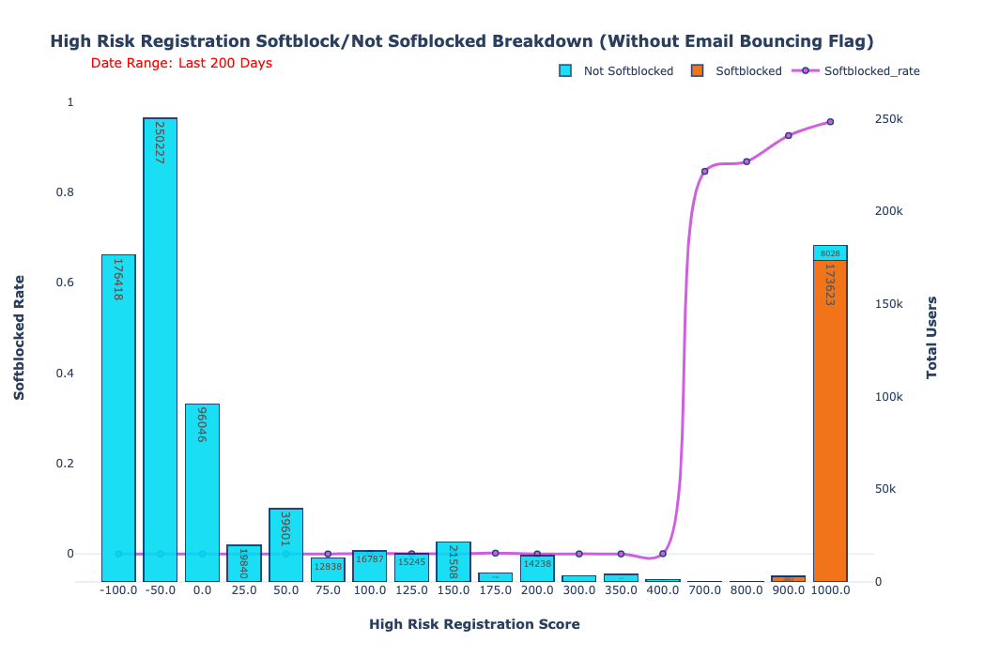

In [16]:
# validation_df = df1.groupby(['risk_score_bin','is_softblocked'])['user_id'].agg('count').reset_index()
# validation_df.columns = ['risk_score_bin','is_softblocked','count_users']

# df1['risk_score_bin'] = df1['risk_score_bin'].astype(float)
# df1 = df1.sort_values(by=['risk_score_bin','count_users'],ascending=True)
# df1['risk_score_bin'] = df1['risk_score_bin'].astype(str)

# # display(validation_df.head())
# fig = px.bar(df1
#             ,x='risk_score_bin'
#             ,y='count_users'
#             ,color='is_softblocked'
#             ,text='count_users'
#             ,color_continuous_scale=px.colors.diverging.RdYlBu_r
#             ,template='plotly_white'
#             ,title='<b>True Softblocks with ML Model Predictions'
#             ,height=700
#             )
# fig.show()

#display model results at bin level
field = 'risk_score_bin'
num_days = 30

df1['risk_score_bin'] = df1['risk_score_bin'].astype(float)
df1 = df1.sort_values(by=['risk_score_bin','count_users'],ascending=True)
df1['risk_score_bin'] = df1['risk_score_bin'].astype(str)

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=df1[field]
                         ,y=df1['percent_softblocked']
                         ,name='Softblocked_rate'
                         ,text=df1['percent_softblocked']
                         ,line_shape='spline'
                         ,line=dict(width=3, dash='solid')
                         ,textposition="top center"
                         ,marker_color='rgb(201,77,220)'
                         ,marker_line_color='rgb(8,48,107)'
                         ,marker_line_width=1.5
                         ,marker_size=6
                         ,mode='lines+markers'
                         ,opacity=.9)
              ,secondary_y=False)

fig.add_trace(go.Bar(x=df1[field]
                     ,y=df1['softblocked']
                     ,text=df1['softblocked']
                     ,textposition="inside"
                     ,name='Softblocked'
                     ,marker_color='rgb(240,100,0)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)

fig.add_trace(go.Bar(x=df1[field]
                     ,y=df1['not_softblocked']
                     ,text=df1['not_softblocked']
                     ,textposition="inside"
                     ,name='Not Softblocked'
                     ,marker_color='rgb(0,219,243)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)
    
fig.update_layout(
    template='plotly_white'
    ,barmode='stack'
    ,height=700
#     ,title_x=0.5
    ,title='<b>High Risk Registration Softblock/Not Sofblocked Breakdown (Without Email Bouncing Flag)</b><br>\
    <span style="font-size: 14;"><span style="color:red;">\
    Date Range: Last 200 Days<br>')

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1))

fig.update_xaxes(
    title_text="<b>High Risk Registration Score"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25)

fig.update_yaxes(
    title_text="<b>Softblocked Rate"
    ,title_standoff=25
    ,secondary_y=False
    ,showgrid=False)

fig.update_yaxes(
    title_text="<b>Total Users"
    ,title_standoff=25
    ,showgrid=False
    ,rangemode="tozero"
    ,secondary_y=True)

print('df shape: ', da.shape, '\n')

# Test for over 100 score
score1 = 100
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score1]
# print('')
print('Metrics if we Softblock >= Score 100: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', df11['softblocked'].sum()/num_days)
print('false positives per day est.: ', df11['not_softblocked'].sum()/num_days)
print('false positive ratio: ', df11['not_softblocked'].sum() / df11['softblocked'].sum())
print('daily impact: ', (df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days)
print('% softblocked: ', df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()))
print('')

# Test for over 200 score
score1 = 200
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score1]
# print('')
print('Metrics if we Softblock >= Score 200: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', df11['softblocked'].sum()/num_days)
print('false positives per day est.: ', df11['not_softblocked'].sum()/num_days)
print('false positive ratio: ', df11['not_softblocked'].sum() / df11['softblocked'].sum())
print('daily impact: ', (df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days)
print('% softblocked: ', df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()))
print('')

# Test for over 300 score
score1 = 300
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score1]
# print('')
print('Metrics if we Softblock >= Score 300: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', df11['softblocked'].sum()/num_days)
print('false positives per day est.: ', df11['not_softblocked'].sum()/num_days)
print('false positive ratio: ', df11['not_softblocked'].sum() / df11['softblocked'].sum())
print('daily impact: ', (df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days)
print('% softblocked: ', df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()))
print('')

# Test for over 400 score
score1 = 400
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score1]
# print('')
print('Metrics if we Softblock >= Score 400: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', df11['softblocked'].sum()/num_days)
print('false positives per day est.: ', df11['not_softblocked'].sum()/num_days)
print('false positive ratio: ', df11['not_softblocked'].sum() / df11['softblocked'].sum())
print('daily impact: ', (df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days)
print('% softblocked: ', df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()))
print('')

# Test for over 500 score
score1 = 500
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score1]
# print('')
print('Metrics if we Softblock >= Score 500: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', df11['softblocked'].sum()/num_days)
print('false positives per day est.: ', df11['not_softblocked'].sum()/num_days)
print('false positive ratio: ', df11['not_softblocked'].sum() / df11['softblocked'].sum())
print('daily impact: ', (df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days)
print('% softblocked: ', df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()))

# Test for over 600 score
score2 = 600
df1['risk_score_bin'] = df1['risk_score_bin'].astype('float')
df11 = df1[df1['risk_score_bin']>=score2]
print('')
print('Metrics if we Softblock >= Score 600: ')
print('total softblocked: ', df11['softblocked'].sum())
print('total not softblocked: ', df11['not_softblocked'].sum())
print('total users: ', df11['softblocked'].sum() + df11['not_softblocked'].sum())
print('softblocked per day est.: ', round(df11['softblocked'].sum()/num_days,2))
print('false positives per day est.: ', round(df11['not_softblocked'].sum()/num_days,2))
print('false positive ratio: ', round(df11['not_softblocked'].sum() / df11['softblocked'].sum(),2))
print('daily impact: ', round((df11['softblocked'].sum() + df11['not_softblocked'].sum())/num_days,2))
print('% softblocked: ', round(df11['softblocked'].sum() / (df11['softblocked'].sum() + df11['not_softblocked'].sum()),2))

# da.columns = ['risk_score_bin','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
display(df1.head(20))
fig.show()

# Test importance of features

In [50]:
ml_df_columns = ml_df[ml_df.columns[2:39]]
ml_df_columns = ml_df_columns.columns
adb_model.fit(X_train, y_train)

feature_df = pd.DataFrame({'Importance':adb_model.feature_importances_
                           ,'Features':ml_df_columns})
feature_df[feature_df['Importance'] >= .00].sort_values(by='Importance'
                                                        ,ascending=False)

,Importance,Features
31,0.23,firewall_bot_score
23,0.10,risk_score_rules
35,0.10,classify_handle_score
14,0.10,rule_is_fraud_device_id
18,0.09,rule_origin_fraud_ip
5,0.08,rule_origin
8,0.06,rule_signup_method
32,0.06,registration_hour
15,0.04,rule_is_fraud_ip_address
24,0.03,is_two_names


# SHAP Values

In [ ]:
import shap
shap.plots.initjs()

rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

rf_shap_values = shap.TreeExplainer(rf_model).shap_values(X_train)
shap.summary_plot(rf_shap_values
                  ,X_train
                  ,plot_type="bar"
                  ,feature_names=ml_df_columns
                  ,title='Feature Importance for Random Forest Model'
                 )

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


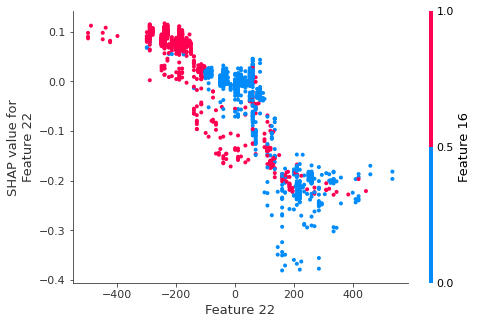

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


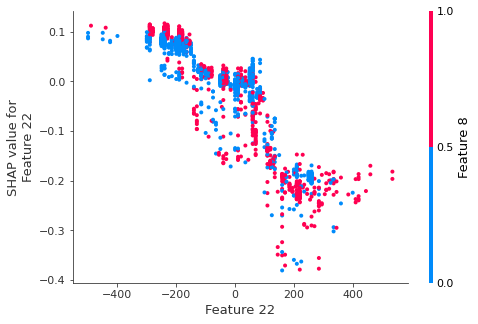

Passing parameters norm and vmin/vmax simultaneously is deprecated since 3.3 and will become an error two minor releases later. Please pass vmin/vmax directly to the norm when creating it.


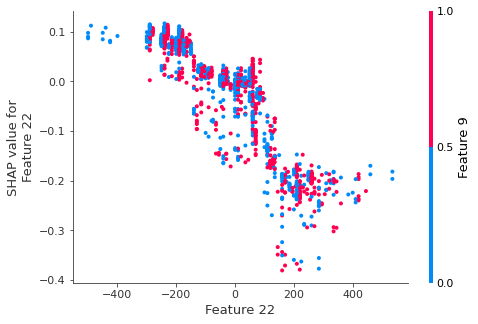

In [23]:
#show just one feature correlation
# shap.dependence_plot(23, rf_shap_values[0], X_train)

# we can use shap.approximate_interactions to guess which features
# may interact with age
inds = shap.approximate_interactions(22, rf_shap_values[0], X_train)

# make plots colored by each of the top three possible interacting features
for i in range(3):
    shap.dependence_plot(22, rf_shap_values[0], X_train, interaction_index=inds[i])

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


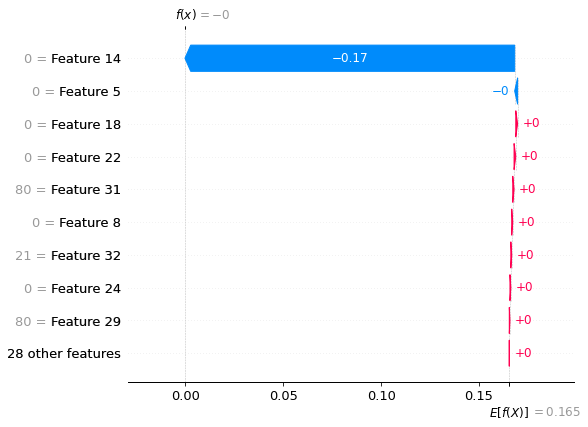

In [9]:
import xgboost

# train an XGBoost model
xg_model = xgboost.XGBRegressor().fit(X, y)

# explain the model's predictions using SHAP
# (same syntax works for LightGBM, CatBoost, scikit-learn, transformers, Spark, etc.)
explainer = shap.Explainer(xg_model)
xg_shap_values = explainer(X)

# visualize the first prediction's explanation
shap.plots.waterfall(xg_shap_values[0])

In [10]:
import shap
import xgboost
shap.plots.initjs()

# visualize the first prediction's explanation
shap.plots.force(xg_shap_values[0])

In [7]:
# visualize all the training set predictions

shap.force_plot(explainer.expected_value
                ,xg_shap_values.values[0:1500,:]
                ,X_test
#                 ,plot_cmap="DrDb"
                ,feature_names=ml_df_columns)

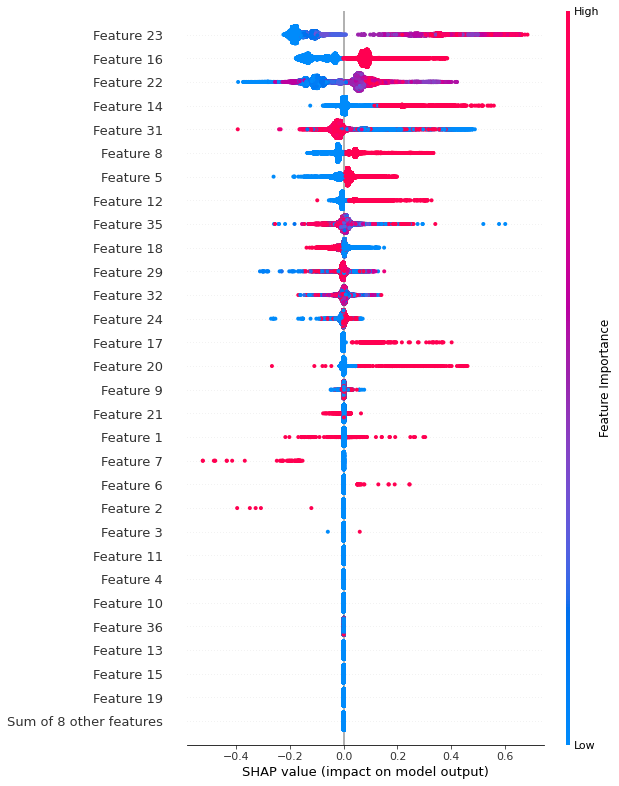

In [19]:
# summarize the effects of all the features
shap.plots.beeswarm(xg_shap_values
                   ,color_bar_label='Feature Importance'
                   ,max_display=30
                   ,)

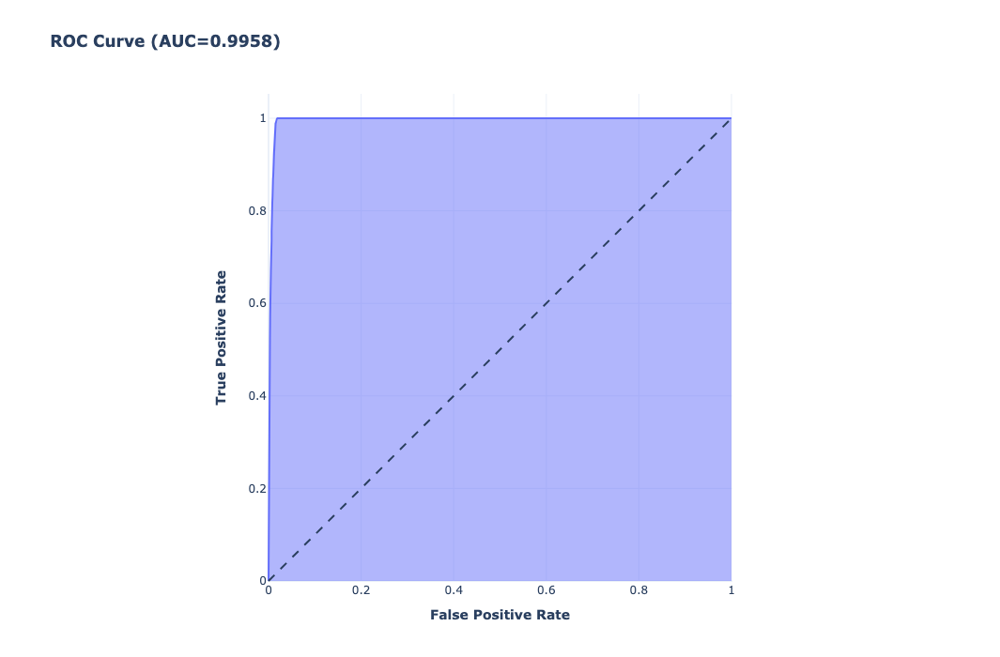

In [6]:
from sklearn.metrics import roc_curve, auc
from sklearn.datasets import make_classification

rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_score = rf_model.predict_proba(X)[:, -1]
fpr, tpr, thresholds = roc_curve(y, y_score)

fig = px.area(
    x=fpr
    ,y=tpr
    ,title=f'<b>ROC Curve (AUC={auc(fpr, tpr):.4f})'
    ,labels=dict(x='<b>False Positive Rate'
                 ,y='<b>True Positive Rate')
    ,height=700
    ,width=800
    ,template='plotly_white'
)

fig.add_shape(
    type='line'
    ,line=dict(dash='dash')
    ,x0=0
    ,x1=1
    ,y0=0
    ,y1=1
)

fig.update_yaxes(scaleanchor="x", scaleratio=1)
fig.update_xaxes(constrain='domain')
fig.show()

df shape:  (22, 7) 

Metrics if we Softblock >= Score 100: 
total softblocked:  353298
total not softblocked:  2427
total users:  355725
softblocked per day est.:  11776.6
false positives per day est.:  80.9
false positive ratio:  0.006869554880016304
daily impact:  11857.5
% softblocked:  0.9931773139363272

Metrics if we Softblock >= Score 200: 
total softblocked:  353298
total not softblocked:  12
total users:  353310
softblocked per day est.:  11776.6
false positives per day est.:  0.4
false positive ratio:  3.39656607170151e-05
daily impact:  11777.0
% softblocked:  0.9999660354929099


,risk_score,0,1,is_softblocked_rate,total_count,percent_of_total,risk_score_bin
10,200,12,5100,99.77,5112,0.59,200
11,250,0,6273,100.00,6273,0.73,250
12,300,0,17235,100.00,17235,2.00,300
13,350,0,11972,100.00,11972,1.39,350
14,400,0,31432,100.00,31432,3.65,400
15,450,0,55013,100.00,55013,6.38,450
16,500,0,71426,100.00,71426,8.29,500
17,600,0,76453,100.00,76453,8.87,600
18,700,0,51696,100.00,51696,6.00,700
19,800,0,13945,100.00,13945,1.62,800


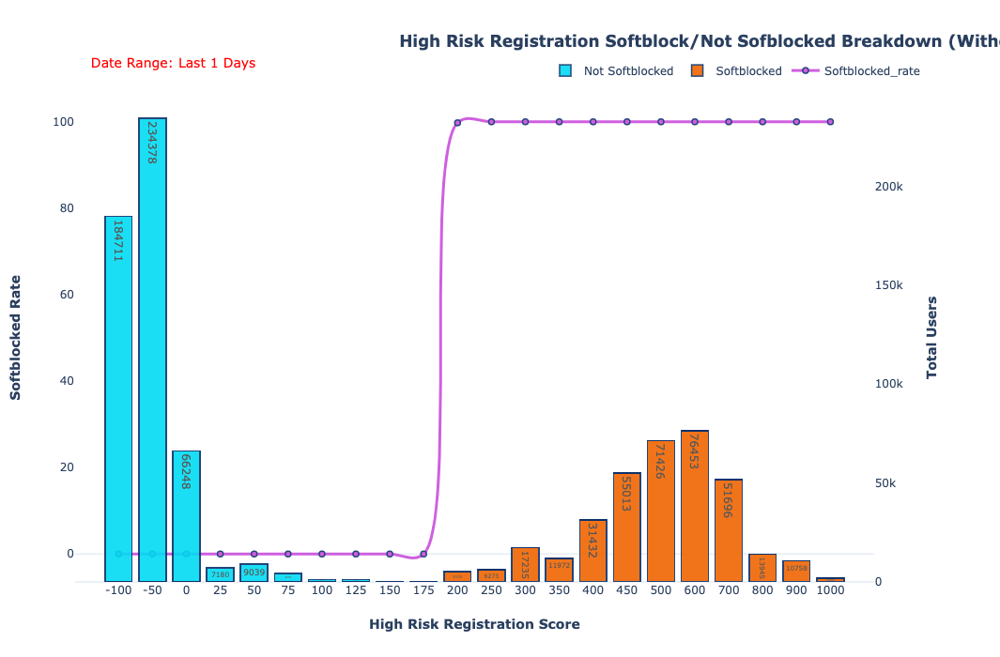

In [22]:
#display model results at bin level
field = 'risk_score'
num_days = 30

#evaluate column/feature
# da = data_analysis(df=df,field=field)
# da = data_analysis(df=df_final,field=field)
da = data_analysis(df=ml_df,field=field)

da['risk_score_bin'] = da[field].astype(int)
da = da.sort_values(by=field,ascending=True)
da['risk_score_bin'] = da[field].astype(str)

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=da[field]
                         ,y=da['is_softblocked_rate']
                         ,name='Softblocked_rate'
                         ,text=da['is_softblocked_rate']
                         ,line_shape='spline'
                         ,line=dict(width=3, dash='solid')
                         ,textposition="top center"
                         ,marker_color='rgb(201,77,220)'
                         ,marker_line_color='rgb(8,48,107)'
                         ,marker_line_width=1.5
                         ,marker_size=6
                         ,mode='lines+markers'
                         ,opacity=.9)
              ,secondary_y=False)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[1]
                     ,text=da[1]
                     ,textposition="inside"
                     ,name='Softblocked'
                     ,marker_color='rgb(240,100,0)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[0]
                     ,text=da[0]
                     ,textposition="inside"
                     ,name='Not Softblocked'
                     ,marker_color='rgb(0,219,243)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)
    
fig.update_layout(
    template='plotly_white'
    ,barmode='stack'
    ,height=700
#     ,title_x=0.5
    ,title='<b>                                                                High Risk Registration Softblock/Not Sofblocked Breakdown (Without Email Bouncing Flag)</b><br>\
    <span style="font-size: 14;"><span style="color:red;">\
    Date Range: Last 1 Days<br>')

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1))

fig.update_xaxes(
    title_text="<b>High Risk Registration Score"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25)

fig.update_yaxes(
    title_text="<b>Softblocked Rate"
    ,title_standoff=25
    ,secondary_y=False
    ,showgrid=False)

fig.update_yaxes(
    title_text="<b>Total Users"
    ,title_standoff=25
    ,showgrid=False
    ,rangemode="tozero"
    ,secondary_y=True)

# da = da.fillna(0)

print('df shape: ', da.shape, '\n')

# Test for over 100 score
score1 = 100
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score1]

# print('')
print('Metrics if we Softblock >= Score 100: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/num_days)
print('false positives per day est.: ', df1[0].sum()/num_days)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/num_days)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

# Test for over 200 score
score2 = 200
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score2]

print('')
print('Metrics if we Softblock >= Score 200: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/num_days)
print('false positives per day est.: ', df1[0].sum()/num_days)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/num_days)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

# da.columns = ['risk_score_bin','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
display(df1)
fig.show()

# Manual Testing Users


In [220]:
current_date = datetime.today().strftime('%Y-%m-%d')

ge_200 = ml_df[ml_df['risk_score_bin'].isin(['300','400','450','500','600','700','800','900'])].sort_values(by='risk_score_ml',ascending=True)

ge_200 = ge_200[
    (ge_200['is_softblocked_tf_rules'] == 0) #1 equals rules caught it
    & (ge_200['ml_predictions'] == 1) # 1 equals it was either softblocked or ml caught it
    & (ge_200['registration_day'] >= current_date)
]

print(ge_200.shape)
ge_200.head(20)

(281, 57)


,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score_rules,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf_rules,nb_pred,lr_pred,dt_pred,rf_pred,svm_pred,bg_pred,adb_pred,vote_pred,svc_gamma_pred,gaussian_pred,nn_pred,quad_discrim_pred,is_softblocked_tf,ml_predictions,risk_score_ml
3878,125431731,2021-09-10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,110,300,0,0,0,0,0,70,0,70.0,6,0,1,0,85.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,310
4529,125424074,2021-09-10,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,110,300,1,0,0,0,0,80,0,78.0,1,0,0,0,89.00,0,0,0,1,0,1,1,1,1,1,1,0,1,1,1,1,1,310
5912,125431284,2021-09-10,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,110,300,1,0,0,0,0,35,0,32.0,5,0,0,0,62.00,0,0,0,1,0,1,1,1,1,1,1,0,0,1,1,1,1,310
2887,125431246,2021-09-10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,110,300,1,0,0,0,0,80,0,77.0,5,0,1,0,62.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,310
2736,125432016,2021-09-10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,110,300,0,0,0,0,0,70,0,70.0,6,0,1,0,64.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,310
1906,125431853,2021-09-10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,110,300,0,0,0,0,0,75,0,73.0,6,0,1,0,62.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,310
7275,125435018,2021-09-10,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,110,300,0,0,0,0,0,80,0,76.0,12,0,1,0,91.00,0,0,0,1,1,1,0,1,1,1,1,0,1,1,1,1,1,310
5813,125434620,2021-09-10,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,120,300,1,0,1,0,0,70,0,70.0,11,0,1,0,91.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,320
6125,125434791,2021-09-10,0,1,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,120,300,1,0,1,0,0,70,0,68.0,12,0,1,0,85.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,1,1,1,320
3315,125423353,2021-09-10,0,0,0,0,0,1,0,0,1,1,0,0,1,0,1,0,0,0,1,0,0,0,120,300,0,0,0,0,0,50,0,47.0,0,0,1,0,87.00,0,0,0,1,1,1,1,1,1,1,1,0,1,1,0,1,1,320


In [ ]:
#display at score level
field = 'risk_score_rules'
num_days = 90

#evaluate column/feature
# da = data_analysis(df=df,field=field)
# da = data_analysis(df=df_final,field=field)
da = data_analysis(df=ml_df,field=field)

da['risk_score_rules'] = da['risk_score_rules'].astype(int)
da = da.sort_values(by='risk_score_rules',ascending=True)
da['risk_score_rules'] = da['risk_score_rules'].astype(str)

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=da[field]
                         ,y=da['is_softblocked_rate']
                         ,name='Softblocked_rate'
                         ,text=da['is_softblocked_rate']
                         ,line_shape='spline'
                         ,line=dict(width=3, dash='solid')
                         ,textposition="top center"
                         ,marker_color='rgb(201,77,220)'
                         ,marker_line_color='rgb(8,48,107)'
                         ,marker_line_width=1.5
                         ,marker_size=6
                         ,mode='lines+markers'
                         ,opacity=.9)
              ,secondary_y=False)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[1]
                     ,text=da[1]
                     ,textposition="inside"
                     ,name='Softblocked'
                     ,marker_color='rgb(240,100,0)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[0]
                     ,text=da[0]
                     ,textposition="inside"
                     ,name='Not Softblocked'
                     ,marker_color='rgb(0,219,243)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)
    
fig.update_layout(
    template='plotly_white'
    ,barmode='stack'
    ,height=700
#     ,title_x=0.5
    ,title='<b>                                                                             High Risk Registration Softblock/Not Sofblocked Breakdown</b><br>\
    <span style="font-size: 14;"><span style="color:red;">\
    Date Range: Last 90 Days<br>')

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1))

fig.update_xaxes(
    title_text="<b>High Risk Registration Score"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25)

fig.update_yaxes(
    title_text="<b>Softblocked Rate"
    ,title_standoff=25
    ,secondary_y=False
    ,showgrid=False)

fig.update_yaxes(
    title_text="<b>Total Users"
    ,title_standoff=25
    ,showgrid=False
    ,rangemode="tozero"
    ,secondary_y=True)

da = da.fillna(0)

print('df shape: ', da.shape, '\n')

# Test for over 100 score
score1 = 100
da['risk_score_rules'] = da['risk_score_rules'].astype('int')
df1 = da[da['risk_score_rules']>=score1]

# print('')
print('Metrics if we Softblock >= Score 100: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/num_days)
print('false positives per day est.: ', df1[0].sum()/num_days)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/num_days)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

# Test for over 200 score
score2 = 200
da['risk_score_rules'] = da['risk_score_rules'].astype('int')
df1 = da[da['risk_score_rules']>=score2]

print('')
print('Metrics if we Softblock >= Score 200: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/num_days)
print('false positives per day est.: ', df1[0].sum()/num_days)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/num_days)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

da.columns = ['risk_score_bin','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
display(df1.head(20))
fig.show()

# Run ML on Low Scores

In [229]:
from ast import literal_eval
import math
import re

import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

from difflib import SequenceMatcher
from collections import Counter
from itertools import groupby

from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import VotingClassifier

# from keras import layers
# from keras import models
# from keras import optimizers
# from keras import losses
# from keras import metrics

# org_df = df
# ml_df = df[df['risk_score_bin'].isin(['-50','0','25'])]
ml_df =  ml_df[['user_id','registration_day'
            ,'rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
            ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
            ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
            ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
            ,'rule_fraud_dev_bot_reg_hr','risk_score','risk_score_bin','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email' 
            ,'disposable_domain','bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums'
            ,'is_fraud_device_id'
#             ,'emails_are_bouncing'
            ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
            ,'is_softblocked_tf']]

print(ml_df.shape)
display(ml_df.head(2))
print(ml_df.columns)

ml_df_array = ml_df[ml_df.columns[2:39]].values
ml_df_array

(24790, 41)


,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf
5,125421275,2021-09-09,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,45,0,1,0,0,0,0,80,0,76.0,23,0,0,93.00,1,0,0
6,125424973,2021-09-10,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5,0,1.0,1,0,0,64.00,0,0,1


Index(['user_id', 'registration_day', 'rule_prev_blocked_email_handle',
       'rule_uncommon_domain', 'rule_disposable_domain',
       'rule_bot_score_bucket', 'rule_is_emulator', 'rule_origin',
       'rule_likely_invalid_email', 'rule_zip', 'rule_signup_method',
       'rule_registration_hour', 'rule_email_nums', 'rule_count_email_nums',
       'rule_state_name', 'rule_emails_are_bouncing',
       'rule_is_fraud_device_id', 'rule_is_fraud_ip_address',
       'rule_fraud_ip_reg_hour', 'rule_state_name_reg_hour',
       'rule_origin_fraud_ip', 'rule_low_risk_rules_triggered',
       'rule_risky_first_name', 'rule_fraud_dev_bot_reg_hr', 'risk_score',
       'risk_score_bin', 'is_two_names', 'prev_blocked_email_handle',
       'uncommon_domain', 'likely_invalid_email', 'disposable_domain',
       'bot_score_bucket', 'is_emulator', 'firewall_bot_score',
       'registration_hour', 'count_email_nums', 'is_fraud_device_id',
       'classify_handle_score', 'classify_handle_score_rule',
    

array([[0, 0, 0, ..., 0, 93.0, 1],
       [0, 0, 0, ..., 0, 64.0, 0],
       [0, 0, 0, ..., 0, 61.0, 0],
       ...,
       [0, 0, 0, ..., 0, 93.0, 1],
       [0, 0, 0, ..., 0, 89.0, 0],
       [0, 0, 0, ..., 0, 62.0, 0]], dtype=object)

In [230]:
#Create Test and Train arrays on low risk scores df
#if you add more columns to the dataset
#make sure you adjust the X and y column ranges
X = ml_df[ml_df.columns[2:40]].values
y = ml_df[ml_df.columns[-1]].values

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.9)

print('X_train shape: \n', X_train.shape)
print('X_test shape: \n', X_test.shape)
print('y_train shape: \n', y_train.shape)
print('y_test shape: \n', y_test.shape)
print('')
print('X_train:', X_train)
print('X_test:', X_test)
print('y_train:', y_train)
print('y_test:', y_test)

X_train shape: 
 (2479, 38)
X_test shape: 
 (22311, 38)
y_train shape: 
 (2479,)
y_test shape: 
 (22311,)

X_train: [[0 0 0 ... 51.0 0 0]
 [0 0 0 ... 64.0 0 0]
 [0 0 0 ... 58.0 0 0]
 ...
 [0 0 0 ... 92.0 1 0]
 [0 0 0 ... 95.0 1 0]
 [0 0 0 ... 59.0 0 0]]
X_test: [[0 0 0 ... 59.0 0 0]
 [0 1 0 ... 64.0 0 0]
 [0 0 0 ... 63.0 0 0]
 ...
 [0 0 0 ... 93.0 1 0]
 [0 0 0 ... 56.0 0 0]
 [0 0 0 ... 63.0 0 0]]
y_train: [0 0 0 ... 0 0 0]
y_test: [0 1 0 ... 0 0 0]


In [231]:
#run ml on org df
#classify models
nb_model = GaussianNB()
lr_model = LogisticRegression()
dt_model = DecisionTreeClassifier(max_depth=5)
rf_model = RandomForestClassifier()
# knn_model = KNeighborsClassifier()
svm_model = LinearSVC(C=0.0001)
bg_model = BaggingClassifier(DecisionTreeClassifier(),max_samples=0.5,max_features=1.0,n_estimators=10)
adb_model = AdaBoostClassifier(DecisionTreeClassifier(min_samples_split=10,max_depth=4),n_estimators=10,learning_rate=0.6)
vote_model = VotingClassifier(estimators=[('nb',nb_model),('lr',lr_model),('rf',rf_model),('dt',dt_model)],voting='hard')
svc_gamma_model = SVC(gamma=2, C=1)
gaussian_model = GaussianProcessClassifier(1.0 * RBF(1.0))
# RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1)
nn_model = MLPClassifier(alpha=1, max_iter=1000)
quad_discrim_model = QuadraticDiscriminantAnalysis()

#fitting model with prediction data and telling it my target
rf_model.fit(X_train, y_train)
nb_model.fit(X_train, y_train)
lr_model.fit(X_train, y_train)
dt_model.fit(X_train, y_train)
rf_model.fit(X_train, y_train)
# knn_model.fit(X_train, y_train)
svm_model.fit(X_train, y_train)
bg_model.fit(X_train, y_train)
adb_model.fit(X_train, y_train)
vote_model.fit(X_train, y_train)
svc_gamma_model.fit(X_train, y_train)
gaussian_model.fit(X_train, y_train)
nn_model.fit(X_train, y_train)
quad_discrim_model.fit(X_train, y_train)


print('ML models fitted on train data')

#test model against test data (actual data without target)
rf_pred = list(rf_model.predict(ml_df_array))
nb_pred = list(nb_model.predict(ml_df_array))
lr_pred = list(lr_model.predict(ml_df_array))
dt_pred = list(dt_model.predict(ml_df_array))
rf_pred = list(rf_model.predict(ml_df_array))
# knn_pred = list(knn_model.predict(ml_df_array))
svm_pred = list(svm_model.predict(ml_df_array))
bg_pred = list(bg_model.predict(ml_df_array))
adb_pred = list(adb_model.predict(ml_df_array))
vote_pred = list(vote_model.predict(ml_df_array))
svc_gamma_pred = list(svc_gamma_model.predict(ml_df_array))
gaussian_pred = list(gaussian_model.predict(ml_df_array))
nn_pred = list(nn_model.predict(ml_df_array))
quad_discrim_pred = list(quad_discrim_model.predict(ml_df_array))


print('ML models predictions on ml_df_array completed')

#run ml on the ml_df
#create random forest column
ml_df['nb_pred'] = nb_pred
ml_df['lr_pred'] = lr_pred
ml_df['dt_pred'] = dt_pred
ml_df['rf_pred'] = rf_pred
# ml_df['knn_pred'] = knn_pred
ml_df['svm_pred'] = svm_pred
ml_df['bg_pred'] = bg_pred
ml_df['adb_pred'] = adb_pred
ml_df['vote_pred'] = vote_pred
ml_df['svc_gamma_pred'] = svc_gamma_pred
ml_df['gaussian_pred'] = gaussian_pred
ml_df['nn_pred'] = nn_pred
ml_df['quad_discrim_pred'] = quad_discrim_pred


#convert prediction cols to ints
ml_df['nb_pred'] = ml_df['nb_pred'].astype(int)
ml_df['lr_pred'] = ml_df['lr_pred'].astype(int)
ml_df['dt_pred'] = ml_df['dt_pred'].astype(int)
ml_df['rf_pred'] = ml_df['rf_pred'].astype(int)
# ml_df['knn_pred'] = ml_df['knn_pred'].astype(int)
ml_df['svm_pred'] = ml_df['svm_pred'].astype(int)
ml_df['bg_pred'] = ml_df['bg_pred'].astype(int)
ml_df['adb_pred'] = ml_df['adb_pred'].astype(int)
ml_df['vote_pred'] = ml_df['vote_pred'].astype(int)
ml_df['svc_gamma_pred'] = ml_df['svc_gamma_pred'].astype(int)
ml_df['gaussian_pred'] = ml_df['gaussian_pred'].astype(int)
ml_df['nn_pred'] = ml_df['nn_pred'].astype(int)
ml_df['quad_discrim_pred'] = ml_df['quad_discrim_pred'].astype(int)

#filter out only predicted fraud
# org_df = org_df[org_df['is_likely_bad'] == 1]

print('ml_df shape: ', ml_df.shape)
ml_df.head()

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



ML models fitted on train data


/opt/conda/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:808: UserWarning:

Variables are collinear



ValueError: X has 37 features, but DecisionTreeClassifier is expecting 38 features as input.

In [425]:
#create column for ml prediction scores
def ml_pred_score(row):
    if row['rf_pred'] == 1:
        return '1'
    elif row['adb_pred'] == 1:
        return '1'
    elif row['is_softblocked_tf'] == 1:
        return '1'
    else:
        return '0'

ml_df['ml_pred_score'] = ml_df.apply(lambda row: ml_pred_score(row), axis = 1)

#replace is_softblocked column with machine learning is softblocked column
#drop prediction columns so the concatinating dfs have same cols
ml_df.drop('is_softblocked_tf', axis=1, inplace=True)
ml_df.drop('nb_pred', axis=1, inplace=True)
ml_df.drop('lr_pred', axis=1, inplace=True)
ml_df.drop('dt_pred', axis=1, inplace=True)
ml_df.drop('rf_pred', axis=1, inplace=True)
# ml_df.drop('knn_pred', axis=1, inplace=True)
ml_df.drop('svm_pred', axis=1, inplace=True)
ml_df.drop('bg_pred', axis=1, inplace=True)
ml_df.drop('adb_pred', axis=1, inplace=True)
ml_df.drop('vote_pred', axis=1, inplace=True)

ml_df=ml_df.rename(columns = {'ml_pred_score':'is_softblocked_tf'})
# ml_df['is_softblocked_tf'] = ml_df['is_softblocked_tf'].astype('int')
# ml_df['registration_day'] = ml_df['registration_day'].astype('datetime64')
# ml_df['risk_score_bin'] = ml_df['risk_score_bin'].astype('str')

ml_df.head()

,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf
3,125050025,2021-08-31,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,-40,0,1,0,0,0,0,30,0,28.0,16,0,0,0,64.00,0,0,0
4,125076895,2021-09-01,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,-40,0,1,0,1,0,0,50,0,46.0,3,0,0,0,82.00,0,0,0
5,125081225,2021-09-01,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,-140,-50,1,0,1,0,0,85,0,82.0,8,0,0,0,81.00,0,0,1
8,125056652,2021-08-31,0,0,0,0,0,0,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,-230,-50,1,0,0,0,0,75,0,71.0,19,0,0,0,31.00,0,0,0
10,125074852,2021-09-01,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,35,0,1,0,0,0,0,5,0,1.0,2,0,0,0,93.00,1,0,1


In [426]:
#show the actual userids after machine learning
#original df
df_org = df[~df['risk_score_bin'].isin(['-50','0','25'])]

df_org =  df_org[['user_id','registration_day'
            ,'rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
            ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
            ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
            ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
            ,'rule_fraud_dev_bot_reg_hr','risk_score','risk_score_bin','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email' 
            ,'disposable_domain','bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums'
            ,'is_fraud_device_id','emails_are_bouncing' ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
            ,'is_softblocked_tf']]
# df_org = df_org[['user_id','is_softblocked_tf','risk_score_bin']]
print('df_org shape: ', df_org.shape)
df_org.head(2)

#ml_df
# ml_df = ml_df[['user_id','is_softblocked_tf','risk_score_bin']]
m = ml_df['is_softblocked_tf'] == 1
ml_df.loc[m, 'risk_score_bin'] = ml_df.loc[m, 'risk_score_bin'] + 1001
print('ml_df shape: ', ml_df.shape)

#concat dfs
df_org = pd.concat([df_org,ml_df], ignore_index=True)
print('df_org shape: ', df_org.shape)

#convert 0s and dtypes
df_org['is_softblocked_tf'] = df_org['is_softblocked_tf'].astype('int')

df_org.head()

df_org shape:  (10973, 42)
ml_df shape:  (26117, 42)
df_org shape:  (37090, 42)


,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf
0,125083293,2021-09-01,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,220,225,0,0,1,0,0,15,0,11.0,12,0,0,1,72.00,0,0,1
1,125076223,2021-09-01,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,235,175,0,0,0,0,0,50,0,46.0,3,0,0,1,96.00,1,0,1
2,125050200,2021-08-31,0,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,1,0,325,250,1,0,0,0,0,85,0,84.0,16,0,1,0,92.00,1,0,1
3,125084413,2021-09-01,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,245,175,0,0,1,0,0,50,0,46.0,13,0,1,0,94.00,1,0,1
4,125076151,2021-09-01,0,1,0,0,0,1,0,0,1,0,0,0,1,0,0,0,0,0,1,0,0,0,195,125,1,0,1,0,0,70,0,70.0,3,0,0,1,93.00,1,0,1


In [26]:
ml_df_array = ml_df[ml_df.columns[2:39]].values
# ml_df_array

#Create Test and Train arrays on low risk scores df
X = ml_df[ml_df.columns[2:39]].values
y = ml_df[ml_df.columns[-1]].values

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.90)

print('ML train test splits completed')

#run ml on org df
#classify models
rf_model = RandomForestClassifier()
adb_model = AdaBoostClassifier(DecisionTreeClassifier(min_samples_split=10,max_depth=4),n_estimators=10,learning_rate=0.6)

# #fitting model with prediction data and telling it my target
rf_model.fit(X_train, y_train)
print('rf_model fit complete')
adb_model.fit(X_train, y_train)
print('adb_model fit complete')

print('ML models fitted on train data')

ML train test splits completed


ValueError: Input contains NaN

# Test ML Accuracy on Org df

High Risk Registration Classification Report: 

GaussianNB() 
              precision  recall  f1-score    support
0                 1.00    0.98      0.99 2549172.00
1                 0.92    1.00      0.96  560588.00
avg / total       0.99    0.98      0.98 3109760.00


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:818: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression() 
              precision  recall  f1-score    support
0                 1.00    0.98      0.99 2549172.00
1                 0.92    1.00      0.96  560588.00
avg / total       0.99    0.98      0.98 3109760.00
DecisionTreeClassifier() 
              precision  recall  f1-score    support
0                 0.98    0.99      0.98 2549172.00
1                 0.93    0.92      0.93  560588.00
avg / total       0.97    0.97      0.97 3109760.00
RandomForestClassifier() 
              precision  recall  f1-score    support
0                 1.00    0.98      0.99 2549172.00
1                 0.93    0.98      0.96  560588.00
avg / total       0.98    0.98      0.98 3109760.00
BaggingClassifier(base_estimator=DecisionTreeClassifier(), max_samples=0.5) 
              precision  recall  f1-score    support
0                 0.99    0.98      0.99 2549172.00
1                 0.93    0.97      0.95  560588.00
avg / total       0.98    0.98      0.98 3109760.00
AdaBoostClass

/opt/conda/lib/python3.7/site-packages/sklearn/discriminant_analysis.py:873: UserWarning:

Variables are collinear



QuadraticDiscriminantAnalysis() 
              precision  recall  f1-score    support
0                 1.00    0.98      0.99 2549172.00
1                 0.92    1.00      0.96  560588.00
avg / total       0.99    0.98      0.98 3109760.00


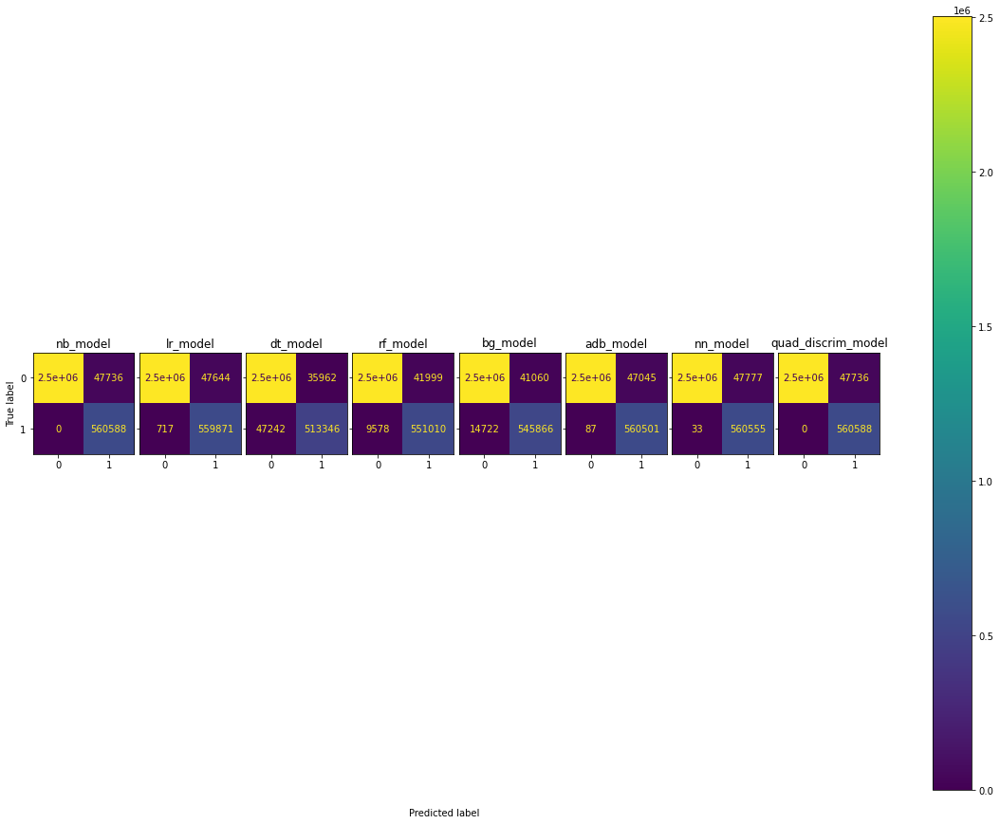

In [9]:
#classification report function and classifiers
def pandas_classification_report(y_true, y_pred):
    metrics_summary = precision_recall_fscore_support(
        y_true=y_test
        ,y_pred=y_predictions
        ,labels=np.unique(y_pred)
    )

    avg = list(precision_recall_fscore_support(
        y_true=y_test
        ,y_pred=y_predictions
        ,average='weighted')
        )

    metrics_sum_index = ['precision', 'recall', 'f1-score', 'support']
    class_report_df = pd.DataFrame(
        list(metrics_summary)
        ,index=metrics_sum_index)

    support = class_report_df.loc['support']
    total = support.sum() 
    avg[-1] = total

    class_report_df['avg / total'] = avg

    return class_report_df.T

nb_model = GaussianNB()
lr_model = LogisticRegression()
dt_model = DecisionTreeClassifier()
rf_model = RandomForestClassifier()
knn_model = KNeighborsClassifier()
bg_model = BaggingClassifier(DecisionTreeClassifier(),max_samples=0.5,max_features=1.0,n_estimators=10)
adb_model = AdaBoostClassifier(DecisionTreeClassifier(min_samples_split=10,max_depth=4),n_estimators=10,learning_rate=0.6)
gaussian_model = GaussianProcessClassifier(1.0 * RBF(1.0))
nn_model = MLPClassifier(alpha=1, max_iter=1000)
quad_discrim_model = QuadraticDiscriminantAnalysis()
vote_model = VotingClassifier(estimators=[('adb',adb_model),('gaus',gaussian_model),('rf',rf_model),('dt',dt_model)],voting='hard')

classifiers = {
    "nb_model": GaussianNB()
    ,"lr_model": LogisticRegression()
    ,"dt_model": DecisionTreeClassifier()
    ,"rf_model": RandomForestClassifier()
    # ,"knn_model": KNeighborsClassifier()
#     ,"svm_model": LinearSVC(C=0.0001)
    ,"bg_model": BaggingClassifier(DecisionTreeClassifier(),max_samples=0.5,max_features=1.0,n_estimators=10)
    ,"adb_model": AdaBoostClassifier(DecisionTreeClassifier(min_samples_split=10,max_depth=4),n_estimators=10,learning_rate=0.6)
#     ,"svc_gamma_model": SVC(gamma=2, C=1)
    # ,"gaussian_model": GaussianProcessClassifier(1.0 * RBF(1.0))
    ,"nn_model": MLPClassifier(alpha=1, max_iter=1000)
    ,"quad_discrim_model": QuadraticDiscriminantAnalysis()
    # ,"vote_model": VotingClassifier(estimators=[('adb',adb_model),('gaus',gaussian_model),('rf',rf_model),('dt',dt_model)],voting='hard')
}

f, axes = plt.subplots(1
                       ,len(classifiers)
                       # ,4
                       ,figsize=(20, 15)
                       ,sharey='row',sharex='col')

print('High Risk Registration Classification Report: \n')

for i, (key, classifier) in enumerate(classifiers.items()):
    y_pred = classifier.fit(X_train, y_train).predict(X_test)
    y_predictions = classifier.predict(X_test)
    df_class_report = pandas_classification_report(y_true=y_test, y_pred=y_predictions)
    print((classifier),'\n', df_class_report)
    cf_matrix = confusion_matrix(y_test, y_pred)
    
    disp = ConfusionMatrixDisplay(cf_matrix)
#                                   display_labels=)
    disp.plot(ax=axes[i], xticks_rotation=0)
    disp.ax_.set_title(key)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')
        
f.text(0.4, 0.1, 'Predicted label', ha='left', size='medium')
plt.subplots_adjust(wspace=0.05, hspace=0.1)
# plt.subplots_adjust({'font.size': 14})
f.colorbar(disp.im_, ax=axes)
plt.show()

# Attempt to create a meaningful scatter plot
### *From several ml models

In [137]:
ml_df.head(2)

,user_id,registration_day,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score_rules,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf_rules,nb_pred,lr_pred,dt_pred,rf_pred,svm_pred,bg_pred,adb_pred,vote_pred,is_softblocked_tf,ml_predictions,risk_score_ml
0,123188798,2021-07-17,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,-95,-100,1,0,1,0,0,70,0,67.0,21,0,0,0,86.00,0,0,0,0,0,0,0,0,0,0,0,0,0,-95
1,123053788,2021-07-14,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,345,500,1,0,0,0,0,10,0,7.0,18,0,0,1,64.00,0,0,1,1,1,1,1,1,1,1,1,1,1,545


(588, 13)


,registration_day,nb_pred,lr_pred,dt_pred,rf_pred,svm_pred,bg_pred,adb_pred,vote_pred,ml_predictions,count_users,sum_ml_cols,ml_classifier
1,2021-06-11,0,0,0,0,0,0,1,0,1,144,1,adb_pred
2,2021-06-11,0,0,0,0,0,1,0,0,0,26,1,bg_pred
5,2021-06-11,0,0,0,1,0,0,0,0,1,25,1,rf_pred
9,2021-06-11,0,0,1,0,0,0,0,0,0,190,1,dt_pred
19,2021-06-11,0,1,0,0,0,0,0,0,0,336,1,lr_pred


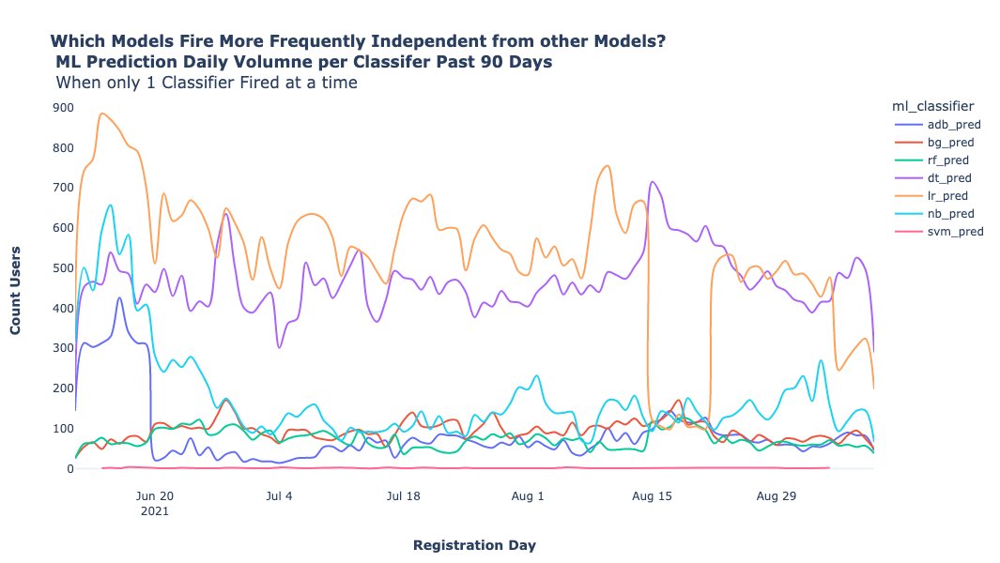

In [182]:
scatter_df = ml_df.groupby(['registration_day','nb_pred','lr_pred','dt_pred','rf_pred','svm_pred','bg_pred','adb_pred','vote_pred','ml_predictions'])['user_id'].agg('count').reset_index()
scatter_df.columns = ['registration_day','nb_pred','lr_pred','dt_pred','rf_pred','svm_pred','bg_pred','adb_pred','vote_pred','ml_predictions','count_users']
scatter_df['sum_ml_cols'] = scatter_df['nb_pred'] + scatter_df['lr_pred'] + scatter_df['dt_pred'] + scatter_df['rf_pred'] \
                            + scatter_df['svm_pred'] + scatter_df['bg_pred'] + scatter_df['adb_pred'] + scatter_df['vote_pred']
scatter_df = scatter_df[scatter_df['sum_ml_cols'] == 1]

def ml_classifier(row):
    if row['nb_pred'] == 1:
        return 'nb_pred'
    elif row['lr_pred'] == 1:
        return 'lr_pred'
    elif row['dt_pred'] == 1:
        return 'dt_pred'
    elif row['rf_pred'] == 1:
        return 'rf_pred'
    elif row['svm_pred'] == 1:
        return 'svm_pred'
    elif row['bg_pred'] == 1:
        return 'bg_pred'
    elif row['adb_pred'] == 1:
        return 'adb_pred'
    elif row['vote_pred'] == 1:
        return 'vote_pred'
    else:
        return 0

scatter_df['ml_classifier'] = scatter_df.apply(lambda row: ml_classifier(row), axis = 1)

print(scatter_df.shape)
display(scatter_df.head())

fig = px.line(scatter_df
                ,x='registration_day'
                ,y='count_users'
                ,color='ml_classifier'
                ,line_shape='spline'
                ,title='<b>Which Models Fire More Frequently Independent from other Models? <br> ML Prediction Daily Volumne per Classifer Past 90 Days</b> <br> When only 1 Classifier Fired at a time'
#                 ,size='count_users'
                ,template='plotly_white'
                ,height=600)

fig.update_xaxes(
    title_text="<b>Registration Day"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25
)

fig.update_yaxes(
    title_text="<b>Count Users"
    ,title_standoff=25
    ,secondary_y=False
    ,showgrid=False)

fig.show()

# Load table to Big Query

In [ ]:
try:
    gcp_client.delete_table('prod-analytics-1312.cx.max_agg_df_day')
except:
    print('Table does not exist')
gcp_client.load_table_from_dataframe(agg_df_day, 'prod-analytics-1312.cx.max_agg_df_day')

In [72]:
try:
    gcp_client.delete_table('prod-analytics-1312.cx.max_agg_df_day')
except:
    print('Table does not exist')
gcp_client.load_table_from_dataframe(agg_df_day, 'prod-analytics-1312.cx.max_agg_df_day')

Table does not exist


# Trends and Drivers

,registration_day,rule,metric_value,weekly_vol_pct_change,prev_weekly_vol_pct_change
0,2021-06-15,classify_handle_score_rule,0,NaN,NaN
1,2021-06-16,classify_handle_score_rule,0,NaN,NaN
2,2021-06-17,classify_handle_score_rule,0,NaN,NaN
3,2021-06-18,classify_handle_score_rule,0,NaN,NaN
4,2021-06-19,classify_handle_score_rule,0,NaN,NaN


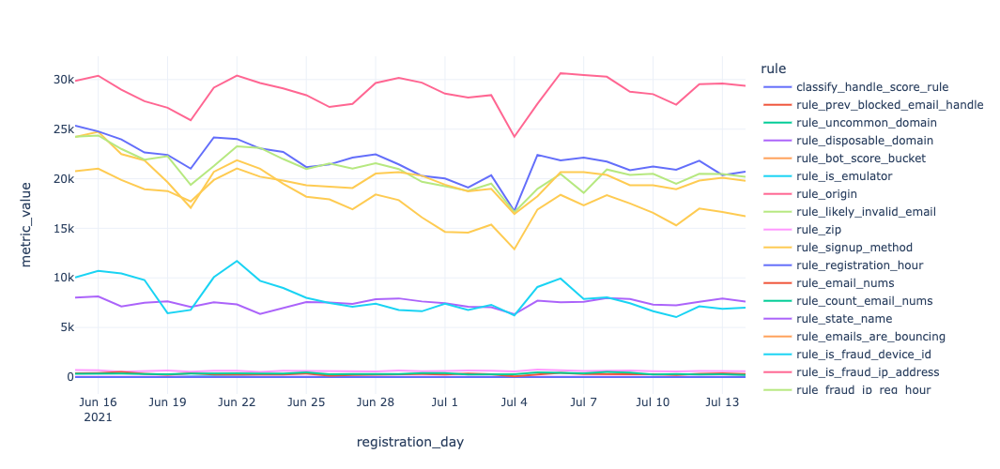

In [10]:
display(agg_df_day.head())

fig=px.line(agg_df_day
            ,x='registration_day'
            ,y='metric_value'
            ,color='rule'
            ,template='plotly_white'
            ,height=500
           )
fig.show()

# Testing Tables

In [144]:
query = """
select
    au.user_id
    ,au.created au_created
    ,json_extract_scalar(au.cookies, '$._pin_unauth') AS pin_unauth
    ,json_extract_scalar(au.cookies, '$.G_ENABLED_IDPS') AS G_ENABLED_IDPS
    ,json_extract_scalar(au.cookies, '$.DX') AS DX
    ,json_extract_scalar(au.cookies, '$._csrf') AS csrf
    ,json_extract_scalar(au.cookies, '$.__cf_bm') AS cf_bm
    ,json_extract_scalar(au.cookies, '$._sim_uuid') AS sim_uuid
    ,json_extract_scalar(au.cookies, '$._sim_si') AS sim_si
    ,json_extract_scalar(au.cookies, '$._uetvid') AS uetvid
    ,json_extract_scalar(au.cookies, '$._ga') AS ga
    ,json_extract_scalar(au.cookies, '$.op_context') AS op_context
    ,json_extract_scalar(au.cookies, '$._uetsid') AS uetsid
    ,json_extract_scalar(au.cookies, '$.ou-ads-id') AS ou_ads_id
    ,json_extract_scalar(au.cookies, '$.viewport') AS viewport
    ,json_extract_scalar(au.cookies, '$._ga_QP0R22E78S') AS ga_QP0R22E78S
    ,json_extract_scalar(au.cookies, '$.X-OU-F-TOKEN') AS X_OU_F_TOKEN
    ,json_extract_scalar(au.cookies, '$._gid') AS gid
    ,json_extract_scalar(au.cookies, '$._gat_gtag_UA_16437919_15') AS gat_gtag_UA_16437919_15
    ,json_extract_scalar(au.cookies, '$._sim_cr') AS sim_cr
    ,json_extract_scalar(au.cookies, '$.afUserId') AS afUserId
    ,json_extract_scalar(au.cookies, '$.__cfduid') AS cfduid
    ,au.facebook
    ,au.ip_address
    ,au.isp_name
    ,au.location_name
    ,concat(au.location_x,'_',au.location_y) as long_lat
    ,au.mobile
    ,au.new_visitor
from `prod-ods-6a09.postgres_legacy.account_usersource` au
where
    au.created between '2021-05-01' and '2021-05-03'
"""

df1 = gcp_client.query(query).to_dataframe()

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))
print('df1 shape: ', df1.shape)
print('unique users: ', df1.user_id.nunique())
print('df1 size in gb: ', round(df1.memory_usage(deep=True).sum() / 1000000000,2),'gb')

df1.head()

Query Duration: 0:48:15.588598
df1 shape:  (27102, 29)
unique users:  27102
df1 size in gb:  0.07 gb


,user_id,au_created,pin_unauth,G_ENABLED_IDPS,DX,csrf,cf_bm,sim_uuid,sim_si,uetvid,ga,op_context,uetsid,ou_ads_id,viewport,ga_QP0R22E78S,X_OU_F_TOKEN,gid,gat_gtag_UA_16437919_15,sim_cr,afUserId,cfduid,facebook,ip_address,isp_name,location_name,long_lat,mobile,new_visitor
0,96901083,2021-05-02 22:59:45.340000+00:00,dWlkPVpHVXpPVEkyT0dJdFpEWTNOQzAwWWpGbUxXSXlNbUV0TVRkaE1UQTFOelZtWXpNeA,google,web-849011976adc349095c397ce25271d1a727173bcae59d6656881da85,Ki45CxhnHX4KfJg4kqlv1CSl,abd9ce346df320eaafbf87cec2d9a1200d6664b3-1619995738-1800-AWneKSbCOLA6CRdyhDQrGfdNa641dp66oFiGBlgp44fSVqXYixQo/YL3On/zmafR8hLx3N3YIQGCuuPbNYQmgmRbhT1ywGMg/SRCTkwTb7wdjNPWeHJE68ZRGxhcudERIONwfLWLTauEm7uA/Gq7QUTHizlh1C/75ALCz80lMSj7,E1FC8174-BD90-434D-8DDF-7F2EAFC43529,DAD16E8D-D632-4564-AE76-822D6B3B955E,92f1c650ab9811ebb10d09bb103d1e0d,GA1.2.995172871.1619995736,eyJzZXNzaW9uX2lkIjogImY5YjE4ZTE2LTg2ZjctNDM0Ny1iYWZkLTY3MTdhNzViNDFmYSIsICJzZXNzaW9uX3R5cGUiOiAidXNlcl9vcGVuIiwgInNjcmVlbl9zb3VyY2VfaWQiOiAic3JjaDNjNjEyY2Q2OGY2OTQ1OTdiZGUxZGEyOWVjMTUzNTkxIiwgInNjcmVlbl9zb3VyY2VfdHlwZSI6ICJTRUFSQ0hfRkVFRF9IT01FIn0=,92f0ec70ab9811ebb0a39520a051c272,web-1b032a12-b717-49d8-879b-893d37a634f9,mobile,GS1.1.1619995732.1.1.1619996333.0,950397d2794adc3c47a9458ea7286284,GA1.2.975222696.1619995738,1,eyJkZXZpY2VfaWQiOiI5NTAzOTdkMjc5NGFkYzNjNDdhOTQ1OGVhNzI4NjI4NCIsInMiOiJEQUQxNkU4RC1ENjMyLTQ1NjQtQUU3Ni04MjJENkIzQjk1NUUiLCJlIjoxNjIwMTY4NTM2NTE3fQ==,8aad529a-3c9f-4747-a7eb-547703f03bf3-p,d534997bf802198a88bd189e32131c5be1619995715,False,45.131.193.160,MOJOHOST,"Miami, FL",-80.1843_25.77644,False,True
1,96901130,2021-05-02 23:00:35.275000+00:00,dWlkPU5qWmpaR1ptWTJNdE1EWmpNeTAwTmpJM0xXRXhOMlF0WVdFd1pEZzNNemsxWlRWbA,google,web-e22f5fc635a8711773cf78be3dbf7859c3095b3f336a51d8a6d19abf,TknVgJ20Myzzf4u2yV7VwhzQ,31bd7a5eeccba40ee2094ced238fdad7813c2709-1619996407-1800-AWccZV7WSPssnrF2dqbxTYrwDjaxfGXVzk7RBrlNcWA4flD2Qsi8Rlr7DB4/LGLPgPwC8Wj80NT8sar3Xp4h5kVlWkCrsTgLmxdlVNfTNuIYzzItXDDWR2m+HfnjA76ZVsNwUHb8d4pSQ8KuRSwW5MeRuiZD/pBuW3XjAgDob4HF,E3FEDB5C-D325-4CB4-8A1D-11F0F3934B2B,97AA847F-6EEE-4375-9EEF-7CBBDB360047,24e42020ab9a11eb841633bb06ba7e60,GA1.2.205388808.1619996410,eyJzZXNzaW9uX2lkIjogImU0MWY2MzliLTRhMmEtNDg3ZS04NzczLTdhYzdlOGQyMTYyNCIsICJzZXNzaW9uX3R5cGUiOiAidXNlcl9vcGVuIiwgInNjcmVlbl9zb3VyY2VfaWQiOiAic3JjaDI2YWRkZThjMjQwOTQyZTE4NGViZjhiMmQ5OTVlY2FmIiwgInNjcmVlbl9zb3VyY2VfdHlwZSI6ICJTRUFSQ0hfRkVFRF9IT01FIn0=,24e35e50ab9a11eb8a7c1b6da7448f32,web-5346cb39-ef35-402d-a19e-354964196d69,tablet,GS1.1.1619991609.1.1.1619996414.0,deedc853ac270518421c68bfc951ffb9,GA1.2.1264523400.1619996411,1,eyJkZXZpY2VfaWQiOiJkZWVkYzg1M2FjMjcwNTE4NDIxYzY4YmZjOTUxZmZiOSIsInMiOiI5N0FBODQ3Ri02RUVFLTQzNzUtOUVFRi03Q0JCREIzNjAwNDciLCJlIjoxNjIwMTY5MjA5MzU3fQ==,9e6ad814-1f51-489e-9350-7dd91abf52a2-p,d533c4a25cecc94dadc47fd5418b0f5fb1619996395,False,38.146.55.116,Charles River Operation,"Boston, MA",-71.05404_42.36056,False,True
2,96900917,2021-05-02 22:56:26.946000+00:00,dWlkPVpUWXlPR0U0T1dNdE1XTTBaQzAwTURKbUxUa3lOekF0TUdWak1XUXpNMlppWVdWaw,google,web-9f3ef75526211952fae31769ef53329695f5ac66dae39fcf7f7cdb0b,xp_0gZTxJhuDwRawLB723caU,cd5547fe02fc7e1c7006c443a06e7b305253ae10-1619995989-1800-AXiXjd9kUEgensh9STOqQ2cLyFVLBEO54nBMSC/lZjseoYrQD5SkhQeD9z/ePjZEBLPnnA9NIM/xmbDyXfKdfdSqpt89C21AT2Pzy7G1Tfwxiip6kbatNMWVxkb6qYgxOhRFYmKFtCmZy7cVPSHCoHzDzBrAXrpPn8WHxFPj1JGl,40B3C0D3-07C0-4292-A0BA-471B4B8268C1,2E1EE860-CDFC-469E-88A3-1CB13490D4FA,2da95ab0ab9911ebaf51175f4496b4f0,GA1.2.1394446709.1619995993,None,2da850a0ab9911eb9e6eef5a7331f0e7,web-70755101-d405-4803-a3bb-5e97a110f23b,tablet,GS1.1.1619991609.1.1.1619996173.0,b5ea9cd90ac98e75b51a8cf0e91bcf88,GA1.2.1343402198.1619995995,1,eyJkZXZpY2VfaWQiOiJiNWVhOWNkOTBhYzk4ZTc1YjUxYThjZjBlOTFiY2Y4OCIsInMiOiIyRTFFRTg2MC1DREZDLTQ2OUUtODhBMy0xQ0IxMzQ5MEQ0RkEiLCJlIjoxNjIwMTY4NzkxNTQ3fQ==,9e6ad814-1f51-489e-9350-7dd91abf52a2-p,d8486df7f4b093ae4ba41a275e002e31c1619995950,False,38.146.55.116,Charles River Operation,"Boston, MA",-71.05404_42.36056,False,True
3,96901012,2021-05-02 22:58:14.035

In [98]:
df1.info()
# df1.pin_unauth.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27102 entries, 0 to 27101
Data columns (total 32 columns):
 #   Column                   Non-Null Count  Dtype              
---  ------                   --------------  -----              
 0   user_id                  27102 non-null  int64              
 1   au_created               27102 non-null  datetime64[ns, UTC]
 2   _fivetran_deleted        27102 non-null  bool               
 3   pin_unauth               24404 non-null  object             
 4   G_ENABLED_IDPS           26788 non-null  object             
 5   DX                       26982 non-null  object             
 6   csrf                     26944 non-null  object             
 7   cf_bm                    26843 non-null  object             
 8   sim_uuid                 24524 non-null  object             
 9   sim_si                   24576 non-null  object             
 10  uetvid                   24399 non-null  object             
 11  ga                       241

# Just manual lookups

In [56]:
#add ios version, and app version and language columns
#remove rules that trigger 25-50
# df.is_fraud_ip_address.value_counts()
# df.score.value_counts().reset_index().sort_values(by='index')
# df[df['score_bin'] == '26-50']['rules_triggered'].value_counts() #find specific rules that trigger a specific score
# df['rules_triggered'].value_counts()
# df['score_bin'].value_counts()
# df[df['score_bin'] == '26-50'][['score_bin','score','risk_score']].head(20)
# df[df['risk_score'] != df['score']].head()
# df[df['risk_score_bin'] == '200']['rules_triggered'].value_counts() #find specific rules that trigger a specific score

# if df['classify_handle_score'] >= 92:
#     df['risk_score'] = df['risk_score'] + 75
# else:
#     df['risk_score'] = df['risk_score'] + 0

# df['test_score'] = df.loc[df['classify_handle_score'] >= 92, 'risk_score'] +75
# df['rules_triggered'] = df.loc[df['classify_handle_score'] >= 92, 'rules_triggered'] + 'classify_handle_score'
# df[df['classify_handle_score'] >= 92][['risk_score','rules_triggered']].head()

# df.risk_score_bin.value_counts().reset_index()
# df[['classify_handle_score','classify_handle_score_rule']].head(50)
# df['classify_handle_score_rule'].value_counts()
df['is_emulator'].value_counts()

0    1311422
1        419
Name: is_emulator, dtype: int64

# Import dask and start client

In [1]:
import dask
import dask.dataframe as dd
import dask.array as da
from dask.distributed import Client, progress
from dask import delayed, compute
!jupyter serverextension enable dask_labextension

# client = Client(n_workers=2, threads_per_worker=2, memory_limit='1GB')
client = Client()
client

# !jupyter labextension update --all
# !jupyter labextension list
# !client.get_versions(check=True)

#try converting pandas df to dask df
# df1 = dd.from_pandas(df, npartitions=3)
# df1.head()

#use compute to show dask df
# df1[df1['ip_address'] == 'foo'].compute()

Config option `kernel_spec_manager_class` not recognized by `EnableServerExtensionApp`.
Enabling: dask_labextension
- Writing config: /home/jupyter/.jupyter
    - Validating...
      dask_labextension 5.1.0 OK


Connection method: Cluster object,Cluster type: LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Status: running,Using processes: True
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 4,Total memory: 14.68 GiB
Comm: tcp://127.0.0.1:45837,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 4
Started: Just now,Total memory: 14.68 GiB
Comm: tcp://127.0.0.1:42315,Total threads: 1
Dashboard: http://127.0.0.1:41061/status,Memory: 3.67 GiB
Nanny: tcp://127.0.0.1:42025,


# Visualizations

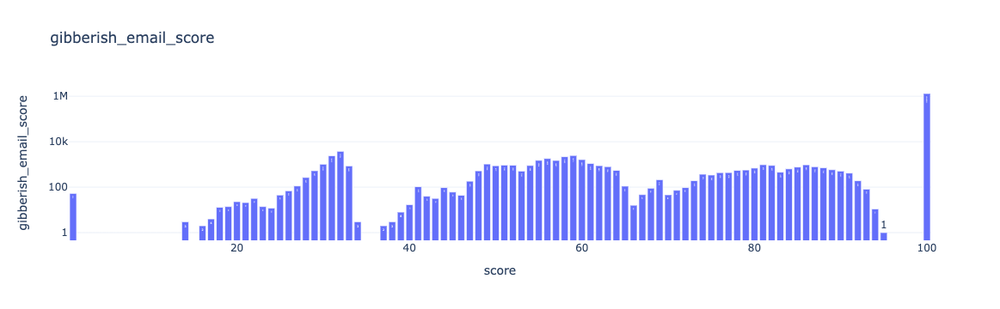

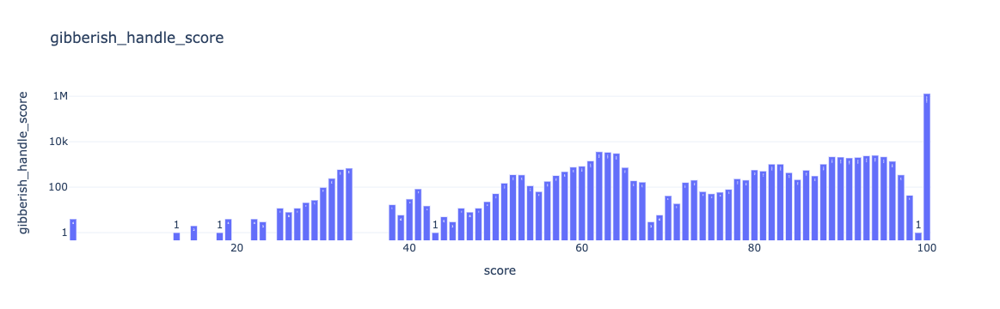

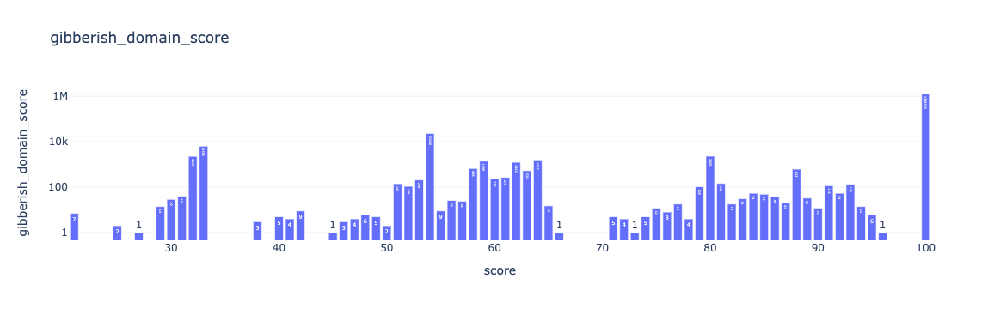

In [139]:
gibberish_email_score = pd.DataFrame(df.gibberish_email_score.value_counts().reset_index().sort_values(by='index',ascending=False))
gibberish_email_score.columns = ['score','gibberish_email_score']

gibberish_handle_score = pd.DataFrame(df.gibberish_handle_score.value_counts().reset_index().sort_values(by='index',ascending=False))
gibberish_handle_score.columns = ['score','gibberish_handle_score']

gibberish_domain_score = pd.DataFrame(df.gibberish_domain_score.value_counts().reset_index().sort_values(by='index',ascending=False))
gibberish_domain_score.columns = ['score','gibberish_domain_score']
# gibberish_email_score.head()

fig=px.bar(gibberish_email_score
          ,x='score'
          ,y='gibberish_email_score'
          ,text='gibberish_email_score'
          ,template='plotly_white'
          ,log_y=True
          ,height=300
          ,title='gibberish_email_score')
fig.show()
fig=px.bar(gibberish_handle_score
          ,x='score'
          ,y='gibberish_handle_score'
          ,text='gibberish_handle_score'
          ,template='plotly_white'
          ,log_y=True
          ,height=300
          ,title='gibberish_handle_score')
fig.show()
fig=px.bar(gibberish_domain_score
          ,x='score'
          ,y='gibberish_domain_score'
          ,text='gibberish_domain_score'
          ,template='plotly_white'
          ,log_y=True
          ,height=300
          ,title='gibberish_domain_score')
fig.show()

# Fraud Functions

In [80]:
def data_analysis(df, field, granularity = 1,xlim_sb = None, ylim_sb = None, xlim_total = None, ylim_total = None, figsize = (26,6)
                  ,minrate=None,maxrate=None,maxcount=None):
    if(granularity == 1):
        field_table = pd.crosstab(df[field],df.is_softblocked_tf)
    else:
        field_table = pd.crosstab(eval('(df[field]'+'/'+str(granularity) +').astype(int)*' + str(granularity)),df.is_softblocked_tf)
    field_table = field_table.reset_index(0)
    field_table = field_table.rename_axis('', axis = 1)
    field_table['is_softblocked_rate'] = field_table[1]/(field_table[0] + field_table[1])*100
    field_table['total_count'] = field_table[0] + field_table[1]
    field_table['percent_of_total'] = field_table['total_count']/sum(field_table['total_count']) * 100
    if minrate:
        field_table = field_table[field_table['is_softblocked_rate'] >= minrate]
    if maxrate:
        field_table = field_table[field_table['is_softblocked_rate'] <= maxrate]
    if maxcount:
        field_table = field_table[field_table['total_count'] >= maxcount]
        
#     field_table = field_table.reindex(['0','1','8','19','22','2','3','4','5','6','7','9','10','11','12','13','14','15','16','17','18','20','21'])
#     field_table = field_table.loc[['0','1','8','19','22','2','3','4','5','6','7','9','10','11','12','13','14','15','16','17','18','20','21'], :]
#     print(field_table.index)
    field_table = field_table.sort_values(by=field,ascending=True)

    return field_table

# Load da df to bigquery

In [78]:
try:
    gcp_client.delete_table('prod-analytics-1312.cx.max_da_score_bins')
except:
    print('Table does not exist')
gcp_client.load_table_from_dataframe(da, 'prod-analytics-1312.cx.max_da_score_bins')

Table does not exist


# View Model Risk Score Bin Breakdown

df shape:  (23, 6)
Metrics if we Softblock >= Score 100: 
total softblocked:  217714
total not softblocked:  18764
total users:  236478
softblocked per day est.:  7257.133333333333
false positives per day est.:  625.4666666666667
false positive ratio:  0.08618646481163361
daily impact:  7882.6
% softblocked:  0.9206522382631788

Metrics if we Softblock >= Score 200: 
total softblocked:  139174
total not softblocked:  9503
total users:  148677
softblocked per day est.:  4639.133333333333
false positives per day est.:  316.76666666666665
false positive ratio:  0.06828143187664362
daily impact:  4955.9
% softblocked:  0.9360829180034571


,risk_score_bin,not_softblocked,softblocked,is_softblocked_rate,total_count,percent_of_total
0,-50,474426,35481,6.96,509907,41.10
1,0,246625,21936,8.17,268561,21.64
8,25,74366,21138,22.13,95504,7.70
19,50,31084,14287,31.49,45371,3.66
22,75,31609,53330,62.79,84939,6.85
2,100,1043,13257,92.71,14300,1.15
3,125,3609,23758,86.81,27367,2.21
4,150,1675,12702,88.35,14377,1.16
5,175,2934,28823,90.76,31757,2.56
6,200,705,15686,95.70,16391,1.32


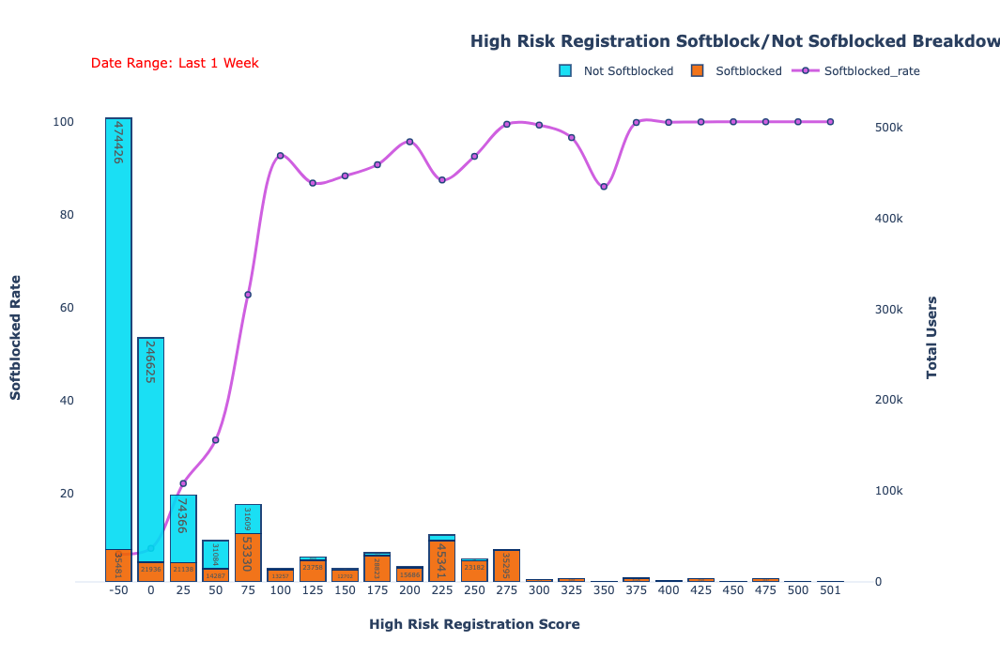

In [317]:
field = 'risk_score_bin'

#evaluate column/feature
da = data_analysis(df=df_final,field=field)

#test find low performing rules with these filters
# data_analysis(df=df,field='rules_triggered',maxrate=.1,maxcount=20)

#sort
# da = pd.DataFrame(data_analysis(df=df,field=field)).reset_index()

#sort by index manually
# da = da.reindex([0,1,8,19,22,2,3,4,5,6,7,9,10,11,12,13,14,15,16,17,18,20,21]) #april and may
# da = da.reindex([0,1,8,15,2,3,4,5,6,7,9,10,11,12,13,14]) #june
# da = da.reindex([0,1,8,15,2,3,4,5,6,7,9,10,11,12,13,14]) #july
da = da.reindex([0,1,8,19,22,2,3,4,5,6,7,9,10,11,12,13,14,15,16,17,18,20,21]) #june

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=da[field]
                         ,y=da['is_softblocked_rate']
#                          ,fill='tozeroy'
                         ,name='Softblocked_rate'
                         ,text=da['is_softblocked_rate']
                         ,line_shape='spline'
                         ,line=dict(width=3, dash='solid')
                         ,textposition="top center"
                         ,marker_color='rgb(201,77,220)'
                         ,marker_line_color='rgb(8,48,107)'
                         ,marker_line_width=1.5
                         ,marker_size=6
                         ,mode='lines+markers'
                         ,opacity=.9)
              ,secondary_y=False)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[1]
                     ,text=da[1]
                     ,textposition="inside"
                     ,name='Softblocked'
                     ,marker_color='rgb(240,100,0)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[0]
                     ,text=da[0]
                     ,textposition="inside"
                     ,name='Not Softblocked'
                     ,marker_color='rgb(0,219,243)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)
    
fig.update_layout(
    template='plotly_white'
    ,barmode='stack'
    ,height=700
#     ,title_x=0.5
    ,title='<b>                                                                             High Risk Registration Softblock/Not Sofblocked Breakdown</b><br>\
    <span style="font-size: 14;"><span style="color:red;">\
    Date Range: Last 1 Week<br>'
)

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

fig.update_xaxes(
    title_text="<b>High Risk Registration Score"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25
)

fig.update_yaxes(
    title_text="<b>Softblocked Rate"
    ,title_standoff=25
#     ,tickformat='%'
    ,secondary_y=False
    ,showgrid=False)

fig.update_yaxes(
    title_text="<b>Total Users"
    ,title_standoff=25
    ,showgrid=False
    ,rangemode="tozero"
    ,secondary_y=True)

da = da.fillna(0)

print('df shape: ', da.shape)

# Test for over 100 score
score1 = 100
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score1]

# print('')
print('Metrics if we Softblock >= Score 100: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/30)
print('false positives per day est.: ', df1[0].sum()/30)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/30)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

# Test for over 200 score
score2 = 200
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score2]

print('')
print('Metrics if we Softblock >= Score 200: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/30)
print('false positives per day est.: ', df1[0].sum()/30)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/30)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

da.columns = ['risk_score_bin','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
display(da)
fig.show()

# Fraud Patterns/Rules Function

In [10]:
#do not insert columns with null values
def fraud_rate(df, agg, cols=None, threshold=None, limit=None, days=None, minrate=None, maxrate=None):
    if isinstance(cols, str):
        groupcols = [cols]
    elif cols is None:
        groupcols = [] 
    else:
        try:
            groupcols = list(cols)
        except:
            raise TypeError('Unable to convert cols to a list.')
    fraudcols = groupcols + ['is_softblocked']
    cnts = df.groupby(fraudcols)[agg].nunique()
    if groupcols:
        wide = cnts.unstack('is_softblocked').fillna(0)
    else:
        wide = cnts.to_frame().stack(level=0).unstack('is_softblocked').fillna(0)
    wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))
    wide = wide.assign(total_users = wide.softblocked + wide.not_softblocked)
    wide = wide.assign(
        anomoly_index = wide.softblocked / wide.softblocked.sum()
        / wide.not_softblocked / wide.not_softblocked.sum()
    )
    if threshold:
        wide = wide.loc[wide.not_softblocked.gt(threshold)]
    wide = wide.sort_values('softblocked_rate', ascending=False)
    if limit:
        wide = wide.head(n=limit)
    wide = wide.assign(fpr=wide.not_softblocked / wide.softblocked)
    if days:
        wide = wide.assign(daily_impact = (wide.softblocked + wide.not_softblocked) / days)
    if minrate:
        wide = wide[wide['softblocked_rate'] >= minrate]
    if maxrate:
        wide = wide[wide['softblocked_rate'] <= maxrate]
    return wide

## Test low performing rule combos

In [223]:
#new rule creation cell
df[(df['rule_signup_method'] == 1)
    & (df['rule_state_name'] == 1)
    & (df['rule_is_fraud_device_id'] == 1)
    & (df['rule_fraud_ip_reg_hour'] == 1)
  ].head(1)

,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,risk_score_bin,risk_score,risk_rules_triggered,score_bin,rules_triggered,score,ua_part1,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,user_id,first_login_date,registration_day,registration_week,user_agent,state_name,zip,origin,ip_address_user,firewall_bot_score,device_id,device_fingerprint,first_name,signup_method,login_source,action,device_is_blacklisted,email_verified,email,registration_time,first_login_time,app_version,app_build,device_type,iphone_type,os,os_type,os_version,lang,registration_date,registration_hour,email_handle,email_domain,email_nums,count_email_nums,risky_origin,sb_email_handle,is_fraud_ip_address,is_fraud_device_id,emails_are_bouncing,is_softblocked,is_softblocked_tf,final_score,classify_email_score,classify_handle_score,classify_domain_score,strangeness_email_score,strangeness_handle_score,strangeness_domain_score,classify_handle_score_rule,classify_handle_score_sb_rate_pct_chg,prev_blocked_email_handle_sb_rate_pct_chg,uncommon_domain_sb_rate_pct_chg,disposable_domain_sb_rate_pct_chg,bot_score_bucket_sb_rate_pct_chg,is_emulator_sb_rate_pct_chg,origin_sb_rate_pct_chg,likely_invalid_email_sb_rate_pct_chg,zip_sb_rate_pct_chg,signup_method_sb_rate_pct_chg,registration_hour_sb_rate_pct_chg,email_nums_sb_rate_pct_chg,count_email_nums_sb_rate_pct_chg,state_name_sb_rate_pct_chg,emails_are_bouncing_sb_rate_pct_chg,is_fraud_device_id_sb_rate_pct_chg,is_fraud_ip_address_sb_rate_pct_chg,fraud_ip_reg_hour_sb_rate_pct_chg,state_name_reg_hour_sb_rate_pct_chg,origin_fraud_ip_sb_rate_pct_chg,low_risk_rules_triggered_sb_rate_pct_chg,risky_first_name_sb_rate_pct_chg
20,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,1,0,0,0,0,0,NaN,NaN,0,",,,,,,,,signup_method,,,,state_name,,is_fraud_device_id,,fraud_ip_reg_hour,,,,",-40,OfferUp/4.2.0,0,0,0,0,0,70,0,122520624,0,2021-07-02,2021-06-27,OfferUp/4.2.0 (build: 140124431; samsung SM-G970N N2G47H; Android 7.1.2; en_US),NJ,07306,android,0.0.0.0,70.00,f9a8836e1b578199,0,Bennett,email,0,0,0,False,0,2021-07-02 02:14:11.236000+00:00,0,4.2.0,140124431,samsung SM-G970N N2G47H,0,Android 7.1.2,Android,7.1.2,en_US,2021-07-02,2,0,0,0,0,0,0,0,1,0,softblocked,1,0,100.00,100.00,100.00,7.00,7.00,7.00,0,0.00,0.00,0.00,0.00,0.00,0.00,0.07,0.00,0.01,-0.07,0.02,0.00,0.00,0.01,0.00,0.02,0.00,0.01,-0.00,0.06,0.00,-0.17


### Step 1: Create dataframe based on score range

In [11]:
# df1 = df[df['risk_score'].between(99,201)]
df1 = df[(df['risk_score'].isin([-100,-50,0]))]
#         & (df['is_softblocked'] == 'softblocked')]

print(df1.risk_score.value_counts())
df1.head()

0.00       729373
-100.00    298508
-50.00     251941
Name: risk_score, dtype: int64


,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,rule_device_linked_ge_15_accts,risk_score,risk_scores,risk_rules_triggered,score_bin,rules_triggered,score,ua_part1,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,length_email_handle_bin,first_name_spec_char,user_id,registration_day,registration_week,user_agent,state_name,zip,origin,ip_address,firewall_bot_score,device_id,first_name,signup_method,device_is_blacklisted,email_verified,email,app_version,app_build,device_type,iphone_type,os,os_type,os_version,lang,registration_date,registration_hour,length_email_handle,email_handle,email_domain,top_level_domain,email_nums,count_email_nums,risky_origin,sb_email_handle,added_profile_pic,count_accounts,disposable_domain_test,is_fraud_ip_address,is_fraud_device_id,emails_are_bouncing,is_softblocked,is_softblocked_tf,final_score,classify_email_score,classify_handle_score,classify_domain_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,classify_handle_score_sb_rate_pct_chg,prev_blocked_email_handle_sb_rate_pct_chg,uncommon_domain_sb_rate_pct_chg,disposable_domain_sb_rate_pct_chg,bot_score_bucket_sb_rate_pct_chg,is_emulator_sb_rate_pct_chg,origin_sb_rate_pct_chg,likely_invalid_email_sb_rate_pct_chg,zip_sb_rate_pct_chg,signup_method_sb_rate_pct_chg,registration_hour_sb_rate_pct_chg,email_nums_sb_rate_pct_chg,count_email_nums_sb_rate_pct_chg,state_name_sb_rate_pct_chg,emails_are_bouncing_sb_rate_pct_chg,is_fraud_device_id_sb_rate_pct_chg,is_fraud_ip_address_sb_rate_pct_chg,fraud_ip_reg_hour_sb_rate_pct_chg,state_name_reg_hour_sb_rate_pct_chg,origin_fraud_ip_sb_rate_pct_chg,low_risk_rules_triggered_sb_rate_pct_chg,risky_first_name_sb_rate_pct_chg,rule_signup_state_dev_ip_hour_sb_rate_pct_chg,rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg,rule_device_linked_ge_15_accts_sb_rate_pct_chg
0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,-100.00,-140,",,,,,rule_origin,,,rule_signup_method,,,,,,,,rule_fraud_ip_reg_hour,,,,,,,",lt-50,",,,,,origin,,,signup_method,,,,,,,,fraud_ip_reg_hour,,,,,,",-140,Mozilla/5.0,1,0,0,0,0,75,0,20,1,124511163,2021-08-18,2021-08-15,"Mozilla/5.0 (iPhone; CPU iPhone OS 14_7_1 like Mac OS X) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.1.2 Mobile/15E148 Safari/604.1",None,None,web_mobile,0.0.0.0,73.0,web-c36eaa599408e5a14b389cf9b82e6c07a355164b47138f403c82a469,Carlos Cota,email,None,False,carlitoscotagamboa3@gmail.com,None,None,None,None,None,None,None,None,2021-08-18,2,19.00,carlitoscotagamboa3,None,.com,None,0,0,None,0,1,0,0,0,0,not_softblocked,0,0,29.00,62.00,0.00,0,0,-0.01,0.00,0.16,0.16,583.93,582.78,-0.01,1.44,1.34,-0.07,-0.02,0.00,0.00,0.01,0.00,0.04,0.00,-0.01,0.02,-0.03,0.00,-0.12,0.01,-0.02,0.32
4,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,0,0,0,0,1,0,0.00,50,",,,,,,,,,,,,rule_state_name,,rule_is_fraud_device_id,,rule_fraud_ip_reg_hour,,,,,fraud_dev_bot_reg_hr,,",26-50,",,,,,,,,,,,,state_name,,is_fraud_device_id,,fraud_ip_reg_hour,,,,fraud_dev_bot_reg_hr,,",50,OfferUp/4.12.1,1,0,0,0,0,75,0,20,1,124519366,2021-08-18,2021-08-15,OfferUp/4.12.1 (build: 401201001; samsung SM-N9760 N2G48B; Android 7.1.2; en_US),NV,89118,android,0.0.0.0,75.0,fb8c4cc0bea3c7c5,Shaquana Lagrimas,google,None,False,shaquanalagrimas43@gmail.com,4.12.1,401201001,samsung SM-N9760 N2G48B,None,Android 7.1.2,Android,7.1.2,en_US,2021-08-18,6,18.00,shaquanalagrimas43,None,.com,None,0,0,None,0,1,0,0,1,0,softblocked,1,0,59.00,64.00,0.00,0,0,-0.01,0.00,0.16,0.16,583.93,582.78,-0.01,1.44,1.34,-0.07,-0.02,0.00,0.00,0.01,0.00,0.04,0.00,-0.01,0.02,-0.03,0

### Step 2: Show the metrics per score within that score range 

In [55]:
#do not insert columns with null values
cols = ['rules_triggered']
# cols = ['risk_score_bin']

fraud_rate_df = fraud_rate(df1
                           ,'user_id'
                           ,cols
                           ,threshold=50
                           ,days=30
                           ,minrate=.9
#                            ,maxrate=.1
                          )

print('df shape: ', fraud_rate_df.shape)
print('total softblocked: ', fraud_rate_df.softblocked.sum())
print('total not softblocked: ', fraud_rate_df.not_softblocked.sum())
print('total users: ', fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum())
print('% softblocked: ', fraud_rate_df.softblocked.sum() / (fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum()))
fraud_rate_df.head(100)

df shape:  (11, 7)
total softblocked:  12693.0
total not softblocked:  933.0
total users:  13626.0
% softblocked:  0.9315279612505504


is_softblocked,not_softblocked,softblocked,softblocked_rate,total_users,anomoly_index,fpr,daily_impact
rules_triggered,,,,,,,
",,,,,,,,signup_method,registration_hour,,,state_name,,is_fraud_device_id,,,,origin_fraud_ip,,,,",59.00,1273.00,0.96,1332.00,0.00,0.05,44.40
",,,,,,,,signup_method,,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,,,fraud_dev_bot_reg_hr,,",87.00,1685.00,0.95,1772.00,0.00,0.05,59.07
",,,,,,,,signup_method,registration_hour,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,,,fraud_dev_bot_reg_hr,,",63.00,1185.00,0.95,1248.00,0.00,0.05,41.60
",,,,,,,,signup_method,,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,origin_fraud_ip,,fraud_dev_bot_reg_hr,,",72.00,1035.00,0.93,1107.00,0.00,0.07,36.90
",,,,,,,,signup_method,,,,state_name,,is_fraud_device_id,,,,,,,,",77.00,1057.00,0.93,1134.00,0.00,0.07,37.80
",,,,,,,,signup_method,registration_hour,,,state_name,,is_fraud_device_id,,,,,,,,",65.00,876.00,0.93,941.00,0.00,0.07,31.37
",,,,,,,,signup_method,,,,,,is_fraud_device_id,,,,origin_fraud_ip,,,,",112.00,1372.00,0.92,1484.00,0.00,0.08,49.47
",,,,,,,,,registration_hour,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,origin_fraud_ip,,fraud_dev_bot_reg_hr,,",92.00,1051.00,0.92,1143.00,0.00,0.09,38.10
",,,,,,,,signup_method,registration_hour,,,,,is_fraud_device_id,,,,origin_fraud_ip,,,,",98.00,1072.00,0.92,1170.00,0.00,0.09,39.00


### Step 3: Show low fraud rate rule combos/rules_triggered

In [12]:
#Original (look for rule combos/rules triggered in df1)
# cols = ['state_name_reg_hour','origin_fraud_ip','classify_handle_score','state_name','fraud_ip_reg_hour','signup_method','registration_hour']
# cols = ['first_name']
# cols = ['app_version']
# cols = ['disposable_domain_test']
# cols = ['top_level_domain','email_domain']
# cols = ['is_fraud_device_id','rule_fraud_ip_reg_hour']
# cols = ['rule_signup_method','rule_registration_hour','rule_state_name','rule_is_fraud_device_id','rule_origin_fraud_ip']
# cols = ['is_two_names']
# cols = ['prev_blocked_email_handle']
# cols = ['disposable_domain']
cols = ['length_email_handle_bin']
# cols = ['first_name_spec_char']
# cols = ['is_emulator']
# cols = ['device_is_blacklisted']
# cols = ['email_verified']
# ###cols = ['lang']
# cols = ['count_accounts']

# cols = ['count_accounts','lang','length_email_handle_bin']
# cols = ['count_accounts','length_email_handle_bin']
# cols = ['length_email_handle_bin','lang']


# test cols: pin_unauth, G_ENABLED_IDPS, DX, csrf,cf_bm
# ,sim_uuid, sim_si, uetvid, ga, op_context, uetsid, ou_ads_id, 
# viewport, ga_QP0R22E78S, X_OU_F_TOKEN, gid, gat_gtag_UA_16437919_15, 
# sim_cr, afUserId, cfduid
# cols = ['rule_signup_method','rule_state_name','rule_is_fraud_device_id','rule_fraud_ip_reg_hour','rule_origin_fraud_ip','rule_registration_hour']

fraud_rate_df = fraud_rate(df1
                           ,'user_id'
                           ,cols
                           ,threshold=50
                           ,days=30
                           ,minrate=.1
#                            ,maxrate=.9
                          )

print('df shape: ', fraud_rate_df.shape)
print('total softblocked: ', fraud_rate_df.softblocked.sum())
print('total not softblocked: ', fraud_rate_df.not_softblocked.sum())
print('total users: ', fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum())
print('% softblocked: ', fraud_rate_df.softblocked.sum() / (fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum()))
fraud_rate_df.head(100)

df shape:  (0, 7)
total softblocked:  0
total not softblocked:  0
total users:  0
% softblocked:  nan


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in long_scalars



is_softblocked,not_softblocked,softblocked,softblocked_rate,total_users,anomoly_index,fpr,daily_impact
length_email_handle_bin,,,,,,,


### Step 4: Test out the column pairs to find new rules

In [282]:
#lookup rule combo data
#pass in different column names from your data set to find which column combos create the best rule
#i passed in 4, but you can add as many as you want really - within reason, given compute constraints
df['count_accounts'] = df['count_accounts'].astype(int)
df['count_accounts'] = df['count_accounts'].fillna(0)
num_days = df.registration_date.nunique()
cols = ['count_accounts']
# cols = ['first_name','top_level_domain']
# cols = ['first_name','top_level_domain','signup_method']
# cols = ['first_name','top_level_domain','signup_method','state_name']

#fraud_rate function converted to df
fraud_rate_df = fraud_rate(df
                           ,'device_id' #can change to 'user_id'
                           ,cols #list of cols from above
                           ,threshold=5 #rule must trigger on at least this amount of devices/users ids
                           ,days=30 #used for how many days your dataset encompasses (used for daily impact metric)
#                            ,maxrate=.1 #if you're making a rule to find good users, use max rate as it finds the highest returnable fraud rate
                                           #thus limiting bad users triggered by the rule
                           ,minrate=.1 #opposite of max rate; finds the mninimum fraud/softblocked rate for a rule
                          )

print('Rule Metrics: ')
print('df shape: ', fraud_rate_df.shape)
print('total softblocked: ', fraud_rate_df.softblocked.sum())
print('total not softblocked: ', fraud_rate_df.not_softblocked.sum())
print('total count: ', fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum())
print('% softblocked: ', round(fraud_rate_df.softblocked.sum() / (fraud_rate_df.softblocked.sum() + fraud_rate_df.not_softblocked.sum()),2))
print('daily impact: ', round((fraud_rate_df['softblocked'].sum() + fraud_rate_df['not_softblocked'].sum())/num_days,2))
print('softblocked per day est.: ', round(fraud_rate_df['softblocked'].sum()/num_days,2))
print('false positives per day est.: ', round(fraud_rate_df['not_softblocked'].sum()/num_days,2))
# print('false positive ratio: ', round(fraud_rate_df['not_softblocked'].sum() / fraud_rate_df['softblocked'].sum()),3)

fraud_rate_df.head(20)

Rule Metrics: 
df shape:  (32, 7)
total softblocked:  264506.0
total not softblocked:  779825.0
total count:  1044331.0
% softblocked:  0.25
daily impact:  33688.1
softblocked per day est.:  8532.45
false positives per day est.:  25155.65


is_softblocked,not_softblocked,softblocked,softblocked_rate,total_users,anomoly_index,fpr,daily_impact
count_accounts,,,,,,,
30,7.00,18.00,0.72,25.00,0.00,0.39,0.83
24,14.00,34.00,0.71,48.00,0.00,0.41,1.60
23,11.00,26.00,0.70,37.00,0.00,0.42,1.23
15,46.00,106.00,0.70,152.00,0.00,0.43,5.07
22,14.00,30.00,0.68,44.00,0.00,0.47,1.47
26,12.00,23.00,0.66,35.00,0.00,0.52,1.17
20,22.00,42.00,0.66,64.00,0.00,0.52,2.13
16,46.00,87.00,0.65,133.00,0.00,0.53,4.43
8,333.00,625.00,0.65,958.00,0.00,0.53,31.93


In [158]:
def multiple_defect(df, agg, cols, n, minrate):
    combos = list(itertools.combinations(cols, n))
    num_cols = ['col' + str(i) for i in range(1, n + 1)]
    res = []
    for combo in combos:
        fr = fraud_rate(df, agg, combo)
        fr = fr.reset_index()
        fr.columns = num_cols + ['fraud', 'nonfraud', 'fraudrate','fpr']
        fr = fr.assign(groupcols = ', '.join(combo))
        fr = fr.loc[fr.fraudrate.gt(minrate)]
        res.append(fr)
    return pd.concat(res).sort_values(by='fraudrate', ascending=False)

In [159]:
cols = ['state_name_reg_hour','origin_fraud_ip','classify_handle_score','state_name','fraud_ip_reg_hour','signup_method','registration_hour']

multiple_defect(df1
                ,'user_id'
                ,cols
                ,3
                ,minrate=.5
               )

ValueError: Length mismatch: Expected axis has 9 elements, new values have 7 elements

# Machine Learning on lower fraud scores

### Test and Train data

### For Analysis

In [209]:
from ast import literal_eval
import math
import re

import plotly.figure_factory as ff
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

from difflib import SequenceMatcher
from collections import Counter
from itertools import groupby

from sklearn import model_selection
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.metrics import plot_confusion_matrix
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import precision_recall_fscore_support

In [251]:
#filter out columns
df1 = df[(df['risk_score_bin'].isin(['-50','0','25']))]
df1 =  df1[['rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
            ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
            ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
            ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
            ,'rule_fraud_dev_bot_reg_hr','risk_score','risk_score_bin','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email' 
            ,'disposable_domain','bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums'
            ,'is_fraud_device_id','emails_are_bouncing' ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
            ,'is_softblocked_tf']]

#columns removed and to be one hot encoded later
# state_name, zip, origin, email_verified, lang, os, os_type, os_version, device_type, iphone_type, email_domain, top_level_domain, email_nums

#convert dtypes
df1['classify_handle_score'] = df1['classify_handle_score'].astype('float')
df1['registration_hour'] = df1['registration_hour'].astype('int')
df1['firewall_bot_score'] = df1['firewall_bot_score'].astype('float')

print('df1 shape: ', df1.shape)
print('df1 fraud value count: \n', df1.is_softblocked_tf.value_counts())
print('df1 fraud rate: ', round(df1.is_softblocked_tf.value_counts()[1] / (df1.is_softblocked_tf.value_counts()[0] + df1.is_softblocked_tf.value_counts()[1]),2))
df1.head()

df1 shape:  (269, 41)
df1 fraud value count: 
 0    255
1     14
Name: is_softblocked_tf, dtype: int64
df1 fraud rate:  0.05


,user_id,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf
0,124807456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5,0,1.00,14,0,0,0,73.00,0,0,0
1,124807352,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-190,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,32.00,0,0,0
2,124807672,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,15,0,0,0,96.00,1,0,0
3,124807565,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,14,0,0,0,95.00,1,0,0
4,124807497,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-250,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,49.00,0,0,0


In [250]:
#Create Test and Train arrays
#if you add more columns to the dataset
#make sure you adjust the X and y column ranges
X = df1[df1.columns[0:38]].values
y = df1[df1.columns[39]].values

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.9)

print('X_train shape: \n', X_train.shape)
print('X_test shape: \n', X_test.shape)
print('y_train shape: \n', y_train.shape)
print('y_test shape: \n', y_test.shape)
print('')
print('x_train:', X_train)
print('y_train:', y_train)
print('x_test:', X_test)
print('y_test:', y_test)

X_train shape: 
 (26, 38)
X_test shape: 
 (243, 38)
y_train shape: 
 (26,)
y_test shape: 
 (243,)

x_train: [[0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 20 '25' 1 0 1 0 0 35 0 33.0
  14 0 0 0 84.0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 -200 '-50' 1 0 0 0 0 75 0
  74.0 15 0 0 0 89.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 -150 '-50' 0 0 0 0 0 85 0
  83.0 14 0 0 0 63.0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 -190 '-50' 1 0 0 0 0 75 0
  73.0 14 0 0 0 61.0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 -200 '-50' 1 0 0 0 0 75 0
  73.0 14 0 0 0 83.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 -150 '-50' 0 0 0 0 0 80 0
  79.0 14 0 0 0 88.0 0]
 [0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 -200 '-50' 1 0 0 0 0 75 0
  75.0 14 0 0 0 73.0 0]
 [0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 -180 '-50' 0 0 1 0 0 80 0
  79.0 14 0 0 0 90.0 0]
 [0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 20 '25' 0 0 1 0 0 35 0 32.0
  14 0 0 0 90.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 

### Create Classifiers

In [109]:
#First Iteration of Classifiers
#logistic regression classifier
lr = LogisticRegression()
lr.fit(X_train, y_train)
lr_predictions = lr.predict(X_test)

print('LR Confusion Matrix: \n', confusion_matrix(y_test, lr_predictions))
# print('LR y_pred_class: \n', y_pred_class)
print('LR Accuracy Score: ', accuracy_score(y_test, lr_predictions))

print('')

#random forest classifier
rfc = RandomForestClassifier(n_estimators=100)
rfc.fit(X_train, y_train)
rfc_predictions = rfc.predict(X_test)
# print('rfc score train: ',rfc.score(X_train, y_train))
# print('rfc score test: ',rfc.score(X_test, y_test))
print('RFC Confusion Matrix: \n', confusion_matrix(y_test, rfc_predictions))
print('RFC Accuracy Score: ', accuracy_score(y_test, rfc_predictions))

print('')

#knn classifier
knn = KNeighborsClassifier(n_neighbors=9)
knn.fit(X_train, y_train)
knn_predictions = knn.predict(X_test)

print('KNN Confusion Matrix: \n', confusion_matrix(y_test, knn_predictions))
# print('knn_predictions: \n',knn_predictions)
print('KNN Accuracy Score: ', accuracy_score(y_test, knn_predictions))

print('')

#svc classifier
svc = SVC(C=1.0)
svc.fit(X_train, y_train)
svc_predictions = svc.predict(X_test)
# print('svc score train: ',svc.score(X_train, y_train))
# print('svc score test: ',svc.score(X_test, y_test))
print('SVC Confusion Matrix: \n', confusion_matrix(y_test, svc_predictions))
print('SVC Accuracy Score: ', accuracy_score(y_test, svc_predictions))

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LR Confusion Matrix: 
 [[171194      1]
 [     6    319]]
LR Accuracy Score:  0.9999591884328358

RFC Confusion Matrix: 
 [[171195      0]
 [     0    325]]
RFC Accuracy Score:  1.0

KNN Confusion Matrix: 
 [[171195      0]
 [    84    241]]
KNN Accuracy Score:  0.9995102611940299

SVC Confusion Matrix: 
 [[171195      0]
 [   174    151]]
SVC Accuracy Score:  0.9989855410447761


### Create Classification Report Function

In [213]:
#classification report function and classifiers
def pandas_classification_report(y_true, y_pred):
    metrics_summary = precision_recall_fscore_support(
        y_true=y_test
        , y_pred=y_predictions
        , labels=np.unique(y_pred)
    )

    avg = list(precision_recall_fscore_support(
            y_true=y_test, 
            y_pred=y_predictions,
            average='weighted'))

    metrics_sum_index = ['precision', 'recall', 'f1-score', 'support']
    class_report_df = pd.DataFrame(
        list(metrics_summary),
        index=metrics_sum_index)

    support = class_report_df.loc['support']
    total = support.sum() 
    avg[-1] = total

    class_report_df['avg / total'] = avg

    return class_report_df.T

classifiers = {
    "Naive Bayes": GaussianNB(),
    "LogisiticRegression": LogisticRegression(),
    "DecisionTreeClassifier": DecisionTreeClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
}

### Confusion Matrices

In [214]:
#classification report function and classifiers
def pandas_classification_report(y_true, y_pred):
    metrics_summary = precision_recall_fscore_support(
        y_true=y_test
        , y_pred=y_predictions
        , labels=np.unique(y_pred)
    )

    avg = list(precision_recall_fscore_support(
            y_true=y_test, 
            y_pred=y_predictions,
            average='weighted'))

    metrics_sum_index = ['precision', 'recall', 'f1-score', 'support']
    class_report_df = pd.DataFrame(
        list(metrics_summary),
        index=metrics_sum_index)

    support = class_report_df.loc['support']
    total = support.sum() 
    avg[-1] = total

    class_report_df['avg / total'] = avg

    return class_report_df.T

classifiers = {
    "Naive Bayes": GaussianNB(),
    "LogisiticRegression": LogisticRegression(),
    "DecisionTreeClassifier": DecisionTreeClassifier(),
    "RandomForestClassifier": RandomForestClassifier(),
    "KNN": KNeighborsClassifier(),
    "Support Vector Classifier": SVC(),
}

High Risk Registration Classification Report: 

GaussianNB() 
              precision  recall  f1-score   support
0                 0.96    0.96      0.96 158858.00
1                 0.52    0.53      0.52  12662.00
avg / total       0.93    0.93      0.93 171520.00


/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression() 
              precision  recall  f1-score   support
0                 0.97    0.98      0.97 158858.00
1                 0.70    0.57      0.63  12662.00
avg / total       0.95    0.95      0.95 171520.00
DecisionTreeClassifier() 
              precision  recall  f1-score   support
0                 0.97    0.97      0.97 158858.00
1                 0.65    0.65      0.65  12662.00
avg / total       0.95    0.95      0.95 171520.00
RandomForestClassifier() 
              precision  recall  f1-score   support
0                 0.97    0.99      0.98 158858.00
1                 0.79    0.66      0.72  12662.00
avg / total       0.96    0.96      0.96 171520.00
KNeighborsClassifier() 
              precision  recall  f1-score   support
0                 0.95    0.99      0.97 158858.00
1                 0.70    0.32      0.44  12662.00
avg / total       0.93    0.94      0.93 171520.00


/opt/conda/lib/python3.7/site-packages/sklearn/metrics/_classification.py:1248: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



SVC() 
              precision  recall  f1-score   support
0                 0.93    1.00      0.96 158858.00
avg / total       0.86    0.93      0.89 158858.00


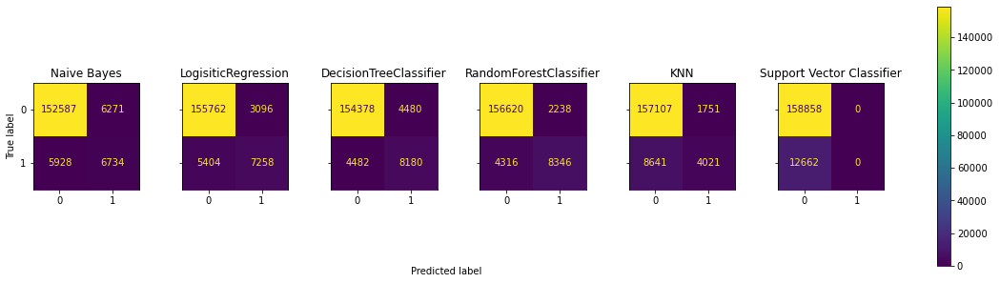

In [136]:
f, axes = plt.subplots(1, 6, figsize=(20, 5), sharey='row')

print('High Risk Registration Classification Report: \n')

for i, (key, classifier) in enumerate(classifiers.items()):
    y_pred = classifier.fit(X_train, y_train).predict(X_test)
    y_predictions = classifier.predict(X_test)
    df_class_report = pandas_classification_report(y_true=y_test, y_pred=y_predictions)
    print((classifier),'\n', df_class_report)
    cf_matrix = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(cf_matrix)
#                                   display_labels=)
    disp.plot(ax=axes[i], xticks_rotation=0)
    disp.ax_.set_title(key)
    disp.im_.colorbar.remove()
    disp.ax_.set_xlabel('')
    if i!=0:
        disp.ax_.set_ylabel('')
        
f.text(0.4, 0.1, 'Predicted label', ha='left')
plt.subplots_adjust(wspace=0.40, hspace=0.1)

f.colorbar(disp.im_, ax=axes)
plt.show()

### Add predictions back to dataframe

In [215]:
#Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['nb_preds'] = nb_pred
df_out = pd.merge(df1,df_pred[['nb_preds']],how = 'left',left_index = True, right_index = True)

#LogisticRegression
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['lr_preds'] = lr_pred
df_out = pd.merge(df_out,df_pred[['lr_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
### I've got my predictions now ####
dt_pred = dt_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['dt_preds'] = dt_pred
df_out = pd.merge(df_out,df_pred[['dt_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
### I've got my predictions now ####
rf_pred = rf_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['rf_preds'] = rf_pred
df_out = pd.merge(df_out,df_pred[['rf_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
### I've got my predictions now ####
knn_pred = knn_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['knn_preds'] = knn_pred
df_out = pd.merge(df_out,df_pred[['knn_preds']],how = 'left',left_index = True, right_index = True)

df_out.head()

/opt/conda/lib/python3.7/site-packages/sklearn/linear_model/_logistic.py:765: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf,nb_preds,lr_preds,dt_preds,rf_preds,knn_preds
5,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,-215,-50,1,0,0,0,0,80,0,77.00,5,0,0,0,92.00,1,0,0,0.00,0.00,0.00,0.00,0.00
6,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,-180,-50,1,0,0,0,0,80,0,76.00,17,0,0,0,61.00,0,0,0,0.00,0.00,0.00,0.00,0.00
7,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,-130,-50,0,0,0,0,0,70,0,68.00,21,0,0,0,62.00,0,0,1,0.00,0.00,0.00,0.00,0.00
8,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,-230,-50,0,0,1,0,0,75,0,73.00,11,0,0,0,64.00,0,0,0,0.00,0.00,0.00,0.00,0.00
12,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-130,-50,0,0,1,0,0,80,0,76.00,2,0,0,0,67.00,0,0,1,0.00,0.00,0.00,0.00,0.00


In [220]:
#create column for ml prediction scores
#trying with just random forest
def ml_pred_score(row):
#     if row['nb_preds'] == 1:
#         return '1'
#     elif row['lr_preds'] == 1:
#         return '1'
#     elif row['dt_preds'] == 1:
#         return '1'
    if row['rf_preds'] == 1:
        return '1'
#     elif row['knn_preds'] == 1:
#         return '1'
    elif row['is_softblocked_tf'] == 1:
        return '1'
    else:
        return '0'

df_out['ml_pred_score'] = df_out.apply(lambda row: ml_pred_score(row), axis = 1)

#create df_preds df
# df_preds = df_out[['risk_score_bin','nb_preds','lr_preds','dt_preds','rf_preds','knn_preds']]
# df_preds.columns = ['risk_score_bin_preds','nb_preds','lr_preds','dt_preds','rf_preds','knn_preds']

#replace is_softblocked column with machine learning is softblocked column
df_out.drop('is_softblocked_tf', axis=1, inplace=True)
df_out=df_out.rename(columns = {'ml_pred_score':'is_softblocked_tf'})

df_out.head()

,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,nb_preds,lr_preds,dt_preds,rf_preds,knn_preds,is_softblocked_tf
5,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,0,1,0,1,0,0,0,-215,-50,1,0,0,0,0,80,0,77.00,5,0,0,0,92.00,1,0,0.00,0.00,0.00,0.00,0.00,0
6,0,0,0,0,0,1,0,0,1,1,0,0,1,0,0,0,1,0,0,0,0,0,-180,-50,1,0,0,0,0,80,0,76.00,17,0,0,0,61.00,0,0,0.00,0.00,0.00,0.00,0.00,0
7,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,-130,-50,0,0,0,0,0,70,0,68.00,21,0,0,0,62.00,0,0,0.00,0.00,0.00,0.00,0.00,0
8,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,-230,-50,0,0,1,0,0,75,0,73.00,11,0,0,0,64.00,0,0,0.00,0.00,0.00,0.00,0.00,0
12,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-130,-50,0,0,1,0,0,80,0,76.00,2,0,0,0,67.00,0,0,0.00,0.00,0.00,0.00,0.00,0


In [200]:
#Merge prediction cols back to original df
# df_preds = df_out[['risk_score_bin','nb_preds','lr_preds','dt_preds','rf_preds','knn_preds']]
# df_preds.columns = ['risk_score_bin_preds','nb_preds','lr_preds','dt_preds','rf_preds','knn_preds']
# df_preds.head()
# df = pd.concat([df,df_preds], axis=1)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,risk_score_bin_preds,nb_preds,lr_preds,dt_preds,rf_preds,knn_preds
0,0,1,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,175,170,",rule_uncommon_domain,,,,,,,rule_signup_method,,,,,rule_emails_are_bouncing,,,,,rule_origin_fraud_ip,,,,",151-175,",uncommon_domain,,,,,,,signup_method,,,,,emails_are_bouncing,,,,,origin_fraud_ip,,,",170,OfferUp/4.10.3,1,0,1,0,0,45,0,124767966,0,2021-08-24,2021-08-22,"OfferUp/4.10.3 (build: 401003001; iPhone13,1; iOS 13.4; en)",0,0,iphone,0.0.0.0,41.0,1C88656C-1D61-48A6-98DE-E2E70A04EBC5,0,Jessie Gang,email,0,0,0,False,jessiegang5474@vmi.edu,4.10.3,401003001,"iPhone13,1",13.1,iOS 13.4,iOS,13.4,en,2021-08-24,15,jessiegang5474,vmi.edu,.edu,0,0,0,0,0,0,1,softblocked,1,0,49.00,63.00,88.00,inf,4.80,4.30,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0,1,0,0,0,1,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,1,175,170,",rule_uncommon_domain,,,,rule_origin,,,rule_signup_method,,,,,,rule_is_fraud_device_id,,rule_fraud_ip_reg_hour,,,,,fraud_dev_bot_reg_hr,",151-175,",uncommon_domain,,,,origin,,,signup_method,,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,,,fraud_dev_bot_reg_hr,",170,OfferUp/4.12.1,1,0,1,0,0,70,0,124720064,0,2021-08-23,2021-08-22,"OfferUp/4.12.1 (build: 401201001; iPad8,11; iOS 12.0.1; en)",TX,75211,ipad,0.0.0.0,66.0,1EA600C5-9B5E-4AF5-9AC9-35F68505C561,0,Elisa Brown,email,0,0,0,False,elisabrown1815@kent.edu,4.12.1,401201001,"iPad8,11",0,iOS 12.0.1,iOS,12.0.1,en,2021-08-23,6,elisabrown1815,kent.edu,.edu,0,0,1,0,0,1,0,softblocked,1,0,56.00,64.00,59.00,inf,4.10,3.80,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0,0,0,0,375,360,",,,,,,,,rule_signup_method,,,,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,,,,,,,,",351-375,",,,,,,,,signup_method,,,,state_name,emails_are_bouncing,is_fraud_device_id,,,,,,,",360,OfferUp/4.11.1,1,0,0,0,0,30,0,124760724,0,2021-08-24,2021-08-22,OfferUp/4.11.1 (build: 401101001; samsung SM-A125F QP1A.190711.020; Android 10; en_GB),CO,80237,android,0.0.0.0,29.0,c7d4d63df6ca523b,0,Jay Adams,email,0,0,0,False,paulinusjay567@gmail.com,4.11.1,401101001,samsung SM-A125F QP1A.190711.020,0,Android 10,Android,10,en_GB,2021-08-24,7,paulinusjay567,gmail.com,.com,0,0,0,0,0,1,1,softblocked,1,0,57.00,64.00,54.00,inf,4.80,3.90,0,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0,1,0,0,0,0,0,0,1,1,0,0,0,0,1,0,1,0,0,0,0,1,150,205,",rule_uncommon_domain,,,,,,,rule_signup_method,rule_registration_hour,,,,,rule_is_fraud_device_id,,rule_fraud_ip_reg_hour,,,,,fraud_dev_bot_reg_hr,, classify_handle_score",126-150,",uncommon_domain,,,,,,,signup_method,registration_hour,,,,,is_fraud_device_id,,fraud_ip_reg_hour,,,,fraud_dev_bot_reg_hr,",130,OfferUp/4.12.1,0,0,1,0,0,75,0,124741268,0,2021-08-23,2021-08-22,OfferUp/4.12.1 (build: 401201001; Redmi M2006C3MG QP1A.190711.020; Android 10; en_GB),0,0,android,0.0.0.0,75.0,254ec360511658f4,0,Benjamin,email,0,0,0,False,bdgjkbfnkjfx@offerup.com,4.12.1,401201001,Redmi M2006C3MG QP1A.190711.020,0,Android 10,Android,10,en_GB,2021-08-23,21,bdgjkbfnkjfx,offerup.com,.com,0,0,0,0,0,1,0,softblocked,1,0,89.00,95.00,32.00,inf,5.20,3.40,1,0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0,0,0,0,0,0,0,0,1

# Plot ML Scores

In [242]:
#original df
df_final = df[~df['risk_score_bin'].isin(['-50','0','25'])]
df_final = df_final[['is_softblocked_tf','risk_score_bin']]
print('df_final shape: ', df_final.shape)

#ml df
df_ml = df_out[['is_softblocked_tf','risk_score_bin']]
# def ml_scores(row):
#     if row['is_softblocked_tf'] == 1:
#         return '99'
#     else:
#         '0'
# df_ml['is_softblocked_tf'] = df_out.apply(lambda row: ml_scores(row), axis = 1)
# df_ml['is_softblocked_tf'] = df_ml['is_softblocked_tf'].astype('int')
m = df_ml['is_softblocked_tf'] == 1
df_ml.loc[m, 'risk_score_bin'] = df_ml.loc[m, 'risk_score_bin'] + 300
print('df_ml shape: ', df_ml.shape)

#concat dfs
df_final = pd.concat([df_final,df_ml], ignore_index=True)
print('df_final shape: ', df_final.shape)

#convert 0s and dtypes
# df_final['ml_pred_score'] = df_final['ml_pred_score'].fillna('0')
df_final['is_softblocked_tf'] = df_final['is_softblocked_tf'].astype('int')
# df_final['risk_score_bin'] = df_final['risk_score_bin'].astype('int')

df_final.head()

df_final shape:  (82679, 2)
df_ml shape:  (191000, 2)
df_final shape:  (273679, 2)


,is_softblocked_tf,risk_score_bin
0,0,50
1,1,475
2,1,175
3,1,275
4,1,275


df shape:  (11, 6)
Metrics if we Softblock >= Score 100: 
total softblocked:  22
total not softblocked:  6
total users:  28
softblocked per day est.:  0.7333333333333333
false positives per day est.:  0.2
false positive ratio:  0.2727272727272727
daily impact:  0.9333333333333333
% softblocked:  0.7857142857142857

Metrics if we Softblock >= Score 200: 
total softblocked:  11
total not softblocked:  4
total users:  15
softblocked per day est.:  0.36666666666666664
false positives per day est.:  0.13333333333333333
false positive ratio:  0.36363636363636365
daily impact:  0.5
% softblocked:  0.7333333333333333


,risk_score_bin,not_softblocked,softblocked,is_softblocked_rate,total_count,percent_of_total
0,-50,172,15,8.02,187,53.43
1,0,38,4,9.52,42,12.00
5,25,35,5,12.50,40,11.43
9,50,28,6,17.65,34,9.71
10,75,8,11,57.89,19,5.43
2,125,0,1,100.00,1,0.29
3,175,2,10,83.33,12,3.43
4,225,4,5,55.56,9,2.57
6,275,0,2,100.00,2,0.57
7,425,0,1,100.00,1,0.29


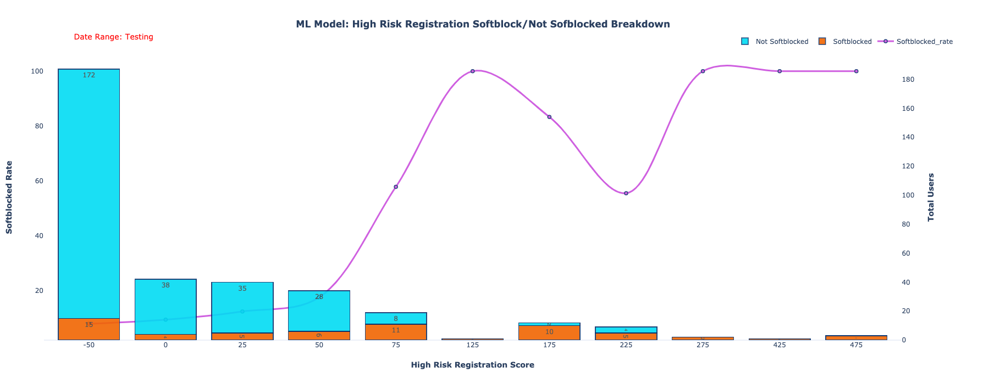

In [259]:
field = 'risk_score_bin'

#evaluate column/feature
da = data_analysis(df=df_final,field=field)

#weird way to sort b/c plotly is dumb
da['risk_score_bin'] = da['risk_score_bin'].astype(int)
da = da.sort_values(by='risk_score_bin',ascending=True)
da['risk_score_bin'] = da['risk_score_bin'].astype(str)

#sort by index manually
# da = da.reindex([16,19,20,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,17,18]) #june

fig = make_subplots(specs=[[{"secondary_y": True}]])
fig.add_trace(go.Scatter(x=da[field]
                         ,y=da['is_softblocked_rate']
#                          ,fill='tozeroy'
                         ,name='Softblocked_rate'
                         ,text=da['is_softblocked_rate']
                         ,line_shape='spline'
                         ,line=dict(width=3, dash='solid')
                         ,textposition="top center"
                         ,marker_color='rgb(201,77,220)'
                         ,marker_line_color='rgb(8,48,107)'
                         ,marker_line_width=1.5
                         ,marker_size=6
                         ,mode='lines+markers'
                         ,opacity=.9)
              ,secondary_y=False)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[1]
                     ,text=da[1]
                     ,textposition="inside"
                     ,name='Softblocked'
                     ,marker_color='rgb(240,100,0)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)

fig.add_trace(go.Bar(x=da[field]
                     ,y=da[0]
                     ,text=da[0]
                     ,textposition="inside"
                     ,name='Not Softblocked'
                     ,marker_color='rgb(0,219,243)'
                     ,marker_line_color='rgb(8,48,107)'
                     ,marker_line_width=1.5
                     ,opacity=0.9)
              ,secondary_y=True)
    
fig.update_layout(
    template='plotly_white'
    ,barmode='stack'
    ,height=700
#     ,title_x=0.5
    ,title='<b>                                                                             ML Model: High Risk Registration Softblock/Not Sofblocked Breakdown</b><br>\
    <span style="font-size: 14;"><span style="color:red;">\
    Date Range: Testing<br>'
)

fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

fig.update_xaxes(
    title_text="<b>High Risk Registration Score"
    ,showgrid=False
    ,rangemode="tozero"
    ,title_standoff=25
)

fig.update_yaxes(
    title_text="<b>Softblocked Rate"
    ,title_standoff=25
#     ,tickformat='%'
    ,secondary_y=False
    ,showgrid=False)

fig.update_yaxes(
    title_text="<b>Total Users"
    ,title_standoff=25
    ,showgrid=False
    ,rangemode="tozero"
    ,secondary_y=True)

da = da.fillna(0)

print('df shape: ', da.shape)

# Test for over 100 score
score1 = 100
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score1]

# print('')
print('Metrics if we Softblock >= Score 100: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/30)
print('false positives per day est.: ', df1[0].sum()/30)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/30)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

# Test for over 200 score
score2 = 200
da['risk_score_bin'] = da['risk_score_bin'].astype('int')
df1 = da[da['risk_score_bin']>=score2]

print('')
print('Metrics if we Softblock >= Score 200: ')
print('total softblocked: ', df1[1].sum())
print('total not softblocked: ', df1[0].sum())
print('total users: ', df1[1].sum() + df1[0].sum())
print('softblocked per day est.: ', df1[1].sum()/30)
print('false positives per day est.: ', df1[0].sum()/30)
print('false positive ratio: ', df1[0].sum() / df1[1].sum())
print('daily impact: ', (df1[1].sum() + df1[0].sum())/30)
print('% softblocked: ', df1[1].sum() / (df1[1].sum() + df1[0].sum()))

da.columns = ['risk_score_bin','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']
display(da)
fig.show()

# Test ML users to lookup

In [253]:
#filter out columns
df1 = df[(df['risk_score_bin'].isin(['-50','0','25']))]
df1 =  df1[['user_id'
            ,'rule_prev_blocked_email_handle','rule_uncommon_domain','rule_disposable_domain','rule_bot_score_bucket','rule_is_emulator' 
            ,'rule_origin','rule_likely_invalid_email','rule_zip','rule_signup_method','rule_registration_hour','rule_email_nums' 
            ,'rule_count_email_nums','rule_state_name','rule_emails_are_bouncing','rule_is_fraud_device_id','rule_is_fraud_ip_address' 
            ,'rule_fraud_ip_reg_hour','rule_state_name_reg_hour','rule_origin_fraud_ip','rule_low_risk_rules_triggered','rule_risky_first_name' 
            ,'rule_fraud_dev_bot_reg_hr','risk_score','risk_score_bin','is_two_names','prev_blocked_email_handle','uncommon_domain','likely_invalid_email' 
            ,'disposable_domain','bot_score_bucket','is_emulator','firewall_bot_score','registration_hour','count_email_nums'
            ,'is_fraud_device_id','emails_are_bouncing' ,'classify_handle_score','classify_handle_score_rule','rule_signup_state_dev_ip_hour'
            ,'is_softblocked_tf']]

#columns removed and to be one hot encoded later
# state_name, zip, origin, email_verified, lang, os, os_type, os_version, device_type, iphone_type, email_domain, top_level_domain, email_nums

#convert dtypes
df1['classify_handle_score'] = df1['classify_handle_score'].astype('float')
df1['registration_hour'] = df1['registration_hour'].astype('int')
df1['firewall_bot_score'] = df1['firewall_bot_score'].astype('float')

print('df1 shape: ', df1.shape)
print('df1 fraud value count: \n', df1.is_softblocked_tf.value_counts())
print('df1 fraud rate: ', round(df1.is_softblocked_tf.value_counts()[1] / (df1.is_softblocked_tf.value_counts()[0] + df1.is_softblocked_tf.value_counts()[1]),2))
df1.head()

df1 shape:  (269, 41)
df1 fraud value count: 
 0    255
1     14
Name: is_softblocked_tf, dtype: int64
df1 fraud rate:  0.05


,user_id,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf
0,124807456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5,0,1.00,14,0,0,0,73.00,0,0,0
1,124807352,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-190,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,32.00,0,0,0
2,124807672,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,15,0,0,0,96.00,1,0,0
3,124807565,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,14,0,0,0,95.00,1,0,0
4,124807497,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-250,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,49.00,0,0,0


In [254]:
#Create Test and Train arrays
#if you add more columns to the dataset
#make sure you adjust the X and y column ranges
X = df1[df1.columns[1:39]].values
y = df1[df1.columns[40]].values

X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.9)

print('X_train shape: \n', X_train.shape)
print('X_test shape: \n', X_test.shape)
print('y_train shape: \n', y_train.shape)
print('y_test shape: \n', y_test.shape)
print('')
print('x_train:', X_train)
print('y_train:', y_train)
print('x_test:', X_test)
print('y_test:', y_test)

X_train shape: 
 (26, 38)
X_test shape: 
 (243, 38)
y_train shape: 
 (26,)
y_test shape: 
 (243,)

x_train: [[0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 -250 '-50' 0 0 0 0 0 80 0
  77.0 15 0 0 0 54.0 0]
 [0 1 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 20 '25' 1 0 1 0 0 40 0 36.0
  15 0 0 0 60.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 -250 '-50' 1 0 0 0 0 80 0
  76.0 14 0 0 0 61.0 0]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 10 '25' 0 0 0 0 0 30 0 29.0
  14 0 0 0 62.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 1 0 1 0 0 0 -175 '-50' 0 0 0 0 0 80 0
  77.0 15 0 0 0 92.0 1]
 [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 0 0 0 0 -65 '-50' 1 0 0 0 0 80 0
  80.0 14 0 0 0 93.0 1]
 [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 1 0 1 0 0 0 -240 '-50' 0 0 0 0 0 80 0
  77.0 15 0 0 0 82.0 0]
 [0 0 0 0 0 1 0 0 1 0 0 0 0 0 0 0 0 0 1 0 0 0 -40 '0' 0 0 0 0 0 50 0 47.0
  15 0 0 0 62.0 0]
 [0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 25 '0' 0 0 0 0 0 35 0 33.0
  14 0 0 0 94.0 1]
 [0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 

In [255]:
#Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred = nb_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['nb_preds'] = nb_pred
df_out = pd.merge(df1,df_pred[['nb_preds']],how = 'left',left_index = True, right_index = True)

#LogisticRegression
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
lr_pred = lr_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['lr_preds'] = lr_pred
df_out = pd.merge(df_out,df_pred[['lr_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
### I've got my predictions now ####
dt_pred = dt_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['dt_preds'] = dt_pred
df_out = pd.merge(df_out,df_pred[['dt_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
### I've got my predictions now ####
rf_pred = rf_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['rf_preds'] = rf_pred
df_out = pd.merge(df_out,df_pred[['rf_preds']],how = 'left',left_index = True, right_index = True)

#Naive Bayes
knn_model = KNeighborsClassifier()
knn_model.fit(X_train, y_train)
### I've got my predictions now ####
knn_pred = knn_model.predict(X_test)
df_pred = pd.DataFrame()
df_pred['knn_preds'] = knn_pred
df_out = pd.merge(df_out,df_pred[['knn_preds']],how = 'left',left_index = True, right_index = True)

df_out.head()

,user_id,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,is_softblocked_tf,nb_preds,lr_preds,dt_preds,rf_preds,knn_preds
0,124807456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5,0,1.00,14,0,0,0,73.00,0,0,0,1.00,1.00,0.00,0.00,0.00
1,124807352,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-190,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,32.00,0,0,0,0.00,0.00,0.00,0.00,0.00
2,124807672,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,15,0,0,0,96.00,1,0,0,1.00,0.00,0.00,0.00,0.00
3,124807565,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,14,0,0,0,95.00,1,0,0,0.00,0.00,0.00,0.00,0.00
4,124807497,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-250,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,49.00,0,0,0,0.00,0.00,0.00,0.00,0.00


In [256]:
#create column for ml prediction scores
def ml_pred_score(row):
    if row['rf_preds'] == 1:
        return '1'
    elif row['is_softblocked_tf'] == 1:
        return '1'
    else:
        return '0'

df_out['ml_pred_score'] = df_out.apply(lambda row: ml_pred_score(row), axis = 1)

#replace is_softblocked column with machine learning is softblocked column
df_out.drop('is_softblocked_tf', axis=1, inplace=True)
df_out=df_out.rename(columns = {'ml_pred_score':'is_softblocked_tf'})

df_out.head()

,user_id,rule_prev_blocked_email_handle,rule_uncommon_domain,rule_disposable_domain,rule_bot_score_bucket,rule_is_emulator,rule_origin,rule_likely_invalid_email,rule_zip,rule_signup_method,rule_registration_hour,rule_email_nums,rule_count_email_nums,rule_state_name,rule_emails_are_bouncing,rule_is_fraud_device_id,rule_is_fraud_ip_address,rule_fraud_ip_reg_hour,rule_state_name_reg_hour,rule_origin_fraud_ip,rule_low_risk_rules_triggered,rule_risky_first_name,rule_fraud_dev_bot_reg_hr,risk_score,risk_score_bin,is_two_names,prev_blocked_email_handle,uncommon_domain,likely_invalid_email,disposable_domain,bot_score_bucket,is_emulator,firewall_bot_score,registration_hour,count_email_nums,is_fraud_device_id,emails_are_bouncing,classify_handle_score,classify_handle_score_rule,rule_signup_state_dev_ip_hour,nb_preds,lr_preds,dt_preds,rf_preds,knn_preds,is_softblocked_tf
0,124807456,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,5,0,1.00,14,0,0,0,73.00,0,0,1.00,1.00,0.00,0.00,0.00,0
1,124807352,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,-190,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,32.00,0,0,0.00,0.00,0.00,0.00,0.00,0
2,124807672,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,15,0,0,0,96.00,1,0,1.00,0.00,0.00,0.00,0.00,0
3,124807565,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-175,-50,0,0,0,0,0,80,0,77.00,14,0,0,0,95.00,1,0,0.00,0.00,0.00,0.00,0.00,0
4,124807497,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,-250,-50,1,0,0,0,0,75,0,75.00,14,0,0,0,49.00,0,0,0.00,0.00,0.00,0.00,0.00,0


In [257]:
#show the actual user ids after machine learning
#original df
df_final = df[~df['risk_score_bin'].isin(['-50','0','25'])]
df_final = df_final[['user_id','is_softblocked_tf','risk_score_bin']]
print('df_final shape: ', df_final.shape)

#ml df
df_ml = df_out[['user_id','is_softblocked_tf','risk_score_bin']]
m = df_ml['is_softblocked_tf'] == 1
df_ml.loc[m, 'risk_score_bin'] = df_ml.loc[m, 'risk_score_bin'] + 300
print('df_ml shape: ', df_ml.shape)

#concat dfs
#replaces the low scores from original df with ml df
#as ml df was only run on low scored users
df_final = pd.concat([df_final,df_ml], ignore_index=True)
print('df_final shape: ', df_final.shape)

#convert 0s and dtypes
df_final['is_softblocked_tf'] = df_final['is_softblocked_tf'].astype('int')

df_final.head()

df_final shape:  (81, 3)
df_ml shape:  (269, 3)
df_final shape:  (350, 3)


,user_id,is_softblocked_tf,risk_score_bin
0,124807581,0,50
1,124807458,0,75
2,124807605,0,50
3,124807683,0,225
4,124807525,0,225


In [263]:
#filter out only bad users >= 200
df_final = df_final[~df_final['risk_score_bin'].isin(['-50','-25','0','25','50','75','100','125','150','175'])]
print('df_final shape: ', df_final.shape)
df_final.head(20)

df_final shape:  (15, 3)


,user_id,is_softblocked_tf,risk_score_bin
3,124807683,0,225
4,124807525,0,225
8,124807328,1,225
10,124807367,1,225
17,124807446,1,225
20,124807567,0,225
33,124807322,1,225
34,124807408,1,275
36,124807441,0,225
47,124807542,1,475


# Tests

# IP checker

In [29]:
#ip checker function
def ip_checker(text):
    import pydnsbl
    import aiodns

    #issue with running a loop - solves it
    import nest_asyncio
    nest_asyncio.apply()

    ip_checker = pydnsbl.DNSBLIpChecker()
    
    return ip_checker.check(text).blacklisted

In [62]:
ip_checker('207.233.73.155')

False

In [37]:
#full attempt at ip checkers
#takes too long and ip address is null
start_time = datetime.now()

df1['ip_checker'] = df1.apply(lambda row: ip_checker(row['ip_address']), axis = 1)

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))

df1.head()

NameError: name 'df1' is not defined

# Gibberish Detecting Functions

In [61]:
"""
Gibberish Classifier
Author: ProgramFOX
Licensed under CPOL v1.02: http://www.codeproject.com/info/cpol10.aspx
"""

# from __future__ import division
import re
import math

def split_in_chunks(text, chunk_size):
    chunks = []
    for i in range(0, len(text), chunk_size):
        chunks.append(text[i:i + chunk_size])
    if len(chunks) > 1 and len(chunks[-1]) < 10:
        chunks[-2] += chunks[-1]
        chunks.pop(-1)
    return chunks


def unique_chars_per_chunk_percentage(text, chunk_size):
    chunks = split_in_chunks(text, chunk_size)
    unique_chars_percentages = []
    for chunk in chunks:
        total = len(chunk)
        unique = len(set(chunk))
        unique_chars_percentages.append(unique / total)
    return sum(unique_chars_percentages) / len(unique_chars_percentages) * 100


def vowels_percentage(text):
    vowels = 0
    total = 0
    for c in text:
        if not c.isalpha():
            continue
        total += 1
        if c in "aeiouAEIOU":
            vowels += 1
    if total != 0:
        return vowels / total * 100
    else:
        return 0


def word_to_char_ratio(text):
    chars = len(text)
    words = len([x for x in re.split(r"[\W_]", text) if x.strip() != ""])
    return words / chars * 100


def deviation_score(percentage, lower_bound, upper_bound):
    if percentage < lower_bound:
        return math.log(lower_bound - percentage, lower_bound) * 100
    elif percentage > upper_bound:
        return math.log(percentage - upper_bound, 100 - upper_bound) * 100
    else:
        return 0


def classify(text):
    if text is None or len(text) == 0:
        return 0.0
    ucpcp = unique_chars_per_chunk_percentage(text, 35)
    vp = vowels_percentage(text)
    wtcr = word_to_char_ratio(text)

    ucpcp_dev = max(deviation_score(ucpcp, 45, 50), 1)
    vp_dev = max(deviation_score(vp, 35, 45), 1)
    wtcr_dev = max(deviation_score(wtcr, 15, 20), 1)

    return max((math.log10(ucpcp_dev) + math.log10(vp_dev) +
                math.log10(wtcr_dev)) / 6 * 100, 1)

In [ ]:
# provide an explicit schema for columns that need it
# load_config = gcp_client.LoadJobConfig()
# load_config.schema = SCHEMA

job_config = bigquery.LoadJobConfig(
    schema=[
        bigquery.SchemaField(name="rule_prev_blocked_email_handle", field_type="int64"),
        bigquery.SchemaField(name="rule_uncommon_domain", field_type="int64"),
        bigquery.SchemaField(name="rule_disposable_domain", field_type="int64"),
        bigquery.SchemaField(name="rule_bot_score_bucket", field_type="int64"),
        bigquery.SchemaField(name="rule_is_emulator", field_type="int64"),
        bigquery.SchemaField(name="rule_origin", field_type="int64"),
        bigquery.SchemaField(name="rule_likely_invalid_email", field_type="int64"),
        bigquery.SchemaField(name="rule_zip", field_type="int64"),
        bigquery.SchemaField(name="rule_signup_method", field_type="int64"),
        bigquery.SchemaField(name="rule_registration_hour", field_type="int64"),
        bigquery.SchemaField(name="rule_email_nums", field_type="int64"),
        bigquery.SchemaField(name="rule_count_email_nums", field_type="int64"),
        bigquery.SchemaField(name="rule_state_name", field_type="int64"),
        bigquery.SchemaField(name="rule_emails_are_bouncing", field_type="int64"),
        bigquery.SchemaField(name="rule_is_fraud_device_id", field_type="int64"),
        bigquery.SchemaField(name="rule_is_fraud_ip_address", field_type="int64"),
        bigquery.SchemaField(name="rule_fraud_ip_reg_hour", field_type="int64"),
        bigquery.SchemaField(name="rule_state_name_reg_hour", field_type="int64"),
        bigquery.SchemaField(name="rule_origin_fraud_ip", field_type="int64"),
        bigquery.SchemaField(name="rule_low_risk_rules_triggered", field_type="int64"),
        bigquery.SchemaField(name="rule_risky_first_name", field_type="int64"),
        bigquery.SchemaField(name="rule_fraud_dev_bot_reg_hr", field_type="int64"),
        bigquery.SchemaField(name="risk_score_bin", field_type="int64"),
        bigquery.SchemaField(name="risk_score", field_type="int64"),
        bigquery.SchemaField(name="risk_rules_triggered", field_type="object"),
        bigquery.SchemaField(name="score_bin", field_type="object"),
        bigquery.SchemaField(name="rules_triggered", field_type="object"),
        bigquery.SchemaField(name="score", field_type="int64"),
        bigquery.SchemaField(name="ua_part1", field_type="object"),
        bigquery.SchemaField(name="is_two_names", field_type="int64"),
        bigquery.SchemaField(name="prev_blocked_email_handle", field_type="int64"),
        bigquery.SchemaField(name="uncommon_domain", field_type="int64"),
        bigquery.SchemaField(name="likely_invalid_email", field_type="int64"),
        bigquery.SchemaField(name="disposable_domain", field_type="int64"),
        bigquery.SchemaField(name="bot_score_bucket", field_type="int64"),
        bigquery.SchemaField(name="is_emulator", field_type="int64"),
        bigquery.SchemaField(name="length_email_handle_bin", field_type="int64"),
        bigquery.SchemaField(name="first_name_spec_char", field_type="int64"),
        bigquery.SchemaField(name="user_id", field_type="int64"),
        bigquery.SchemaField(name="registration_day", field_type="object"),
        bigquery.SchemaField(name="registration_week", field_type="object"),
        bigquery.SchemaField(name="user_agent", field_type="object"),
        bigquery.SchemaField(name="state_name", field_type="object"),
        bigquery.SchemaField(name="zip", field_type="object"),
        bigquery.SchemaField(name="origin", field_type="object"),
        bigquery.SchemaField(name="ip_address", field_type="object"),
        bigquery.SchemaField(name="firewall_bot_score", field_type="object"),
        bigquery.SchemaField(name="device_id", field_type="object"),
        bigquery.SchemaField(name="first_name", field_type="object"),
        bigquery.SchemaField(name="signup_method", field_type="object"),
        bigquery.SchemaField(name="device_is_blacklisted", field_type="object"),
        bigquery.SchemaField(name="email_verified", field_type="bool"),
        bigquery.SchemaField(name="email", field_type="object"),
        bigquery.SchemaField(name="app_version", field_type="object"),
        bigquery.SchemaField(name="app_build", field_type="object"),
        bigquery.SchemaField(name="device_type", field_type="object"),
        bigquery.SchemaField(name="iphone_type", field_type="object"),
        bigquery.SchemaField(name="os", field_type="object"),
        bigquery.SchemaField(name="os_type", field_type="object"),
        bigquery.SchemaField(name="os_version", field_type="object"),
        bigquery.SchemaField(name="lang", field_type="object"),
        bigquery.SchemaField(name="registration_date", field_type="object"),
        bigquery.SchemaField(name="registration_hour", field_type="object"),
        bigquery.SchemaField(name="length_email_handle", field_type="object"),
        bigquery.SchemaField(name="email_handle", field_type="object"),
        bigquery.SchemaField(name="email_domain", field_type="object"),
        bigquery.SchemaField(name="top_level_domain", field_type="object"),
        bigquery.SchemaField(name="email_nums", field_type="object"),
        bigquery.SchemaField(name="count_email_nums", field_type="int64"),
        bigquery.SchemaField(name="risky_origin", field_type="int64"),
        bigquery.SchemaField(name="sb_email_handle", field_type="object"),
        bigquery.SchemaField(name="added_profile_pic", field_type="int64"),
        bigquery.SchemaField(name="disposable_domain_test", field_type="int64"),
        bigquery.SchemaField(name="is_fraud_ip_address", field_type="int64"),
        bigquery.SchemaField(name="is_fraud_device_id", field_type="int64"),
        bigquery.SchemaField(name="emails_are_bouncing", field_type="int64"),
        bigquery.SchemaField(name="is_softblocked", field_type="object"),
        bigquery.SchemaField(name="is_softblocked_tf", field_type="int64"),
        bigquery.SchemaField(name="final_score", field_type="int64"),
        bigquery.SchemaField(name="classify_email_score", field_type="float64"),
        bigquery.SchemaField(name="classify_handle_score", field_type="float64"),
        bigquery.SchemaField(name="classify_domain_score", field_type="float64"),
        bigquery.SchemaField(name="strangeness_email_score", field_type="float64"),
        bigquery.SchemaField(name="strangeness_handle_score", field_type="float64"),
        bigquery.SchemaField(name="strangeness_domain_score", field_type="float64"),
        bigquery.SchemaField(name="classify_handle_score_rule", field_type="int64"),
        bigquery.SchemaField(name="rule_signup_state_dev_ip_hour", field_type="int64"),
        bigquery.SchemaField(name="classify_handle_score_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="prev_blocked_email_handle_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="uncommon_domain_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="disposable_domain_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="bot_score_bucket_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="is_emulator_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="origin_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="likely_invalid_email_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="zip_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="signup_method_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="registration_hour_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="email_nums_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="count_email_nums_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="state_name_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="emails_are_bouncing_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="is_fraud_device_id_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="is_fraud_ip_address_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="fraud_ip_reg_hour_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="state_name_reg_hour_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="origin_fraud_ip_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="low_risk_rules_triggered_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="risky_first_name_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="rule_signup_state_dev_ip_hour_sb_rate_pct_chg", field_type="float64"),
        bigquery.SchemaField(name="rule_fraud_dev_bot_reg_hr_sb_rate_pct_chg", field_type="float64")
    ]
)

# client.load_table_from_dataframe(dfr, table_ref, job_config=job_config).result()

In [273]:
classify('gmail')

33.33333333333333

In [62]:
import nltk
# nltk.download('brown')

from nltk.corpus import brown
from collections import Counter
import numpy as np

text = '\n  '.join([' '.join([w for w in s]) for s in brown.sents()])

unigrams = Counter(text)
bigrams = Counter(text[i:(i+2)] for i in range(len(text)-2))
trigrams = Counter(text[i:(i+3)] for i in range(len(text)-3))

weights = [0.001, 0.01, 0.989]

def strangeness(text):
    r = 0
    text = '  ' + text + '\n'
    for i in range(2, len(text)):
        char = text[i]
        context1 = text[(i-1):i]
        context2 = text[(i-2):i]
        num = unigrams[char] * weights[0] + bigrams[context1+char] * weights[1] + trigrams[context2+char] * weights[2] 
        den = sum(unigrams.values()) * weights[0] + unigrams[context1] * weights[1] + bigrams[context2] * weights[2]
        r -= np.log(num / den)
    return r / (len(text) - 2)

In [12]:
strangeness('djdjdjdjd')

5.398030751771265

In [ ]:
#show difference in 1/0s for test df and mldf
test_df = df[df['risk_score_bin'].isin(['-50','0','25'])]
print('test_df: \n', test_df.risk_score_bin.value_counts())
print('ml_df: \n', ml_df.risk_score_bin.value_counts())

display('test_df: ',test_df.groupby(['risk_score_bin','is_softblocked_tf'])['user_id'].agg('count').reset_index())
display('ml_df: ', ml_df.groupby(['risk_score_bin','is_softblocked_tf'])['user_id'].agg('count').reset_index())

In [ ]:
import isthisipbad as bad_ip
import pydnsbl

# ip_checker = pydnsbl.DNSBLIpChecker()

# with open('ips.txt') as file:
#     ips = file.read().splitlines()
    
#     for ip in ips:
#         if ip_checker.check(ip).blacklisted:
#             print(f"{ip} blacklisted")

ip_checker.check('207.233.73.155').blacklisted

ip_checker = pydnsbl.DNSBLIpChecker()
ip_checker.check('68.128.212.240')
# <DNSBLResult: 8.8.8.8  (0/52)>
# ip_checker.check('68.128.212.240')
# <DNSBLResult: 68.128.212.240 [BLACKLISTED] (6/52)>

In [ ]:
#tried to use the fraud function to get the rule sb rates but it wasn't a good idea
#couldn't account for week over week changes

# if agg_df['weekly_pct_change'] > agg_df['prev_weekly_pct_change']:
#     return 'greater'
# elif agg_df['weekly_pct_change'] < agg_df['prev_weekly_pct_change']:
#     return 'less'
# else:
#     return 'equal'

# agg_df.head()

def data_analysis(df, field, granularity = 1,xlim_sb = None, ylim_sb = None, xlim_total = None, ylim_total = None, figsize = (26,6)
                  ,minrate=None,maxrate=None,maxcount=None):
    if(granularity == 1):
        field_table = pd.crosstab(df[field],df.is_softblocked_tf)
    else:
        field_table = pd.crosstab(eval('(df[field]'+'/'+str(granularity) +').astype(int)*' + str(granularity)),df.is_softblocked_tf)
    field_table = field_table.reset_index(0)
    field_table = field_table.rename_axis('', axis = 1)
    field_table['is_softblocked_rate'] = field_table[1]/(field_table[0] + field_table[1])*100
    field_table['total_count'] = field_table[0] + field_table[1]
    field_table['percent_of_total'] = field_table['total_count']/sum(field_table['total_count']) * 100
    if minrate:
        field_table = field_table[field_table['is_softblocked_rate'] >= minrate]
    if maxrate:
        field_table = field_table[field_table['is_softblocked_rate'] <= maxrate]
    if maxcount:
        field_table = field_table[field_table['total_count'] >= maxcount]
    field_table = field_table.sort_values(by=field,ascending=True)

    return field_table

da = data_analysis(df=rule_df,field='classify_handle_score_rule')
da.columns = ['classify_handle_score_rule','not_softblocked','softblocked','is_softblocked_rate','total_count','percent_of_total']

fig = px.line(agg_df
             ,x='registration_week'
             ,y='metric_value'
             ,color='rule'
             ,text='metric_value'
             ,template='plotly_white'
             ,height=400
             ,line_shape='spline'
            )
fig.show()

fig = px.line(agg_df
             ,x='registration_week'
             ,y='weekly_pct_change'
             ,color='rule'
             ,log_y=True
#              ,text='weekly_pct_change'
             ,template='plotly_white'
             ,height=400
             ,line_shape='spline'
            )
fig.show()

In [ ]:
#figure this out max

# def classify_handle_score_calc(row):
#     if row['risk_rules_triggered'].str.contains('classify_handle_score'):
#         return '1'
#     else:
#         return '0'

# df['classify_handle_score_rule'] = df.apply(lambda row: classify_handle_score_calc(row), axis = 1)
# df.head()

# df['classify_handle_score_rule'] = pd.np.where(df['risk_rules_triggered'].str.contains('classify_handle_score'),"1",

# def classify_handle_score_calc(df):
#     if df['risk_rules_triggered'].str.contains('classify_handle_score'):
#         return '1'
#     else:
#         return '0'
# df['classify_handle_score_rule'] = df.apply(classify_handle_score_calc, axis=1)

# df['classify_handle_score_rule'] = [row for row in df['risk_rules_triggered'] if "classify_handle_score" in str(row)]

# df['classify_handle_score_rule'].apply(lambda x : '1' if df['risk_rules_triggered'].str.contains('classify_handle_score') in x else '0')
# if "BEAR" in x else ""

# df["classify_handle_score_rule"] = df["risk_rules_triggered"].map(lambda x: 1 if "classify_handle_score" in str(x) else 0)
rule_df = df[['registration_week','is_softblocked','is_softblocked_tf','classify_handle_score_rule','prev_blocked_email_handle','uncommon_domain','disposable_domain','bot_score_bucket','is_emulator','origin','likely_invalid_email','zip','signup_method','registration_hour','email_nums','count_email_nums','state_name','emails_are_bouncing','is_fraud_device_id','is_fraud_ip_address','fraud_ip_reg_hour','state_name_reg_hour','origin_fraud_ip','low_risk_rules_triggered']]
print(rule_df.shape)
rule_df.head()

# Testing Tables

In [80]:
#boyan's login table
login_sql = """
select
    login.header.timestamp
    ,login.header.user_id
    ,login.header.origin
    ,login.header.device_id
    ,login.header.firewall_bot_score
    ,login.login_source
    ,login.header.user_agent
    ,SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],' ')[SAFE_OFFSET(0)] as app_version
    ,SPLIT(SPLIT(login.header.user_agent, 'build: ')[SAFE_OFFSET(1)],';')[SAFE_OFFSET(0)] as app_build
    ,SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(1)] as device_type
    ,REPLACE(SPLIT(SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(1)],'iPhone')[SAFE_OFFSET(1)],',','.') as iphone_type
    ,SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)] as os
    ,SPLIT(SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)],' ')[SAFE_OFFSET(0)] as os_type
    ,SPLIT(SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(2)],' ')[SAFE_OFFSET(1)] as os_version
    ,SPLIT(SPLIT(SPLIT(login.header.user_agent, 'OfferUp/')[SAFE_OFFSET(1)],'; ')[SAFE_OFFSET(3)],')')[SAFE_OFFSET(0)] as lang
    ,(case when login.ou_captcha_session_id is null then 0 else 1 end) as captcha_exists
    ,(case when ver_email.email_verified_time < login.header.timestamp then 1 else 0 end) as email_verified
    ,(case when ver_phone.phone_verified_time < login.header.timestamp then 1 else 0 end) as phone_verified
    ,(case when ver_truyou.truyou_verified_time < login.header.timestamp then 1 else 0 end) as truyou_verified
    ,rank() over (partition by login.header.user_id order by login.event_timestamp) as user_rank
    ,rank() over (partition by login.header.device_id, login.header.user_id order by login.header.user_id, login.event_timestamp) as device_user_rank
    --,rank() over (order by login.event_timestamp) as device_rank
    ,sb.first_softblock_time
    ,sanit.first_sanitization_time
    ,dev.device_sanitization_decision
    ,(case when sb.first_softblock_time is null and sanit.first_sanitization_time is null then 0 else 1 end) as bad_login
from `prod-ods-6a09.streamed_event.user_logged_in_logged_out_event` login
left join (
    select
        user_id
        ,max(created) as email_verified_time
    from `prod-ods-6a09.postgres_legacy.account_userflag`
    where
        flag_type = 4
        and active = true
    group by
        1
    ) ver_email on login.header.user_id = ver_email.user_id
left join (
    select
        user_id
        ,max(created) as phone_verified_time
    from `prod-ods-6a09.postgres_legacy.account_userflag`
    where
        flag_type = 10
        and active = true
    group by
        1
    ) ver_phone on login.header.user_id = ver_phone.user_id
left join (
    select
        user_id
        ,max(created) as truyou_verified_time
    from `prod-ods-6a09.postgres_legacy.account_userflag`
    where
        flag_type = 11
        and active = true
    group by
        1
        ) ver_truyou on login.header.user_id = ver_truyou.user_id
left join (
    select 
        user_id
        ,login_timestamp
        ,min(sb_timestamp) as first_softblock_time
    from (
        select
            a.header.user_id
            ,a.header.timestamp as login_timestamp
            ,b.header.timestamp as sb_timestamp
        from `prod-ods-6a09.streamed_event.user_logged_in_logged_out_event` a
        join `prod-ods-6a09.streamed_event.user_softblocked_unsoftblocked_event` b on a.header.user_id = b.header.user_id
            and b.header.timestamp > a.header.timestamp
            and b.header.timestamp < TIMESTAMP_ADD(a.header.timestamp, INTERVAL 168 hour)
        where 
            USER_SOFTBLOCK_CHANGE_TYPE = 'softblocked'
            and a.event_timestamp > '2018-06-30'
            and b.classification like '%ATO%'
            and b.event_timestamp > '2018-06-30'
        )
    group by
        1,2
    ) sb on login.header.user_id = sb.user_id
        and login.header.timestamp = sb.login_timestamp
left join (
    select
        user_id
        ,login_timestamp
        ,min(sanitization_timestamp) as first_sanitization_time
    from (
    select
        a.header.user_id
        ,a.header.timestamp as login_timestamp
        ,b.header.timestamp as sanitization_timestamp
    from `prod-ods-6a09.streamed_event.user_logged_in_logged_out_event` a
    join `prod-ods-6a09.streamed_event.ato_sanitization_completed_event` b on cast(a.header.user_id as string) = b.account_id 
        and b.header.timestamp > a.header.timestamp 
        and b.header.timestamp < TIMESTAMP_ADD(a.header.timestamp, INTERVAL 168 hour)
        and a.event_timestamp > '2018-06-30'
        and b.event_timestamp > '2018-06-30'
        )
    group by
        1,2
    ) sanit on login.header.user_id = sanit.user_id
        and login.header.timestamp = sanit.login_timestamp
left join (
    select
        a.event_timestamp
        ,a.device_id
        ,a.device_sanitization_decision
    from `prod-ods-6a09.streamed_event.ato_sanitization_received_event` a
    join (
        select
            device_id
            ,max(event_timestamp) as max_ts
        from `prod-ods-6a09.streamed_event.ato_sanitization_received_event`
        where
            event_timestamp > '2018-06-30'
        group by
            1
        ) b on a.event_timestamp = b.max_ts 
            and a.device_id = b.device_id
    where
        a.event_timestamp > '2018-06-30'
    ) dev on login.header.timestamp < dev.event_timestamp
        and login.header.device_id = dev.device_id
where
    login.event_timestamp > '2018-06-30'
    and login.actor_type = 'user'
    and login.action = 'login'
    and login.header.user_agent not like '%Datadog%'
order by
    2, 1
"""

Query Duration: 0:20:14.278283
df1 shape:  (7, 2)
df1 size in gb:  0.0 gb
  create_date  count
0  2021-05-01  13079
1  2021-05-02  14023
2  2021-05-03   4925
3  2021-05-04    696
4  2021-05-05    525


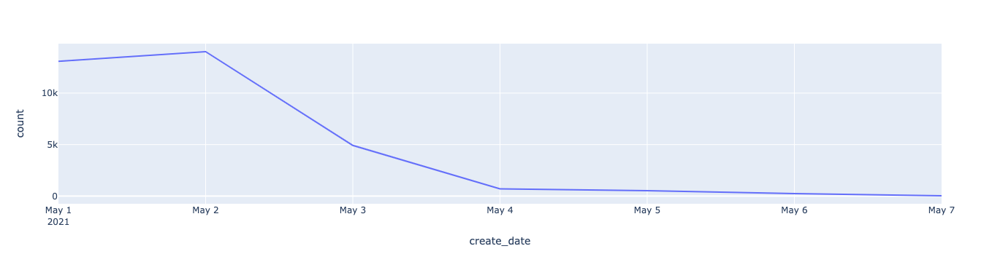

In [151]:
#testing michaels account user source table to get isp

query = """
select
    date(date_trunc(z.au_created, day)) as create_date
    ,count(*) as count
from (
    select
        user_id
        ,a.created au_created
        ,u.event_timestamp
        ,case when a.created != u.event_timestamp then 1 else 0 end as is_match
    from `prod-ods-6a09.streamed_event.user_registered_event` u
    left join `prod-ods-6a09.postgres_legacy.account_usersource` a on u.header.user_id = a.user_id
    where
        a.created between '2021-05-01' and '2021-06-17'
        and u.event_timestamp between '2021-05-01' and '2021-06-17'
    ) z
group by
    1
order by 
    1
"""

df1 = gcp_client.query(query).to_dataframe()

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))
print('df1 shape: ', df1.shape)
# print('unique users: ', df1.user_id.nunique())
print('df1 size in gb: ', round(df1.memory_usage(deep=True).sum() / 1000000000,2),'gb')

print(df1.head())

fig=px.line(df1
            ,x='create_date'
            ,y='count')
fig.show()

# df1.is_match.value_counts()

In [ ]:
# from __future__ import unicode_literals
# from .clients import (
#     SPAMHAUS_DBL, SPAMHAUS_ZEN, SURBL_MULTI, HpHosts, GoogleSafeBrowsing
# )
# from .host_collections import HostCollection, SortedHostCollection
# from .composites import URLTesterChain, GeneralizedURLTester

from spam_lists import SPAMHAUS_DBL
'google.com' in SPAMHAUS_DBL

urls_to_test = (
'http://google.com',
'http://wikipedia.org',
'http://dbltest.com'
)
SPAMHAUS_DBL.any_match(urls_to_test)

In [ ]:
import dns.resolver

zen_return_codes = {'127.0.1.2': 'Spam domain',
                    '127.0.1.4': 'Phishing domain',
                    '127.0.1.5': 'Malware domain',
                    '127.0.1.6': 'Botnet C&C domain',
                    '127.0.1.102': 'Abused legit spam',
                    '127.0.1.103': 'Abused spammed redirector domain',
                    '127.0.1.104': 'Abused legit phish',
                    '127.0.1.105': 'Abused legit malware',
                    '127.0.1.106': 'Abused legit botnet C&C',
                    '127.0.1.255': 'IP queries prohibited!',
                    '127.0.0.2': 'Static UBE sources, verified spam services',
                    '127.0.0.3': 'Static UBE sources, verified spam services',
                    '127.0.0.4': 'Illegal 3rd party exploits, including'
                                  ' proxies, worms and trojan exploits',
                    '127.0.0.5': 'Illegal 3rd party exploits, including'
                                  ' proxies, worms and trojan exploits',
                    '127.0.0.6': 'Illegal 3rd party exploits, including'
                                  ' proxies, worms and trojan exploits',
                    '127.0.0.7': 'Illegal 3rd party exploits, including'
                                  ' proxies, worms and trojan exploits',
                    '127.0.0.10': 'IP ranges which should not be delivering'
                                   ' unauthenticated SMTP email',
                    '127.0.0.11': 'IP ranges which should not be delivering'
                                   ' unauthenticated SMTP email'
                    }

zen_return_codes_cif = {'127.0.1.2': 'Spam',
                    '127.0.1.4': 'Phishing',
                    '127.0.1.5': 'Malware',
                    '127.0.1.6': 'Botnet',
                    '127.0.1.102': 'Spam',
                    '127.0.1.103': 'Spam',
                    '127.0.1.104': 'Phishing',
                    '127.0.1.105': 'Malware',
                    '127.0.1.106': 'Botnet',
                    '127.0.1.255': 'Unknown!',
                    '127.0.0.2': 'Spam',
                    '127.0.0.3': 'Spam',
                    '127.0.0.4': 'Exploit',
                    '127.0.0.5': 'Exploit',
                    '127.0.0.6': 'Exploit',
                    '127.0.0.7': 'Exploit',
                    '127.0.0.10': 'Dynamic IP',
                    '127.0.0.11': 'Dynamic IP'
                    }

class SpamhausChecker:

    sp_response = {'status': '0',
                   'response_code': '',
                   'url': ''}

    @staticmethod
    def _reset_response(self):
        self.sp_response = {'status': '0',
                            'response_code': '',
                            'url': ''}

    def check_status(self, ip_address):
        self._reset_response(self)
        sp_resolver = dns.resolver.Resolver()
        #sp_resolver.nameservers = ['8.8.8.8']

        try:
            _r_name = dns.reversename.from_address(ip_address)
            _r_name = str(_r_name).replace("in-addr.arpa.", "zen.spamhaus.org.")
            answers = sp_resolver.query(_r_name)
            for rdata in answers:
                _url = 'http://www.spamhaus.org/query/bl?ip='+ip_address
                self.sp_response = {'status': '1',
                                    'response_code':
                                    zen_return_codes[rdata.address],
                                    'assessment':
                                    zen_return_codes_cif[rdata.address],
                                    'url': _url}
        except Exception:
            pass
        return self.sp_response

if __name__ == "__main__":
    sh = SpamhausChecker()
    response = sh.check_status("127.0.1.255")
    print(response)

In [ ]:
df['gibberish_handle_score_2'] = round(df.apply(lambda row: classify(row['email_domain']), axis = 1),0)

t1 = df.email_handle
for t in t1:
    print('{:20} -> {:9.5}'.format(t, strangeness(t)))

In [ ]:
#fraud model
start_time = datetime.now()

query = """
select *
from `trust-and-safety-267515.materialized_views.high_risk_registration`
"""

df = gcp_client.query(query).to_dataframe()
df = df.fillna(value=np.nan)
df = df.fillna('0')

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))
print('df shape: ', df.shape)

df.head()

In [93]:
#fraud rate function for pattern matching
def fraud_rate(df, agg, cols=None, threshold=None, limit=None, days=None):
    if isinstance(cols, str):
        groupcols = [cols]
    elif cols is None:
        groupcols = [] 
    else:
        try:
            groupcols = list(cols)
        except:
            raise TypeError('Unable to convert cols to a list.')
    fraudcols = groupcols + ['is_softblocked']
    cnts = df.groupby(fraudcols).agg('nunique')
    if groupcols:
        wide = cnts.unstack('is_softblocked').fillna(0)
    else:
        wide = cnts.to_frame().stack(level=0).unstack('softblocked').fillna(0)
    wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))
    if threshold:
        wide = wide.loc[wide.not_softblocked.lt(threshold)]
    wide = wide.sort_values('softblocked_rate', ascending=False)
    if limit:
        wide = wide.head(n=limit)
    wide = wide.assign(fpr=wide.not_softblocked / wide.softblocked)
    if days:
        wide = wide.assign(impact = (wide.not_softblocked + wide.softblocked) / days)
    return wide

In [113]:
cols = ['count_email_nums','disposable_domain','prev_blocked_email_handle','is_emulator']

fraud_rate_df = fraud_rate(df
                           ,'user_id'
                           ,cols
                           ,threshold=5
                           ,days=30)

# print('df shape: ', fraud_rate_df.shape)
# print('total softblocked: ', fraud_rate_df.softblocked.sum())
# print('totla not softblocked: ', fraud_rate_df.not_softblocked.sum())
fraud_rate_df.head(100)

AttributeError: 'DataFrame' object has no attribute 'fraud'

In [ ]:
def fraud_rate(df, agg, cols=None, threshold=None, limit=None, days=None):
    if isinstance(cols, str):
        groupcols = [cols]
    elif cols is None:
        groupcols = [] 
    else:
        try:
            groupcols = list(cols)
        except:
            raise TypeError('Unable to convert cols to a list.')
    fraudcols = groupcols + ['softblocked']
    cnts = df.groupby(fraudcols)[agg].nunique()
    if groupcols:
        wide = cnts.unstack('softblocked').fillna(0)
    else:
        wide = cnts.to_frame().stack(level=0).unstack('softblocked').fillna(0)
    wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))
    if threshold:
        wide = wide.loc[wide.not_softblocked.gt(threshold)]
    wide = wide.sort_values('softblocked_rate', ascending=False)
    if limit:
        wide = wide.head(n=limit)
    wide = wide.assign(fpr=wide.not_softblocked / wide.softblocked)
    if days:
        wide = wide.assign(impact = (wide.not_softblocked + wide.softblocked) / days)
    return wide

In [ ]:
# df.assign(softblocked_rate = df[df['is_softblocked'] == 'softblocked']['is_softblocked'] / (df[df['is_softblocked'] == 'softblocked' + df['is_softblocked'] == 'not_softblocked']['is_softblocked']))
cols = ['count_email_nums','risky_domain','origin','registration_hour','disposable_domain','prev_blocked_email_handle','is_emulator']

fraudcols = cols + ['is_softblocked']
cnts = df.groupby(fraudcols).agg('nunique')
if cols:
    wide = cnts.unstack('is_softblocked').fillna(0)
else:
    wide = cnts.to_frame().stack(level=0).unstack('softblocked').fillna(0)
# wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))

wide.head()

In [143]:
cols = ['count_email_nums','risky_domain','origin','registration_hour','disposable_domain','prev_blocked_email_handle','is_emulator']
fraudcols = cols + ['is_softblocked']

cnts = df.groupby(fraudcols).agg('nunique')
# wide = cnts.unstack('is_softblocked').fillna(0)
wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))
wide

AttributeError: 'DataFrame' object has no attribute 'softblocked'

In [ ]:
#fraud rate function for pattern matching
def fraud_rate(df, agg, cols=None, threshold=None, limit=None, days=None):
    if isinstance(cols, str):
        groupcols = [cols]
    elif cols is None:
        groupcols = [] 
    else:
        try:
            groupcols = list(cols)
        except:
            raise TypeError('Unable to convert cols to a list.')
    fraudcols = groupcols + ['is_softblocked']
    cnts = df.groupby(fraudcols).agg('nunique')
    if groupcols:
        wide = cnts.unstack('is_softblocked').fillna(0)
    else:
        wide = cnts.to_frame().stack(level=0).unstack('softblocked').fillna(0)
    wide = wide.assign(softblocked_rate = wide.softblocked / (wide.softblocked + wide.not_softblocked))
    if threshold:
        wide = wide.loc[wide.not_softblocked.lt(threshold)]
    wide = wide.sort_values('softblocked_rate', ascending=False)
    if limit:
        wide = wide.head(n=limit)
    wide = wide.assign(fpr=wide.not_softblocked / wide.softblocked)
    if days:
        wide = wide.assign(impact = (wide.not_softblocked + wide.softblocked) / days)
    return wide

In [52]:
query = """
                                select
                                    distinct(z.login_user_id) as login_user_id
                                    ,z.login_source
                                    ,z.action
                                    ,z.device_is_blacklisted
                                    ,z.ou_captcha_session_id
                                    ,z.first_login_date
                                    ,z.event_rank
                                from (
                                    select
                                        l.header.user_id as login_user_id
                                        ,l.login_source
                                        ,l.action
                                        ,l.device_is_blacklisted
                                        ,l.ou_captcha_session_id
                                        ,row_number() over (partition by l.header.user_id order by l.event_timestamp desc) as event_rank
                                        ,min(l.event_timestamp) as first_login_date
                                    from `prod-ods-6a09.streamed_event.user_logged_in_logged_out_event` l
                                    where
                                        l.event_timestamp is not null
                                        and event_timestamp between '2021-05-01' and '2021-05-02'
                                        and l.action = 'login'
                                    group by
                                        1,2,3,4,5,l.event_timestamp
                                    ) z
                                where
                                    z.event_rank = 1
                                order by
                                    1 desc
"""
df = gcp_client.query(query).to_dataframe()

end_time = datetime.now()
print('Query Duration: {}'.format(end_time - start_time))
print('df shape: ', df.shape)
print('df size in gb: ', round(df.memory_usage(deep=True).sum() / 1000000000,2),'gb')

df.head()

Query Duration: 2:15:30.537834
df shape:  (93769, 7)
df size in gb:  0.02 gb


,login_user_id,login_source,action,device_is_blacklisted,ou_captcha_session_id,first_login_date,event_rank
0,96856183,email,login,False,None,2021-05-01 23:59:56.870179+00:00,1
1,96856182,email,login,False,None,2021-05-01 23:59:56.697647+00:00,1
2,96856176,email,login,False,None,2021-05-01 23:59:48.631222+00:00,1
3,96856175,email,login,False,None,2021-05-01 23:59:46.420940+00:00,1
4,96856173,email,login,False,None,2021-05-01 23:59:45.498426+00:00,1


In [53]:
df.login_user_id.nunique()

93769